# Face Generation

In this project, you'll define and train a Generative Adverserial network of your own creation on a dataset of faces. Your goal is to get a generator network to generate *new* images of faces that look as realistic as possible!

The project will be broken down into a series of tasks from **defining new architectures training adversarial networks**. At the end of the notebook, you'll be able to visualize the results of your trained Generator to see how it performs; your generated samples should look like fairly realistic faces with small amounts of noise.

### Get the Data

You'll be using the [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) to train your adversarial networks.

This dataset has higher resolution images than datasets you have previously worked with (like MNIST or SVHN) you've been working with, and so, you should prepare to define deeper networks and train them for a longer time to get good results. It is suggested that you utilize a GPU for training.

### Pre-processed Data

Since the project's main focus is on building the GANs, we've done *some* of the pre-processing for you. Each of the CelebA images has been cropped to remove parts of the image that don't include a face, then resized down to 64x64x3 NumPy images. Some sample data is show below.

<img src='assets/processed_face_data.png' width=60% />

> If you are working locally, you can download this data [by clicking here](https://s3.amazonaws.com/video.udacity-data.com/topher/2018/November/5be7eb6f_processed-celeba-small/processed-celeba-small.zip)

This is a zip file that you'll need to extract in the home directory of this notebook for further loading and processing. After extracting the data, you should be left with a directory of data `processed-celeba-small/`.

In [1]:
# run this once to unzip the file
# !unzip processed-celeba-small.zip

In [2]:
from glob import glob
from typing import Tuple, Callable, Dict

import matplotlib.pyplot as plt
import numpy as np
import torch
from PIL import Image
from torch.utils.data import DataLoader, Dataset
from torchvision.transforms import Compose, ToTensor, Normalize, CenterCrop, Resize, ColorJitter
import os
import tests

In [3]:
data_dir = 'processed_celeba_small/celeba/'

## Data pipeline

The [CelebA](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations. Since you're going to be generating faces, you won't need the annotations, you'll only need the images. Note that these are color images with [3 color channels (RGB)](https://en.wikipedia.org/wiki/Channel_(digital_image)#RGB_Images) each.

### Pre-process and Load the Data

Since the project's main focus is on building the GANs, we've done *some* of the pre-processing for you. Each of the CelebA images has been cropped to remove parts of the image that don't include a face, then resized down to 64x64x3 NumPy images. This *pre-processed* dataset is a smaller subset of the very large CelebA dataset and contains roughly 30,000 images. 

Your first task consists in building the dataloader. To do so, you need to do the following:
* implement the get_transforms function
* create a custom Dataset class that reads the CelebA data

### Exercise: implement the get_transforms function

The `get_transforms` function should output a [`torchvision.transforms.Compose`](https://pytorch.org/vision/stable/generated/torchvision.transforms.Compose.html#torchvision.transforms.Compose) of different transformations. You have two constraints:
* the function takes a tuple of size as input and should **resize the images** to the input size
* the output images should have values **ranging from -1 to 1**

In [4]:
def get_transforms(size: Tuple[int, int]) -> Callable:
    """ Transforms to apply to the image."""
    # TODO: edit this function by appening transforms to the below list
    transforms = [
        Resize(size),
        ToTensor(),
#         ColorJitter(brightness=0.1, contrast=0.1, saturation=0.1, hue=0.1),
        Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
    ]
    
    return Compose(transforms)

### Exercise: implement the DatasetDirectory class


The `DatasetDirectory` class is a torch Dataset that reads from the above data directory. The `__getitem__` method should output a transformed tensor and the `__len__` method should output the number of files in our dataset. You can look at [this custom dataset](https://pytorch.org/tutorials/beginner/basics/data_tutorial.html#creating-a-custom-dataset-for-your-files) for ideas. 

In [5]:
class DatasetDirectory(Dataset):
    """
    A custom dataset class that loads images from folder.
    args:
    - directory: location of the images
    - transform: transform function to apply to the images
    - extension: file format
    """
    def __init__(self, 
                 directory: str, 
                 transforms: Callable = None, 
                 extension: str = '.jpg'):
        # TODO: implement the init method
        self.directory = directory
        self.transforms = transforms
        self.extension = extension

        # define datasets using DatasetFolder
        # self.dataset = DatasetFolder(root=directory, extensions=[extension])

        # define file paths in directory
        self.file_paths = [
            os.path.join(directory, f) for f in os.listdir(directory) if f.endswith(extension)
        ]
    def __len__(self) -> int:
        """ returns the number of items in the dataset """
        # TODO: return the number of elements in the dataset
        return len(self.file_paths)

    def __getitem__(self, index: int) -> torch.Tensor:
        """ load an image and apply transformation """
        # TODO: return the index-element of the dataset
        img_path = self.file_paths[index]
        image = Image.open(img_path).convert("RGB")
        if self.transforms:
            image = self.transforms(image)
        return image


In [6]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to verify your dataset implementation
dataset = DatasetDirectory(data_dir, get_transforms((64, 64)))
tests.check_dataset_outputs(dataset)

Congrats, your dataset implementation passed all the tests


The functions below will help you visualize images from the dataset.

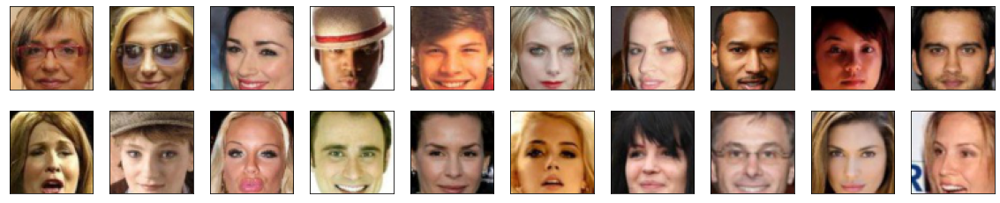

In [7]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""

def denormalize(images):
    """Transform images from [-1.0, 1.0] to [0, 255] and cast them to uint8."""
    return ((images + 1.) / 2. * 255).astype(np.uint8)

# plot the images in the batch, along with the corresponding labels
fig = plt.figure(figsize=(20, 4))
plot_size=20
for idx in np.arange(plot_size):
    ax = fig.add_subplot(2, int(plot_size/2), idx+1, xticks=[], yticks=[])
    img = dataset[idx].numpy()
    img = np.transpose(img, (1, 2, 0))
    img = denormalize(img)
    ax.imshow(img)

## Model implementation

As you know, a GAN is comprised of two adversarial networks, a discriminator and a generator. Now that we have a working data pipeline, we need to implement the discriminator and the generator. 

Feel free to implement any additional class or function.

### Exercise: Create the discriminator

The discriminator's job is to score real and fake images. You have two constraints here:
* the discriminator takes as input a **batch of 64x64x3 images**
* the output should be a single value (=score)

Feel free to get inspiration from the different architectures we talked about in the course, such as DCGAN, WGAN-GP or DRAGAN.

#### Some tips
* To scale down from the input image, you can either use `Conv2d` layers with the correct hyperparameters or Pooling layers.
* If you plan on using gradient penalty, do not use Batch Normalization layers in the discriminator.

In [8]:
import torch
import torch.nn as nn
from torch.nn import Module
from torch.nn.functional import interpolate

In [9]:
# Helper function for the fade-in mechanism
def fade_in(low_res, high_res, alpha):
    # Resize low_res to match the dimensions of high_res
    return alpha * high_res + (1 - alpha) * low_res

In [10]:
import torch.nn.functional as F
class Discriminator(Module):
    def __init__(self, max_resolution=64):
        super(Discriminator, self).__init__()
        # TODO: instantiate the different layers
        # Initial RGB layers for each resolution step
        self.from_rgb = nn.ModuleList([
            nn.Conv2d(3, 512, kernel_size=1),  # 4x4
            nn.Conv2d(3, 512, kernel_size=1),  # 8x8
            nn.Conv2d(3, 256, kernel_size=1), # 16x16
            nn.Conv2d(3, 128, kernel_size=1), # 32x32
            nn.Conv2d(3, 64, kernel_size=1),  # 64x64
        ])
        
        # Progressive blocks for each resolution step
        self.progressive_blocks = nn.ModuleList([
            self._create_progressive_block(512, 512),  # 8x8 -> 4x4
            self._create_progressive_block(256, 512), # 16x16 -> 8x8
            self._create_progressive_block(128, 256), # 32x32 -> 16x16
            self._create_progressive_block(64, 128), # 64x64 -> 32x32
        ])

        # Final block for 4x4 resolution
        self.final_block = nn.Sequential(
            nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=1, bias=False),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3),
            nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0)  # Output single score
        )

    def _create_progressive_block(self, in_channels, out_channels):
        """Creates a progressive block with downsampling for the discriminator."""
        return nn.Sequential(
            nn.Conv2d(in_channels, in_channels, kernel_size=3, stride=1, padding=1, bias=False),
            nn.BatchNorm2d(in_channels),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3),
            nn.Conv2d(in_channels, out_channels, kernel_size=3, stride=1, padding=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3),
            nn.AvgPool2d(2),  # Downsampling
        )

    def minibatch_stddev(self, x):
        """Adds a minibatch standard deviation layer to help combat mode collapse."""
        batch_std = torch.std(x, dim=0, keepdim=True)  # Standard deviation across batch
        mean_std = batch_std.mean().expand_as(x[:, :1, :, :])
        return torch.cat([x, mean_std], dim=1)  # Add to the batch as an extra channel

    def forward(self, z, resolution_step=4, alpha=1.0):
        # Initial layer
        x = self.from_rgb[resolution_step](z)
        if resolution_step > 0:
            # Progressive blocks with fade-in for smooth transition
            for i in range(resolution_step, 0, -1):
                if i == resolution_step:
                    # Fade-in mechanism
                    low_res = nn.functional.avg_pool2d(z, kernel_size=2)
                    low_res = self.from_rgb[resolution_step - 1](low_res)
                    high_res = self.progressive_blocks[i - 1](x)
                    x = fade_in(low_res, high_res, alpha)
                else:
                    x = self.progressive_blocks[i - 1](x)
        return self.final_block(x)

In [11]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to check your discriminator implementation
discriminator = Discriminator()
tests.check_discriminator(discriminator)

Congrats, your discriminator implementation passed all the tests


### Exercise: create the generator

The generator's job creates the "fake images" and learns the dataset distribution. You have three constraints here:
* the generator takes as input a vector of dimension `[batch_size, latent_dimension, 1, 1]`
* the generator must outputs **64x64x3 images**

Feel free to get inspiration from the different architectures we talked about in the course, such as DCGAN, WGAN-GP or DRAGAN.

#### Some tips:
* to scale up from the latent vector input, you can use `ConvTranspose2d` layers
* as often with Gan, **Batch Normalization** helps with training

In [12]:
class Generator(nn.Module):
    """
    Generator: takes a latent vector as input and output an image.
    args:
    - latent_dim: dimension of the input latent vector
    - max_resolution: max image resolution
    """
    def __init__(self, latent_dim: int, max_resolution: int=64):
        super(Generator, self).__init__()

        # Latent vector (Z) to initial 4x4 image
        self.init_block = nn.Sequential(
            nn.ConvTranspose2d(latent_dim, 512, kernel_size=4, bias=False), # bias false if use batchnorm
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2),
            nn.Conv2d(512, 512, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2)
        )
        
        # List to store the progressively growing blocks
        self.progressive_blocks = nn.ModuleList([
            self._create_progressive_block(512, 512),  # 8x8
            self._create_progressive_block(512, 256),  # 16x16
            self._create_progressive_block(256, 128),  # 32x32
            self._create_progressive_block(128, 64)  # 64x64
        ])
        
        # Final RGB layer for generating 3-channel images
        self.to_rgb = nn.ModuleList([
            nn.Conv2d(512, 3, kernel_size=1),  # 4x4
            nn.Conv2d(512, 3, kernel_size=1),  # 8x8
            nn.Conv2d(256, 3, kernel_size=1), # 16x16
            nn.Conv2d(128, 3, kernel_size=1), # 32x32
            nn.Conv2d(64, 3, kernel_size=1)  # 64x64
        ])
        self.final_act = nn.Tanh()
    def _create_progressive_block(self, in_channels, out_channels):
        """Creates a progressive block with upsampling."""
        return nn.Sequential(
            nn.Upsample(scale_factor=2),  # Upsample to double the resolution
            nn.Conv2d(in_channels, out_channels, kernel_size=3, stride=1, padding=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU(0.2),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, stride=1, padding=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU(0.2)
        )

    def forward(self, z, resolution_step=4, alpha=1.0):
        # Initial 4x4 image from latent vector (Z)
        x = self.init_block(z)
        
        if resolution_step == 0:
            # Convert to RGB image
            x = self.to_rgb[0](x)

        if resolution_step > 0:
            # Progressively grow the image by passing through the blocks
            for i in range(resolution_step):
                if i + 1 == resolution_step:
                    low_res = interpolate(x, scale_factor=2)
                    # Convert to RGB image
                    low_res = self.to_rgb[i](low_res) 
                    x = self.progressive_blocks[i](x)
                    # Convert to RGB image
                    high_res = self.to_rgb[resolution_step](x)
                    x = fade_in(low_res, high_res, alpha)
                    break
                else:
                    x = self.progressive_blocks[i](x)
        # Convert to RGB image
        return self.final_act(x)

In [13]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to verify your generator implementation
latent_dim = 128
generator = Generator(latent_dim)
tests.check_generator(generator, latent_dim)

Congrats, your generator implementation passed all the tests


## Optimizer

In the following section, we create the optimizers for the generator and discriminator. You may want to experiment with different optimizers, learning rates and other hyperparameters as they tend to impact the output quality.

### Exercise: implement the optimizers

In [14]:
import torch.optim as optim
import torch.optim.lr_scheduler as lr_scheduler

# params
train_on_gpu = torch.cuda.is_available()   
lr = 0.001
beta1 = [0, 0.99]
beta2 = [0, 0.99]


def create_optimizers(generator: Module, discriminator: Module):
    """ This function should return the optimizers of the generator and the discriminator """
    # TODO: implement the generator and discriminator optimizers
    g_optimizer = optim.Adam(generator.parameters(), lr, betas=beta1)
    d_optimizer = optim.Adam(discriminator.parameters(), lr, betas=beta1)
    return g_optimizer, d_optimizer

## Losses implementation

In this section, we are going to implement the loss function for the generator and the discriminator. You can and should experiment with different loss function.

Some tips:
* You can choose the commonly used the binary cross entropy loss or select other losses we have discovered in the course, such as the Wasserstein distance.
* You may want to implement a gradient penalty function as discussed in the course. It is not required and the code will work whether you implement it or not.

### Exercise: implement the generator loss

The generator's goal is to get the discriminator to think its generated images (= "fake" images) are real.

In [15]:
def generator_loss(fake_logits):
    """ Generator loss, takes the fake scores as inputs. """
    # TODO: implement the generator loss 
    loss = -torch.mean(fake_logits)
    return loss

### Exercise: implement the discriminator loss

We want the discriminator to give high scores to real images and low scores to fake ones and the discriminator loss should reflect that.

In [16]:
def discriminator_loss(real_logits, fake_logits):
    """ Discriminator loss, takes the fake and real logits as inputs. """
    # TODO: implement the discriminator loss 
    loss = -torch.mean(real_logits) + torch.mean(fake_logits)

    return loss

### Exercise (Optional): Implement the gradient Penalty

In the course, we discussed the importance of gradient penalty in training certain types of Gans. Implementing this function is not required and depends on some of the design decision you made (discriminator architecture, loss functions).

In [17]:
def gradient_penalty(discriminator, real_samples, fake_samples, resolution_step, alpha = 1.0):
    """ This function enforces """
    gp = 0
#     # TODO (Optional): implement the gradient penalty
#     # sample a random point between both distributions

#     _alpha = torch.randn(real_samples.shape, requires_grad=True).to(device)
#     x_hat = _alpha * real_samples + (1 - _alpha) * fake_samples
#     # run this sample through the discriminator and calculate the gradient  ∇𝑥̂ 𝐷(𝑥̂ )
#     d_interpolated = discriminator(x_hat, resolution_step, alpha)
#     # calculate the L2 norm of the gradient  ||∇𝑥̂ 𝐷(𝑥̂ )||2
#     gradients = torch.autograd.grad(
#         outputs=d_interpolated,
#         inputs=x_hat,
#         grad_outputs=torch.ones_like(d_interpolated),
#         create_graph=True,
#         retain_graph=True,
#         only_inputs=True
#     )[0]
#     # Reshape gradients and compute gradient norm
#     gradients = gradients.view(-1)
#     gradient_norm = torch.norm(gradients, 2)

#     # Compute gradient penalty
#     gp = ((gradient_norm - 1) ** 2).mean()
    
    return gp

## Training


Training will involve alternating between training the discriminator and the generator. You'll use your functions real_loss and fake_loss to help you calculate the discriminator losses.

* You should train the discriminator by alternating on real and fake images
* Then the generator, which tries to trick the discriminator and should have an opposing loss function

### Exercise: implement the generator step and the discriminator step functions

Each function should do the following:
* calculate the loss
* backpropagate the gradient
* perform one optimizer step

In [18]:
def generator_step(batch_size: int, latent_dim: int, resolution_step: int, alpha: float=1.0) -> Dict:
    """ One training step of the generator. """
    # TODO: implement the generator step (foward pass, loss calculation and backward pass)
    # 1. clear the gradients of all optimized variables
    g_optimizer.zero_grad()  # -
    # 2. forward pass: compute predicted outputs by passing inputs to the model
    z = torch.randn(batch_size, latent_dim, 1, 1).float()
    z = z.to(device)
    fake_image = generator(z, resolution_step, alpha)
    fake_output = discriminator(fake_image, resolution_step, alpha)

    # 3. calculate the loss
    g_loss = generator_loss(fake_output)  # =
    # 4. backward pass: compute gradient of the loss with respect to model parameters
    g_loss.backward()  # -
    # 5. perform a single optimization step (parameter update)
    g_optimizer.step()
    return {'loss': g_loss}


def discriminator_step(batch_size: int, latent_dim: int, real_images: torch.Tensor, resolution_step: int, alpha: float=1.0) -> Dict:
    """ One training step of the discriminator. """
    # TODO: implement the discriminator step (foward pass, loss calculation and backward pass)
    # Resize real samples to match fake samples' size at the current resolution step
    current_resolution = 4 * (2 ** resolution_step)  # Calculate resolution (4x4, 8x8, ..., 64x64)
    real_images_resized = interpolate(real_images, size=(current_resolution, current_resolution), mode='bilinear', align_corners=False)
    # 1. clear the gradients of all optimized variables
    d_optimizer.zero_grad()  # -
    # 2. Compute Discriminator Losses on real images
    real_output = discriminator(real_images_resized, resolution_step, alpha)  # =

    # we do not need the gradients
    with torch.no_grad():
        z = torch.randn(batch_size, latent_dim, 1, 1).float()
        z = z.to(device)
        fake_image = generator(z, resolution_step, alpha)

    # 3. Calculate Discriminator Losses on fake images
    fake_output = discriminator(fake_image.detach(), resolution_step, alpha)

    d_loss = discriminator_loss(real_output, fake_output)
    gp = gradient_penalty(discriminator, real_images_resized, fake_image.detach(), resolution_step, alpha)
    
    d_loss_total = d_loss + 10 * gp

    # 4. backward pass: compute gradient of the loss with respect to model parameters
    d_loss_total.backward()  # -
    # 5. perform a single optimization step (parameter update)
    d_optimizer.step()

    return {'loss': d_loss_total, 'gp': gp}

### Main training loop

You don't have to implement anything here but you can experiment with different hyperparameters.

In [19]:
def checkpoint(iteration, g_model, d_model, checkpoint_dir=''):
    """Saves the parameters of both generator g_model and discriminator d_model
        """
    _device='cpu'
    G_path = os.path.join(checkpoint_dir, 'g_model_pro_gp.pkl')
    D_path = os.path.join(checkpoint_dir, 'd_model_pro_gp.pkl')
    g_model.to(_device)
    d_model.to(_device)
    torch.save(g_model.state_dict(), G_path)
    torch.save(d_model.state_dict(), D_path)

# checkpoint(23, generator, discriminator)
def load_checkpoint(g_model, d_model, checkpoint_dir=''):
    G_path = os.path.join(checkpoint_dir, 'g_model_pro_gp.pkl')
    D_path = os.path.join(checkpoint_dir, 'd_model_pro_gp.pkl')
    _device='cpu'

    if os.path.exists(G_path):
        G_state = torch.load(G_path, map_location=_device)
        g_model.load_state_dict(G_state)

    if os.path.exists(D_path):
        D_state = torch.load(D_path, map_location=_device)
        d_model.load_state_dict(D_state)
    
    return g_model, d_model

In [20]:
from datetime import datetime

In [21]:
# you can experiment with different dimensions of latent spaces
latent_dim = 128

# update to cpu if you do not have access to a gpu
device = 'cpu'
if train_on_gpu:
    device = 'cuda'

# number of epochs to train your model
n_epochs = 100

# number of images in each batch
batch_size = 64

In [22]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
print_every = 50

# Create optimizers for the discriminator D and generator G
generator = Generator(latent_dim)
discriminator = Discriminator()
# load_checkpoint(generator, discriminator)
generator.to(device)
discriminator.to(device)

g_optimizer, d_optimizer = create_optimizers(generator, discriminator)

d_scheduler = lr_scheduler.LinearLR(d_optimizer, start_factor=1.0, end_factor=0.05, total_iters=n_epochs)
g_scheduler = lr_scheduler.LinearLR(g_optimizer, start_factor=1.0, end_factor=0.05, total_iters=n_epochs)

dataloader = DataLoader(dataset, 
                        batch_size=64, 
                        shuffle=True, 
                        num_workers=4, 
                        drop_last=True,
                        pin_memory=False)

In [23]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""

def display(fixed_latent_vector: torch.Tensor):
    """ helper function to display images during training """
    fig = plt.figure(figsize=(14, 4))
    plot_size = 16
    for idx in np.arange(plot_size):
        ax = fig.add_subplot(2, int(plot_size/2), idx+1, xticks=[], yticks=[])
        img = fixed_latent_vector[idx, ...].detach().cpu().numpy()
        img = np.transpose(img, (1, 2, 0))
        img = denormalize(img)
        ax.imshow(img)
    plt.show()

### Exercise: implement the training strategy

You should experiment with different training strategies. For example:

* train the generator more often than the discriminator. 
* added noise to the input image
* use label smoothing

Implement with your training strategy below.

2024-10-31 05:00:11 | Epoch [1/100] | Batch 0/509 | d_loss: -10.9210 | g_loss: 8.7624
2024-10-31 05:00:16 | Epoch [1/100] | Batch 50/509 | d_loss: -217.4878 | g_loss: -45.3172
2024-10-31 05:00:19 | Epoch [1/100] | Batch 100/509 | d_loss: -120.2271 | g_loss: -204.0636
2024-10-31 05:00:23 | Epoch [1/100] | Batch 150/509 | d_loss: -31.1537 | g_loss: -334.6727
2024-10-31 05:00:27 | Epoch [1/100] | Batch 200/509 | d_loss: -10.2384 | g_loss: 56.3413
2024-10-31 05:00:31 | Epoch [1/100] | Batch 250/509 | d_loss: -4.4854 | g_loss: 73.8846
2024-10-31 05:00:35 | Epoch [1/100] | Batch 300/509 | d_loss: -7.0690 | g_loss: 95.3946
2024-10-31 05:00:39 | Epoch [1/100] | Batch 350/509 | d_loss: -6.9898 | g_loss: 110.0074
2024-10-31 05:00:43 | Epoch [1/100] | Batch 400/509 | d_loss: -4.2648 | g_loss: 98.1883
2024-10-31 05:00:46 | Epoch [1/100] | Batch 450/509 | d_loss: 3.3406 | g_loss: 128.9506
2024-10-31 05:00:50 | Epoch [1/100] | Batch 500/509 | d_loss: -10.3421 | g_loss: 83.8706


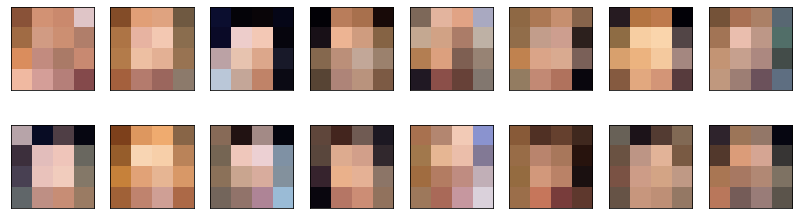

2024-10-31 05:00:55 | Epoch [2/100] | Batch 0/509 | d_loss: -3.7862 | g_loss: 116.1962
2024-10-31 05:00:59 | Epoch [2/100] | Batch 50/509 | d_loss: 6.5582 | g_loss: 123.4026
2024-10-31 05:01:02 | Epoch [2/100] | Batch 100/509 | d_loss: 0.1041 | g_loss: 108.4323
2024-10-31 05:01:06 | Epoch [2/100] | Batch 150/509 | d_loss: 1.2955 | g_loss: 115.0339
2024-10-31 05:01:10 | Epoch [2/100] | Batch 200/509 | d_loss: -4.0347 | g_loss: 108.9263
2024-10-31 05:01:13 | Epoch [2/100] | Batch 250/509 | d_loss: 1.9593 | g_loss: 82.7653
2024-10-31 05:01:17 | Epoch [2/100] | Batch 300/509 | d_loss: -15.4113 | g_loss: -15.3962
2024-10-31 05:01:21 | Epoch [2/100] | Batch 350/509 | d_loss: -12.3198 | g_loss: 228.7849
2024-10-31 05:01:24 | Epoch [2/100] | Batch 400/509 | d_loss: -10.9342 | g_loss: 226.0430
2024-10-31 05:01:28 | Epoch [2/100] | Batch 450/509 | d_loss: -6.4433 | g_loss: 240.5174
2024-10-31 05:01:32 | Epoch [2/100] | Batch 500/509 | d_loss: 2.1481 | g_loss: 211.1240


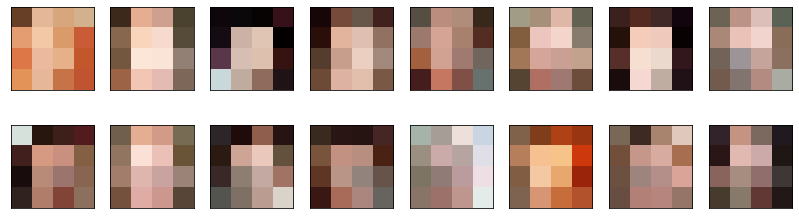

2024-10-31 05:01:36 | Epoch [3/100] | Batch 0/509 | d_loss: -0.2910 | g_loss: 232.1141
2024-10-31 05:01:40 | Epoch [3/100] | Batch 50/509 | d_loss: -11.2196 | g_loss: 236.1307
2024-10-31 05:01:44 | Epoch [3/100] | Batch 100/509 | d_loss: -24.3872 | g_loss: 292.9579
2024-10-31 05:01:48 | Epoch [3/100] | Batch 150/509 | d_loss: 0.4933 | g_loss: 285.6049
2024-10-31 05:01:51 | Epoch [3/100] | Batch 200/509 | d_loss: -4.7532 | g_loss: 282.7211
2024-10-31 05:01:55 | Epoch [3/100] | Batch 250/509 | d_loss: -0.6117 | g_loss: 279.9802
2024-10-31 05:01:59 | Epoch [3/100] | Batch 300/509 | d_loss: -29.8974 | g_loss: 223.3400
2024-10-31 05:02:03 | Epoch [3/100] | Batch 350/509 | d_loss: 1.4768 | g_loss: 307.7201
2024-10-31 05:02:06 | Epoch [3/100] | Batch 400/509 | d_loss: 7.8825 | g_loss: 301.9630
2024-10-31 05:02:11 | Epoch [3/100] | Batch 450/509 | d_loss: -4.0976 | g_loss: 264.0359
2024-10-31 05:02:15 | Epoch [3/100] | Batch 500/509 | d_loss: 1.1075 | g_loss: 265.3369


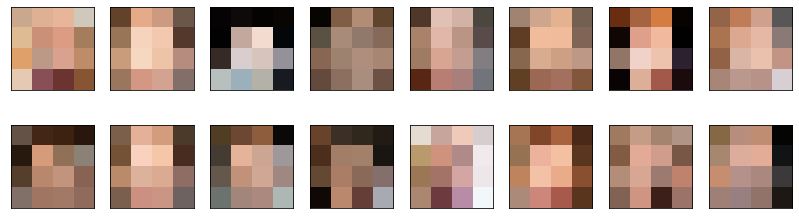

2024-10-31 05:02:19 | Epoch [4/100] | Batch 0/509 | d_loss: -15.2815 | g_loss: 267.9924
2024-10-31 05:02:23 | Epoch [4/100] | Batch 50/509 | d_loss: -47.5135 | g_loss: 21.2887
2024-10-31 05:02:27 | Epoch [4/100] | Batch 100/509 | d_loss: -5.4076 | g_loss: 211.7022
2024-10-31 05:02:31 | Epoch [4/100] | Batch 150/509 | d_loss: -0.9457 | g_loss: 263.0646
2024-10-31 05:02:35 | Epoch [4/100] | Batch 200/509 | d_loss: -8.5410 | g_loss: 294.0085
2024-10-31 05:02:39 | Epoch [4/100] | Batch 250/509 | d_loss: -14.2984 | g_loss: 292.7925
2024-10-31 05:02:43 | Epoch [4/100] | Batch 300/509 | d_loss: -16.3789 | g_loss: 280.4322
2024-10-31 05:02:47 | Epoch [4/100] | Batch 350/509 | d_loss: -13.2439 | g_loss: 293.4492
2024-10-31 05:02:51 | Epoch [4/100] | Batch 400/509 | d_loss: 5.0119 | g_loss: 323.1797
2024-10-31 05:02:54 | Epoch [4/100] | Batch 450/509 | d_loss: 6.2076 | g_loss: 296.9226
2024-10-31 05:02:58 | Epoch [4/100] | Batch 500/509 | d_loss: 8.0665 | g_loss: 331.6915


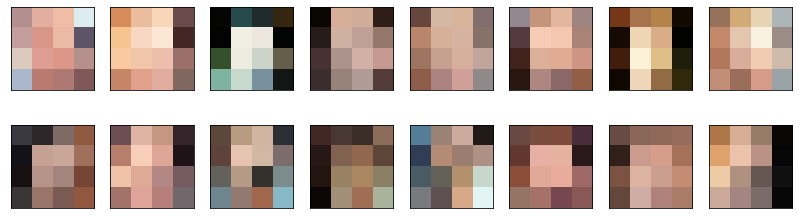

2024-10-31 05:03:03 | Epoch [5/100] | Batch 0/509 | d_loss: 4.7853 | g_loss: 337.6011
2024-10-31 05:03:07 | Epoch [5/100] | Batch 50/509 | d_loss: -7.2627 | g_loss: 330.1228
2024-10-31 05:03:11 | Epoch [5/100] | Batch 100/509 | d_loss: -12.2881 | g_loss: 297.5274
2024-10-31 05:03:14 | Epoch [5/100] | Batch 150/509 | d_loss: -12.6223 | g_loss: 331.0259
2024-10-31 05:03:18 | Epoch [5/100] | Batch 200/509 | d_loss: -3.9818 | g_loss: 312.0004
2024-10-31 05:03:22 | Epoch [5/100] | Batch 250/509 | d_loss: -15.2726 | g_loss: 326.7173
2024-10-31 05:03:26 | Epoch [5/100] | Batch 300/509 | d_loss: 1.3766 | g_loss: 315.6736
2024-10-31 05:03:30 | Epoch [5/100] | Batch 350/509 | d_loss: -9.0434 | g_loss: 350.0534
2024-10-31 05:03:34 | Epoch [5/100] | Batch 400/509 | d_loss: -59.9659 | g_loss: 265.3182
2024-10-31 05:03:37 | Epoch [5/100] | Batch 450/509 | d_loss: 17.8859 | g_loss: 319.8051
2024-10-31 05:03:41 | Epoch [5/100] | Batch 500/509 | d_loss: -15.2661 | g_loss: 350.9178


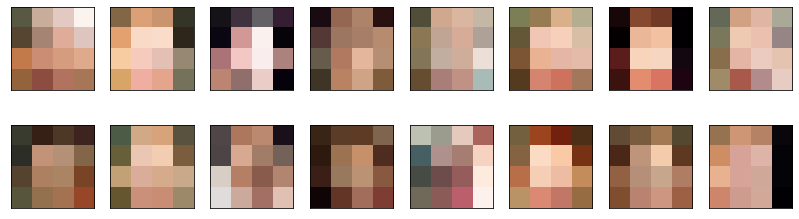

2024-10-31 05:03:46 | Epoch [6/100] | Batch 0/509 | d_loss: -9.1592 | g_loss: 369.9953
2024-10-31 05:03:51 | Epoch [6/100] | Batch 50/509 | d_loss: -2.8536 | g_loss: 363.0796
2024-10-31 05:03:54 | Epoch [6/100] | Batch 100/509 | d_loss: -14.9868 | g_loss: 357.3517
2024-10-31 05:03:58 | Epoch [6/100] | Batch 150/509 | d_loss: -2.7026 | g_loss: 378.0949
2024-10-31 05:04:02 | Epoch [6/100] | Batch 200/509 | d_loss: -11.7919 | g_loss: 339.3323
2024-10-31 05:04:06 | Epoch [6/100] | Batch 250/509 | d_loss: -2.0347 | g_loss: 390.5659
2024-10-31 05:04:10 | Epoch [6/100] | Batch 300/509 | d_loss: 5.8796 | g_loss: 337.8275
2024-10-31 05:04:13 | Epoch [6/100] | Batch 350/509 | d_loss: 3.5785 | g_loss: 362.7830
2024-10-31 05:04:17 | Epoch [6/100] | Batch 400/509 | d_loss: 1.1796 | g_loss: 353.1755
2024-10-31 05:04:21 | Epoch [6/100] | Batch 450/509 | d_loss: 2.1348 | g_loss: 354.6453
2024-10-31 05:04:24 | Epoch [6/100] | Batch 500/509 | d_loss: -0.4656 | g_loss: 336.1613


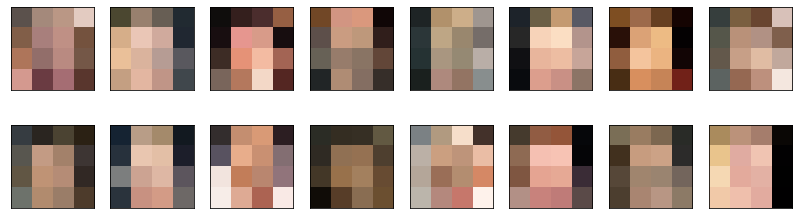

2024-10-31 05:04:29 | Epoch [7/100] | Batch 0/509 | d_loss: -9.4465 | g_loss: 350.4844
2024-10-31 05:04:33 | Epoch [7/100] | Batch 50/509 | d_loss: -4.9847 | g_loss: 353.9408
2024-10-31 05:04:36 | Epoch [7/100] | Batch 100/509 | d_loss: 2.1835 | g_loss: 334.1742
2024-10-31 05:04:40 | Epoch [7/100] | Batch 150/509 | d_loss: -4.8290 | g_loss: 361.1437
2024-10-31 05:04:43 | Epoch [7/100] | Batch 200/509 | d_loss: -0.5588 | g_loss: 363.5915
2024-10-31 05:04:47 | Epoch [7/100] | Batch 250/509 | d_loss: -9.5178 | g_loss: 350.9038
2024-10-31 05:04:51 | Epoch [7/100] | Batch 300/509 | d_loss: -3.4560 | g_loss: 344.6977
2024-10-31 05:04:54 | Epoch [7/100] | Batch 350/509 | d_loss: -2.0374 | g_loss: 363.1570
2024-10-31 05:04:58 | Epoch [7/100] | Batch 400/509 | d_loss: -0.9132 | g_loss: 370.2565
2024-10-31 05:05:02 | Epoch [7/100] | Batch 450/509 | d_loss: 0.6003 | g_loss: 362.5226
2024-10-31 05:05:05 | Epoch [7/100] | Batch 500/509 | d_loss: 7.8412 | g_loss: 368.9000


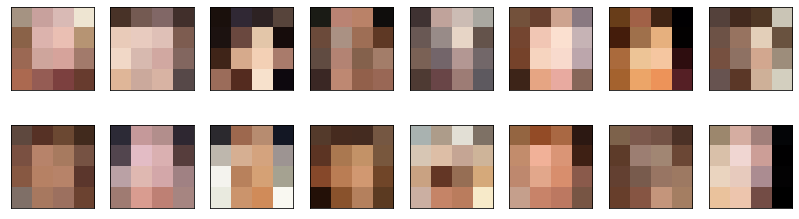

2024-10-31 05:05:10 | Epoch [8/100] | Batch 0/509 | d_loss: -11.5748 | g_loss: 365.9990
2024-10-31 05:05:14 | Epoch [8/100] | Batch 50/509 | d_loss: -3.3248 | g_loss: 342.4267
2024-10-31 05:05:18 | Epoch [8/100] | Batch 100/509 | d_loss: 2.3351 | g_loss: 357.1987
2024-10-31 05:05:21 | Epoch [8/100] | Batch 150/509 | d_loss: -2.7828 | g_loss: 387.3989
2024-10-31 05:05:25 | Epoch [8/100] | Batch 200/509 | d_loss: 0.5850 | g_loss: 353.3857
2024-10-31 05:05:29 | Epoch [8/100] | Batch 250/509 | d_loss: -6.3695 | g_loss: 353.7230
2024-10-31 05:05:32 | Epoch [8/100] | Batch 300/509 | d_loss: 2.9849 | g_loss: 372.0982
2024-10-31 05:05:36 | Epoch [8/100] | Batch 350/509 | d_loss: -0.9201 | g_loss: 381.7703
2024-10-31 05:05:39 | Epoch [8/100] | Batch 400/509 | d_loss: 1.9337 | g_loss: 355.4132
2024-10-31 05:05:43 | Epoch [8/100] | Batch 450/509 | d_loss: -11.0363 | g_loss: 375.9797
2024-10-31 05:05:47 | Epoch [8/100] | Batch 500/509 | d_loss: -4.6077 | g_loss: 387.7874


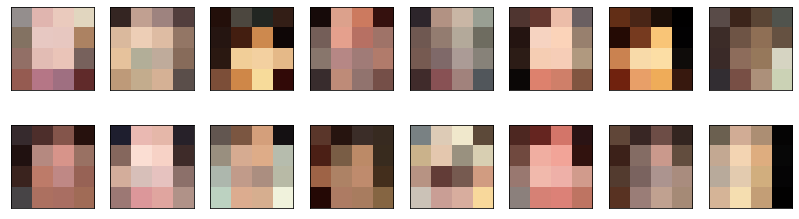

2024-10-31 05:05:52 | Epoch [9/100] | Batch 0/509 | d_loss: -5.3885 | g_loss: 400.3688
2024-10-31 05:05:56 | Epoch [9/100] | Batch 50/509 | d_loss: 2.0410 | g_loss: 384.5815
2024-10-31 05:06:00 | Epoch [9/100] | Batch 100/509 | d_loss: -10.1173 | g_loss: 370.5700
2024-10-31 05:06:04 | Epoch [9/100] | Batch 150/509 | d_loss: -6.9611 | g_loss: 383.9640
2024-10-31 05:06:08 | Epoch [9/100] | Batch 200/509 | d_loss: -7.2156 | g_loss: 392.3410
2024-10-31 05:06:11 | Epoch [9/100] | Batch 250/509 | d_loss: -2.0182 | g_loss: 391.9692
2024-10-31 05:06:15 | Epoch [9/100] | Batch 300/509 | d_loss: 1.1064 | g_loss: 399.6513
2024-10-31 05:06:19 | Epoch [9/100] | Batch 350/509 | d_loss: -5.8334 | g_loss: 420.7079
2024-10-31 05:06:22 | Epoch [9/100] | Batch 400/509 | d_loss: 0.5233 | g_loss: 394.8831
2024-10-31 05:06:26 | Epoch [9/100] | Batch 450/509 | d_loss: -2.3651 | g_loss: 412.8911
2024-10-31 05:06:30 | Epoch [9/100] | Batch 500/509 | d_loss: -3.2902 | g_loss: 385.9188


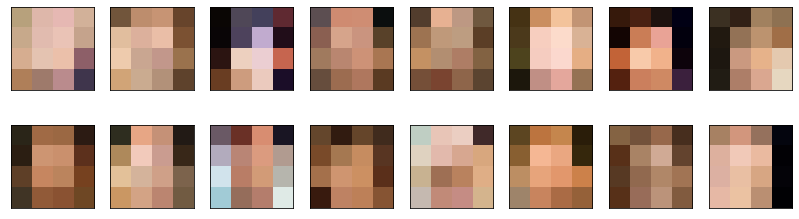

2024-10-31 05:06:34 | Epoch [10/100] | Batch 0/509 | d_loss: -10.5188 | g_loss: 402.3878
2024-10-31 05:06:38 | Epoch [10/100] | Batch 50/509 | d_loss: 2.9370 | g_loss: 366.2476
2024-10-31 05:06:42 | Epoch [10/100] | Batch 100/509 | d_loss: -5.2845 | g_loss: 397.2343
2024-10-31 05:06:45 | Epoch [10/100] | Batch 150/509 | d_loss: -1.8431 | g_loss: 412.5710
2024-10-31 05:06:49 | Epoch [10/100] | Batch 200/509 | d_loss: 6.9047 | g_loss: 386.1164
2024-10-31 05:06:53 | Epoch [10/100] | Batch 250/509 | d_loss: 9.8360 | g_loss: 409.3051
2024-10-31 05:06:56 | Epoch [10/100] | Batch 300/509 | d_loss: 5.5270 | g_loss: 394.4140
2024-10-31 05:07:00 | Epoch [10/100] | Batch 350/509 | d_loss: -11.2842 | g_loss: 409.6945
2024-10-31 05:07:03 | Epoch [10/100] | Batch 400/509 | d_loss: 0.5075 | g_loss: 418.6253
2024-10-31 05:07:07 | Epoch [10/100] | Batch 450/509 | d_loss: 14.3647 | g_loss: 409.3187
2024-10-31 05:07:11 | Epoch [10/100] | Batch 500/509 | d_loss: 7.9060 | g_loss: 401.8852


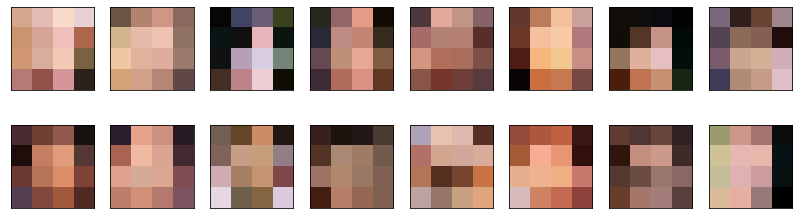

2024-10-31 05:07:14 | Epoch [11/100] | Batch 0/509 | d_loss: -7.1117 | g_loss: 421.4840
2024-10-31 05:07:18 | Epoch [11/100] | Batch 50/509 | d_loss: 3.4499 | g_loss: 404.4391
2024-10-31 05:07:22 | Epoch [11/100] | Batch 100/509 | d_loss: -3.1745 | g_loss: 424.3505
2024-10-31 05:07:26 | Epoch [11/100] | Batch 150/509 | d_loss: -3.3256 | g_loss: 435.4717
2024-10-31 05:07:29 | Epoch [11/100] | Batch 200/509 | d_loss: -3.0655 | g_loss: 407.1219
2024-10-31 05:07:33 | Epoch [11/100] | Batch 250/509 | d_loss: -0.4872 | g_loss: 435.8416
2024-10-31 05:07:36 | Epoch [11/100] | Batch 300/509 | d_loss: -11.2687 | g_loss: 409.2607
2024-10-31 05:07:40 | Epoch [11/100] | Batch 350/509 | d_loss: -6.2628 | g_loss: 441.7891
2024-10-31 05:07:43 | Epoch [11/100] | Batch 400/509 | d_loss: -6.4519 | g_loss: 427.6831
2024-10-31 05:07:47 | Epoch [11/100] | Batch 450/509 | d_loss: -2.2992 | g_loss: 419.4780
2024-10-31 05:07:51 | Epoch [11/100] | Batch 500/509 | d_loss: -4.1710 | g_loss: 430.9229


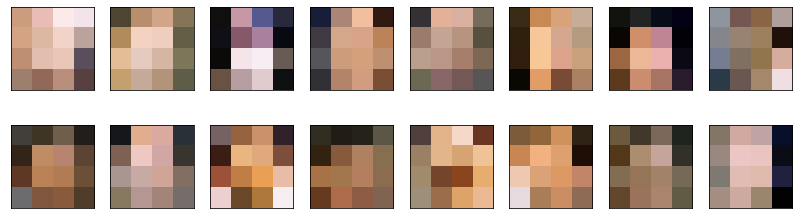

2024-10-31 05:07:55 | Epoch [12/100] | Batch 0/509 | d_loss: -24.4071 | g_loss: 520.7018
2024-10-31 05:08:02 | Epoch [12/100] | Batch 50/509 | d_loss: -321.6800 | g_loss: -125.2452
2024-10-31 05:08:09 | Epoch [12/100] | Batch 100/509 | d_loss: -376.8240 | g_loss: -434.6909
2024-10-31 05:08:16 | Epoch [12/100] | Batch 150/509 | d_loss: -492.9754 | g_loss: 116.3800
2024-10-31 05:08:22 | Epoch [12/100] | Batch 200/509 | d_loss: -640.5732 | g_loss: -241.0132
2024-10-31 05:08:29 | Epoch [12/100] | Batch 250/509 | d_loss: -485.5875 | g_loss: 355.6685
2024-10-31 05:08:36 | Epoch [12/100] | Batch 300/509 | d_loss: -616.7183 | g_loss: 263.2463
2024-10-31 05:08:43 | Epoch [12/100] | Batch 350/509 | d_loss: -233.2400 | g_loss: -84.1998
2024-10-31 05:08:49 | Epoch [12/100] | Batch 400/509 | d_loss: -371.5060 | g_loss: -920.1639
2024-10-31 05:08:56 | Epoch [12/100] | Batch 450/509 | d_loss: -315.9428 | g_loss: -600.8103
2024-10-31 05:09:03 | Epoch [12/100] | Batch 500/509 | d_loss: -300.7999 | g_lo

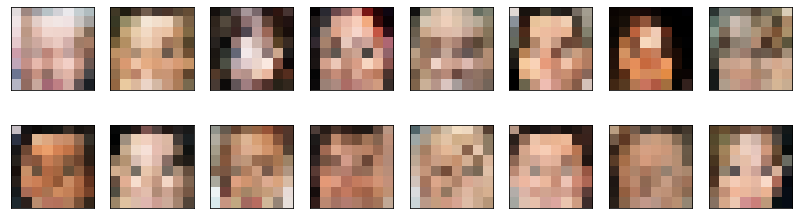

2024-10-31 05:09:09 | Epoch [13/100] | Batch 0/509 | d_loss: -511.3245 | g_loss: -3.6595
2024-10-31 05:09:16 | Epoch [13/100] | Batch 50/509 | d_loss: -75.1108 | g_loss: -1006.2161
2024-10-31 05:09:22 | Epoch [13/100] | Batch 100/509 | d_loss: -335.7310 | g_loss: -649.4770
2024-10-31 05:09:29 | Epoch [13/100] | Batch 150/509 | d_loss: -906.2985 | g_loss: 818.8805
2024-10-31 05:09:36 | Epoch [13/100] | Batch 200/509 | d_loss: -546.9127 | g_loss: 148.4296
2024-10-31 05:09:43 | Epoch [13/100] | Batch 250/509 | d_loss: -614.4000 | g_loss: -575.7291
2024-10-31 05:09:49 | Epoch [13/100] | Batch 300/509 | d_loss: -1121.6604 | g_loss: 608.0214
2024-10-31 05:09:56 | Epoch [13/100] | Batch 350/509 | d_loss: -734.3514 | g_loss: -450.4951
2024-10-31 05:10:03 | Epoch [13/100] | Batch 400/509 | d_loss: -605.2375 | g_loss: -204.4044
2024-10-31 05:10:09 | Epoch [13/100] | Batch 450/509 | d_loss: -1088.6211 | g_loss: -1044.7239
2024-10-31 05:10:16 | Epoch [13/100] | Batch 500/509 | d_loss: -1105.0062 |

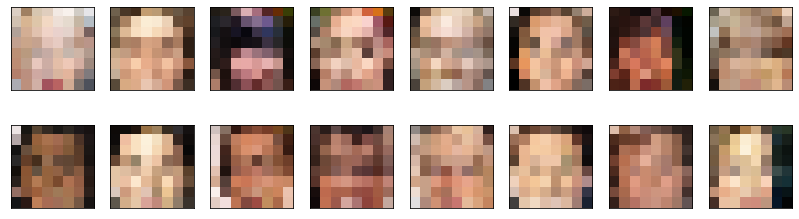

2024-10-31 05:10:21 | Epoch [14/100] | Batch 0/509 | d_loss: -853.7348 | g_loss: -668.6437
2024-10-31 05:10:27 | Epoch [14/100] | Batch 50/509 | d_loss: -421.2144 | g_loss: 1503.5957
2024-10-31 05:10:34 | Epoch [14/100] | Batch 100/509 | d_loss: -361.8143 | g_loss: 1360.0526
2024-10-31 05:10:41 | Epoch [14/100] | Batch 150/509 | d_loss: -1025.7085 | g_loss: -1015.4451
2024-10-31 05:10:47 | Epoch [14/100] | Batch 200/509 | d_loss: -968.5315 | g_loss: -579.0604
2024-10-31 05:10:54 | Epoch [14/100] | Batch 250/509 | d_loss: -1298.3069 | g_loss: 224.7239
2024-10-31 05:11:01 | Epoch [14/100] | Batch 300/509 | d_loss: -1855.8810 | g_loss: 594.6563
2024-10-31 05:11:07 | Epoch [14/100] | Batch 350/509 | d_loss: -974.7449 | g_loss: 156.4342
2024-10-31 05:11:14 | Epoch [14/100] | Batch 400/509 | d_loss: -2284.0352 | g_loss: 3682.3018
2024-10-31 05:11:21 | Epoch [14/100] | Batch 450/509 | d_loss: -1370.4663 | g_loss: -1045.1215
2024-10-31 05:11:28 | Epoch [14/100] | Batch 500/509 | d_loss: -1968.

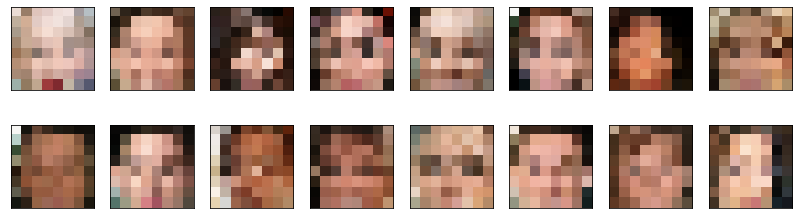

2024-10-31 05:11:33 | Epoch [15/100] | Batch 0/509 | d_loss: -504.7842 | g_loss: 386.1534
2024-10-31 05:11:39 | Epoch [15/100] | Batch 50/509 | d_loss: -1953.7015 | g_loss: 564.9990
2024-10-31 05:11:46 | Epoch [15/100] | Batch 100/509 | d_loss: -1654.5903 | g_loss: -2254.7759
2024-10-31 05:11:53 | Epoch [15/100] | Batch 150/509 | d_loss: -1536.3038 | g_loss: 1143.4055
2024-10-31 05:11:59 | Epoch [15/100] | Batch 200/509 | d_loss: -1554.7727 | g_loss: -543.6580
2024-10-31 05:12:06 | Epoch [15/100] | Batch 250/509 | d_loss: -1816.9917 | g_loss: -3171.1631
2024-10-31 05:12:13 | Epoch [15/100] | Batch 300/509 | d_loss: -1675.0317 | g_loss: 3620.9102
2024-10-31 05:12:19 | Epoch [15/100] | Batch 350/509 | d_loss: -1792.9980 | g_loss: -4817.2866
2024-10-31 05:12:26 | Epoch [15/100] | Batch 400/509 | d_loss: -1095.4255 | g_loss: -577.1664
2024-10-31 05:12:33 | Epoch [15/100] | Batch 450/509 | d_loss: -963.7863 | g_loss: 581.8110
2024-10-31 05:12:39 | Epoch [15/100] | Batch 500/509 | d_loss: -3

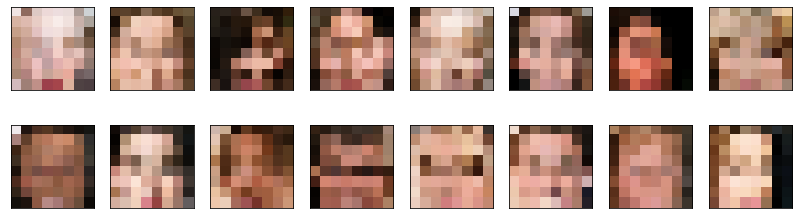

2024-10-31 05:12:45 | Epoch [16/100] | Batch 0/509 | d_loss: -958.6914 | g_loss: 8448.2480
2024-10-31 05:12:51 | Epoch [16/100] | Batch 50/509 | d_loss: -3096.5425 | g_loss: -2422.3816
2024-10-31 05:12:58 | Epoch [16/100] | Batch 100/509 | d_loss: -1858.1572 | g_loss: 116.7416
2024-10-31 05:13:05 | Epoch [16/100] | Batch 150/509 | d_loss: -3274.2334 | g_loss: -894.7755
2024-10-31 05:13:12 | Epoch [16/100] | Batch 200/509 | d_loss: -2352.6646 | g_loss: -816.3800
2024-10-31 05:13:18 | Epoch [16/100] | Batch 250/509 | d_loss: -2900.7168 | g_loss: -4330.3877
2024-10-31 05:13:25 | Epoch [16/100] | Batch 300/509 | d_loss: -2997.9629 | g_loss: 4193.3965
2024-10-31 05:13:32 | Epoch [16/100] | Batch 350/509 | d_loss: -5562.5371 | g_loss: 8152.8477
2024-10-31 05:13:38 | Epoch [16/100] | Batch 400/509 | d_loss: -2029.1777 | g_loss: -6553.8379
2024-10-31 05:13:45 | Epoch [16/100] | Batch 450/509 | d_loss: -1775.7466 | g_loss: -2461.4639
2024-10-31 05:13:52 | Epoch [16/100] | Batch 500/509 | d_loss

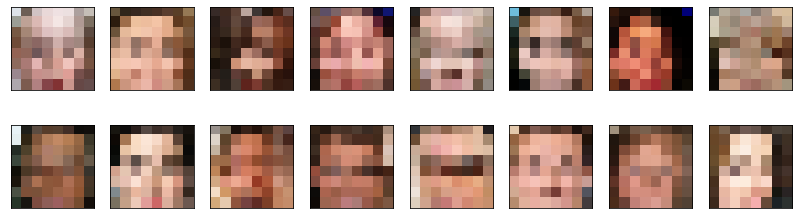

2024-10-31 05:13:57 | Epoch [17/100] | Batch 0/509 | d_loss: -3658.8867 | g_loss: -951.3424
2024-10-31 05:14:04 | Epoch [17/100] | Batch 50/509 | d_loss: -3267.7148 | g_loss: 328.0148
2024-10-31 05:14:11 | Epoch [17/100] | Batch 100/509 | d_loss: -2134.2915 | g_loss: -1689.9479
2024-10-31 05:14:17 | Epoch [17/100] | Batch 150/509 | d_loss: -3835.5857 | g_loss: -1376.2155
2024-10-31 05:14:24 | Epoch [17/100] | Batch 200/509 | d_loss: -5442.7700 | g_loss: 8609.0996
2024-10-31 05:14:31 | Epoch [17/100] | Batch 250/509 | d_loss: -2864.1646 | g_loss: 5083.7266
2024-10-31 05:14:38 | Epoch [17/100] | Batch 300/509 | d_loss: -3694.5474 | g_loss: 9467.6621
2024-10-31 05:14:45 | Epoch [17/100] | Batch 350/509 | d_loss: -4956.1045 | g_loss: 1845.5217
2024-10-31 05:14:51 | Epoch [17/100] | Batch 400/509 | d_loss: -5119.7979 | g_loss: 959.1547
2024-10-31 05:14:58 | Epoch [17/100] | Batch 450/509 | d_loss: -5980.0552 | g_loss: 9916.4922
2024-10-31 05:15:05 | Epoch [17/100] | Batch 500/509 | d_loss: 

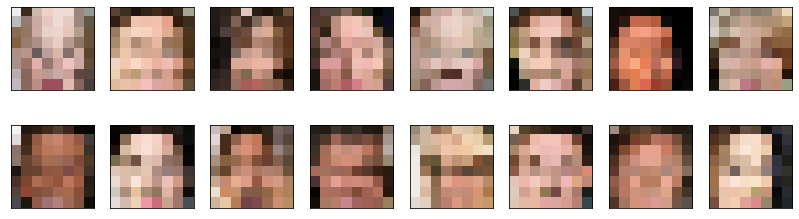

2024-10-31 05:15:11 | Epoch [18/100] | Batch 0/509 | d_loss: -7127.5962 | g_loss: 5199.9565
2024-10-31 05:15:18 | Epoch [18/100] | Batch 50/509 | d_loss: -6780.7993 | g_loss: -71.9346
2024-10-31 05:15:25 | Epoch [18/100] | Batch 100/509 | d_loss: -1809.6553 | g_loss: 8146.6221
2024-10-31 05:15:32 | Epoch [18/100] | Batch 150/509 | d_loss: -4755.3481 | g_loss: -2491.9731
2024-10-31 05:15:38 | Epoch [18/100] | Batch 200/509 | d_loss: -6557.9370 | g_loss: 5750.5703
2024-10-31 05:15:45 | Epoch [18/100] | Batch 250/509 | d_loss: -7266.4072 | g_loss: 1792.2451
2024-10-31 05:15:52 | Epoch [18/100] | Batch 300/509 | d_loss: -5698.8560 | g_loss: 3383.1216
2024-10-31 05:15:59 | Epoch [18/100] | Batch 350/509 | d_loss: -2890.5420 | g_loss: -12751.8242
2024-10-31 05:16:06 | Epoch [18/100] | Batch 400/509 | d_loss: -7565.0459 | g_loss: 2130.7722
2024-10-31 05:16:12 | Epoch [18/100] | Batch 450/509 | d_loss: -6463.8979 | g_loss: -215.9782
2024-10-31 05:16:19 | Epoch [18/100] | Batch 500/509 | d_loss

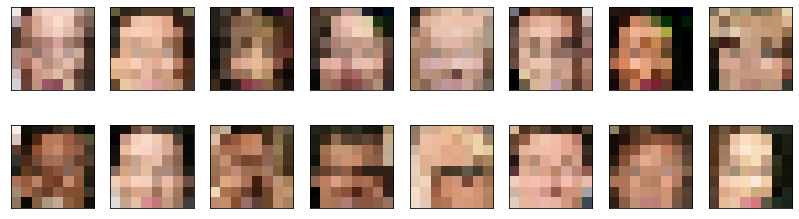

2024-10-31 05:16:25 | Epoch [19/100] | Batch 0/509 | d_loss: -12826.2646 | g_loss: 8300.4141
2024-10-31 05:16:32 | Epoch [19/100] | Batch 50/509 | d_loss: -11396.6250 | g_loss: 7006.3184
2024-10-31 05:16:38 | Epoch [19/100] | Batch 100/509 | d_loss: -6686.9541 | g_loss: -223.8694
2024-10-31 05:16:45 | Epoch [19/100] | Batch 150/509 | d_loss: -6531.4980 | g_loss: 11782.2402
2024-10-31 05:16:52 | Epoch [19/100] | Batch 200/509 | d_loss: -780.3516 | g_loss: -4984.5444
2024-10-31 05:16:59 | Epoch [19/100] | Batch 250/509 | d_loss: -5531.5029 | g_loss: 7073.2393
2024-10-31 05:17:05 | Epoch [19/100] | Batch 300/509 | d_loss: -8491.1016 | g_loss: -10084.8086
2024-10-31 05:17:12 | Epoch [19/100] | Batch 350/509 | d_loss: -8677.3936 | g_loss: 9093.8467
2024-10-31 05:17:19 | Epoch [19/100] | Batch 400/509 | d_loss: -12418.0527 | g_loss: 9966.5996
2024-10-31 05:17:26 | Epoch [19/100] | Batch 450/509 | d_loss: -5264.2163 | g_loss: -4586.7017
2024-10-31 05:17:32 | Epoch [19/100] | Batch 500/509 | d

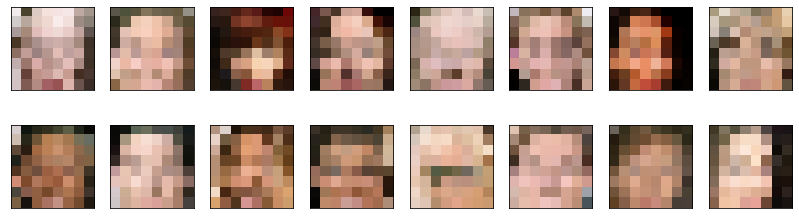

2024-10-31 05:17:37 | Epoch [20/100] | Batch 0/509 | d_loss: -5419.0908 | g_loss: -5191.4775
2024-10-31 05:17:44 | Epoch [20/100] | Batch 50/509 | d_loss: -9361.4004 | g_loss: 22456.2539
2024-10-31 05:17:50 | Epoch [20/100] | Batch 100/509 | d_loss: -7894.3662 | g_loss: 3042.6375
2024-10-31 05:17:57 | Epoch [20/100] | Batch 150/509 | d_loss: -7640.6113 | g_loss: 12668.8311
2024-10-31 05:18:04 | Epoch [20/100] | Batch 200/509 | d_loss: -3858.1211 | g_loss: -22233.0586
2024-10-31 05:18:10 | Epoch [20/100] | Batch 250/509 | d_loss: -7121.8340 | g_loss: -2161.2832
2024-10-31 05:18:17 | Epoch [20/100] | Batch 300/509 | d_loss: -8845.5625 | g_loss: -11137.1221
2024-10-31 05:18:24 | Epoch [20/100] | Batch 350/509 | d_loss: -10359.7676 | g_loss: 3647.6760
2024-10-31 05:18:30 | Epoch [20/100] | Batch 400/509 | d_loss: -18741.8691 | g_loss: 10571.3193
2024-10-31 05:18:37 | Epoch [20/100] | Batch 450/509 | d_loss: -11268.6680 | g_loss: -12485.0684
2024-10-31 05:18:44 | Epoch [20/100] | Batch 500/

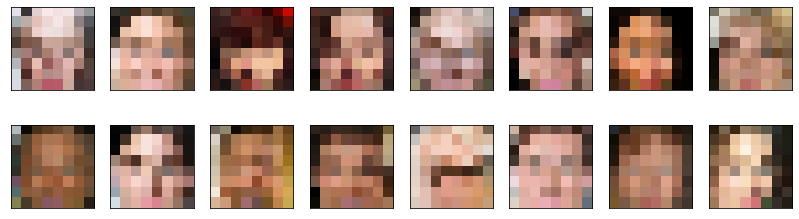

2024-10-31 05:18:50 | Epoch [21/100] | Batch 0/509 | d_loss: -11795.0918 | g_loss: -2162.6057
2024-10-31 05:18:57 | Epoch [21/100] | Batch 50/509 | d_loss: -20081.0645 | g_loss: 6346.0771
2024-10-31 05:19:04 | Epoch [21/100] | Batch 100/509 | d_loss: -814.4160 | g_loss: 25822.4766
2024-10-31 05:19:10 | Epoch [21/100] | Batch 150/509 | d_loss: -14620.3984 | g_loss: -6421.2354
2024-10-31 05:19:17 | Epoch [21/100] | Batch 200/509 | d_loss: -12708.0469 | g_loss: 23334.6875
2024-10-31 05:19:24 | Epoch [21/100] | Batch 250/509 | d_loss: -5533.1250 | g_loss: -11396.2656
2024-10-31 05:19:31 | Epoch [21/100] | Batch 300/509 | d_loss: -13529.1201 | g_loss: 1064.9548
2024-10-31 05:19:37 | Epoch [21/100] | Batch 350/509 | d_loss: -15141.5430 | g_loss: -8015.9834
2024-10-31 05:19:44 | Epoch [21/100] | Batch 400/509 | d_loss: -13849.3730 | g_loss: -13854.4883
2024-10-31 05:19:51 | Epoch [21/100] | Batch 450/509 | d_loss: -15219.2031 | g_loss: 11259.9727
2024-10-31 05:19:58 | Epoch [21/100] | Batch 5

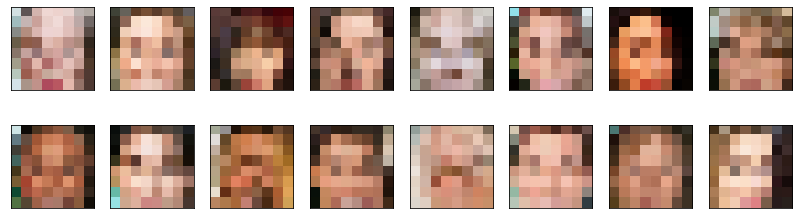

2024-10-31 05:20:03 | Epoch [22/100] | Batch 0/509 | d_loss: -4870.2344 | g_loss: -8504.1875
2024-10-31 05:20:10 | Epoch [22/100] | Batch 50/509 | d_loss: -10477.7646 | g_loss: 21557.7852
2024-10-31 05:20:17 | Epoch [22/100] | Batch 100/509 | d_loss: -15302.0742 | g_loss: 22658.9961
2024-10-31 05:20:23 | Epoch [22/100] | Batch 150/509 | d_loss: -3664.6348 | g_loss: -12817.6328
2024-10-31 05:20:30 | Epoch [22/100] | Batch 200/509 | d_loss: -14805.7266 | g_loss: 9346.0469
2024-10-31 05:20:37 | Epoch [22/100] | Batch 250/509 | d_loss: 3013.9736 | g_loss: -2911.3047
2024-10-31 05:20:43 | Epoch [22/100] | Batch 300/509 | d_loss: -19214.0078 | g_loss: 9754.2988
2024-10-31 05:20:50 | Epoch [22/100] | Batch 350/509 | d_loss: -19880.4473 | g_loss: 13195.2607
2024-10-31 05:20:57 | Epoch [22/100] | Batch 400/509 | d_loss: -37011.2617 | g_loss: 29866.2051
2024-10-31 05:21:03 | Epoch [22/100] | Batch 450/509 | d_loss: -17382.4805 | g_loss: 38167.1641
2024-10-31 05:21:10 | Epoch [22/100] | Batch 500

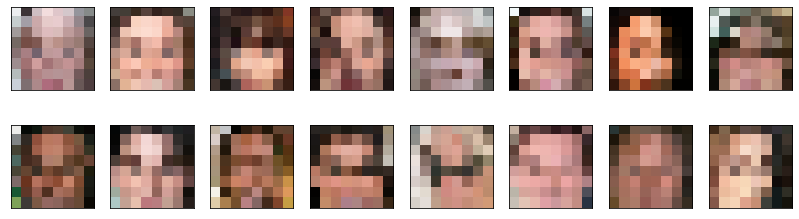

2024-10-31 05:21:16 | Epoch [23/100] | Batch 0/509 | d_loss: -21146.6270 | g_loss: 54940.4180
2024-10-31 05:21:29 | Epoch [23/100] | Batch 50/509 | d_loss: -53769.1094 | g_loss: 64093.4219
2024-10-31 05:21:43 | Epoch [23/100] | Batch 100/509 | d_loss: -60285.6250 | g_loss: 76240.3750
2024-10-31 05:21:56 | Epoch [23/100] | Batch 150/509 | d_loss: -62549.8516 | g_loss: 91360.9844
2024-10-31 05:22:10 | Epoch [23/100] | Batch 200/509 | d_loss: -75828.5000 | g_loss: 104297.5625
2024-10-31 05:22:23 | Epoch [23/100] | Batch 250/509 | d_loss: -12822.5078 | g_loss: 13315.0117
2024-10-31 05:22:36 | Epoch [23/100] | Batch 300/509 | d_loss: -38498.5352 | g_loss: 57477.6953
2024-10-31 05:22:49 | Epoch [23/100] | Batch 350/509 | d_loss: -64564.2578 | g_loss: 67782.2578
2024-10-31 05:23:03 | Epoch [23/100] | Batch 400/509 | d_loss: -76535.9297 | g_loss: -62902.5977
2024-10-31 05:23:16 | Epoch [23/100] | Batch 450/509 | d_loss: -57782.4414 | g_loss: 50194.4844
2024-10-31 05:23:29 | Epoch [23/100] | Ba

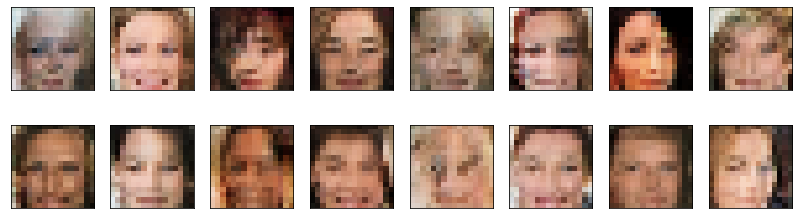

2024-10-31 05:23:35 | Epoch [24/100] | Batch 0/509 | d_loss: -77707.2344 | g_loss: 100575.7422
2024-10-31 05:23:49 | Epoch [24/100] | Batch 50/509 | d_loss: -36320.0039 | g_loss: 103745.0625
2024-10-31 05:24:02 | Epoch [24/100] | Batch 100/509 | d_loss: -48936.5586 | g_loss: 34702.4883
2024-10-31 05:24:15 | Epoch [24/100] | Batch 150/509 | d_loss: -59299.0625 | g_loss: 115653.2812
2024-10-31 05:24:29 | Epoch [24/100] | Batch 200/509 | d_loss: -78334.3594 | g_loss: 107065.9062
2024-10-31 05:24:42 | Epoch [24/100] | Batch 250/509 | d_loss: -13700.1875 | g_loss: -36283.8125
2024-10-31 05:24:55 | Epoch [24/100] | Batch 300/509 | d_loss: -69428.7500 | g_loss: 101320.2188
2024-10-31 05:25:08 | Epoch [24/100] | Batch 350/509 | d_loss: -84246.4141 | g_loss: 28119.9727
2024-10-31 05:25:22 | Epoch [24/100] | Batch 400/509 | d_loss: -82499.6562 | g_loss: 48726.6836
2024-10-31 05:25:35 | Epoch [24/100] | Batch 450/509 | d_loss: -51706.7969 | g_loss: 119729.0859
2024-10-31 05:25:48 | Epoch [24/100]

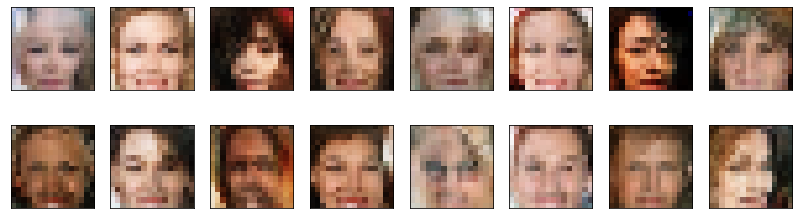

2024-10-31 05:25:55 | Epoch [25/100] | Batch 0/509 | d_loss: -115940.0938 | g_loss: 124335.2344
2024-10-31 05:26:08 | Epoch [25/100] | Batch 50/509 | d_loss: -95771.4922 | g_loss: 108720.3438
2024-10-31 05:26:21 | Epoch [25/100] | Batch 100/509 | d_loss: -153490.4688 | g_loss: 74463.5938
2024-10-31 05:26:35 | Epoch [25/100] | Batch 150/509 | d_loss: -107983.4766 | g_loss: 133111.6094
2024-10-31 05:26:48 | Epoch [25/100] | Batch 200/509 | d_loss: -131699.4375 | g_loss: 144036.3438
2024-10-31 05:27:01 | Epoch [25/100] | Batch 250/509 | d_loss: -141664.1250 | g_loss: 48292.4688
2024-10-31 05:27:15 | Epoch [25/100] | Batch 300/509 | d_loss: -144257.0000 | g_loss: 69882.0938
2024-10-31 05:27:28 | Epoch [25/100] | Batch 350/509 | d_loss: -126567.9844 | g_loss: 120022.2656
2024-10-31 05:27:41 | Epoch [25/100] | Batch 400/509 | d_loss: -145249.9062 | g_loss: 181519.9219
2024-10-31 05:27:55 | Epoch [25/100] | Batch 450/509 | d_loss: -109906.7812 | g_loss: 146974.8281
2024-10-31 05:28:08 | Epoch

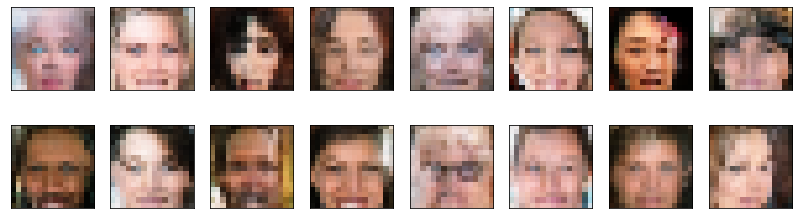

2024-10-31 05:28:15 | Epoch [26/100] | Batch 0/509 | d_loss: -44645.1875 | g_loss: 30278.5410
2024-10-31 05:28:29 | Epoch [26/100] | Batch 50/509 | d_loss: -185195.6250 | g_loss: 123606.6719
2024-10-31 05:28:42 | Epoch [26/100] | Batch 100/509 | d_loss: -156841.8906 | g_loss: 133854.1406
2024-10-31 05:28:55 | Epoch [26/100] | Batch 150/509 | d_loss: -154447.4062 | g_loss: 189160.6250
2024-10-31 05:29:08 | Epoch [26/100] | Batch 200/509 | d_loss: -290273.8125 | g_loss: 207605.9375
2024-10-31 05:29:22 | Epoch [26/100] | Batch 250/509 | d_loss: -246481.2344 | g_loss: 99417.0312
2024-10-31 05:29:35 | Epoch [26/100] | Batch 300/509 | d_loss: -166536.3906 | g_loss: 198087.7812
2024-10-31 05:29:48 | Epoch [26/100] | Batch 350/509 | d_loss: -213828.2656 | g_loss: 119671.0625
2024-10-31 05:30:02 | Epoch [26/100] | Batch 400/509 | d_loss: -273125.1250 | g_loss: 215965.3438
2024-10-31 05:30:15 | Epoch [26/100] | Batch 450/509 | d_loss: -274552.0312 | g_loss: 233582.9062
2024-10-31 05:30:28 | Epoc

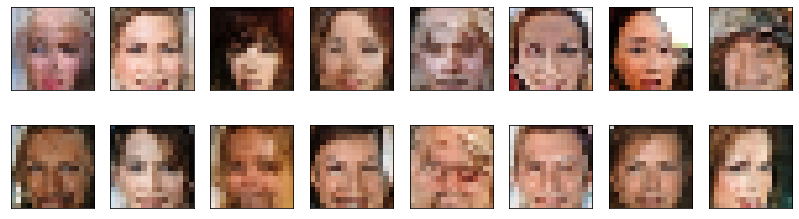

2024-10-31 05:30:35 | Epoch [27/100] | Batch 0/509 | d_loss: -279712.1562 | g_loss: 129369.8906
2024-10-31 05:30:49 | Epoch [27/100] | Batch 50/509 | d_loss: -236558.8438 | g_loss: 9212.7266
2024-10-31 05:31:02 | Epoch [27/100] | Batch 100/509 | d_loss: -309998.3125 | g_loss: 246641.2656
2024-10-31 05:31:15 | Epoch [27/100] | Batch 150/509 | d_loss: -174380.7344 | g_loss: 78260.5000
2024-10-31 05:31:29 | Epoch [27/100] | Batch 200/509 | d_loss: -255832.4531 | g_loss: 272313.7188
2024-10-31 05:31:42 | Epoch [27/100] | Batch 250/509 | d_loss: -326350.6875 | g_loss: 291996.6875
2024-10-31 05:31:56 | Epoch [27/100] | Batch 300/509 | d_loss: -384913.8750 | g_loss: 93291.8750
2024-10-31 05:32:09 | Epoch [27/100] | Batch 350/509 | d_loss: -280796.8125 | g_loss: 215081.7500
2024-10-31 05:32:22 | Epoch [27/100] | Batch 400/509 | d_loss: -308236.6875 | g_loss: 249101.3281
2024-10-31 05:32:36 | Epoch [27/100] | Batch 450/509 | d_loss: -225580.6094 | g_loss: 80472.8594
2024-10-31 05:32:49 | Epoch 

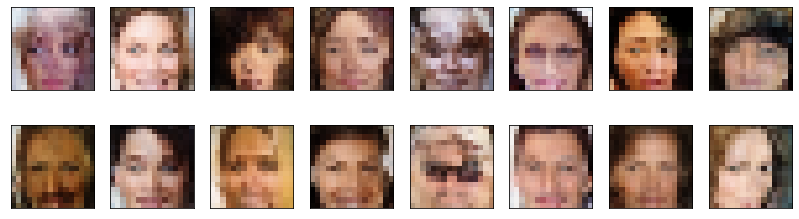

2024-10-31 05:32:56 | Epoch [28/100] | Batch 0/509 | d_loss: -294501.1562 | g_loss: 291615.3750
2024-10-31 05:33:09 | Epoch [28/100] | Batch 50/509 | d_loss: -399976.6562 | g_loss: 306149.1875
2024-10-31 05:33:22 | Epoch [28/100] | Batch 100/509 | d_loss: -441585.5000 | g_loss: 301536.4688
2024-10-31 05:33:36 | Epoch [28/100] | Batch 150/509 | d_loss: -98053.5312 | g_loss: 135411.5781
2024-10-31 05:33:49 | Epoch [28/100] | Batch 200/509 | d_loss: -181893.1250 | g_loss: 313206.8438
2024-10-31 05:34:02 | Epoch [28/100] | Batch 250/509 | d_loss: -273953.2188 | g_loss: 334349.8438
2024-10-31 05:34:16 | Epoch [28/100] | Batch 300/509 | d_loss: -238497.7500 | g_loss: 328312.2188
2024-10-31 05:34:29 | Epoch [28/100] | Batch 350/509 | d_loss: -426897.1562 | g_loss: 103579.2344
2024-10-31 05:34:42 | Epoch [28/100] | Batch 400/509 | d_loss: -404091.0000 | g_loss: 238432.8750
2024-10-31 05:34:55 | Epoch [28/100] | Batch 450/509 | d_loss: -516176.3125 | g_loss: 355249.7500
2024-10-31 05:35:09 | Ep

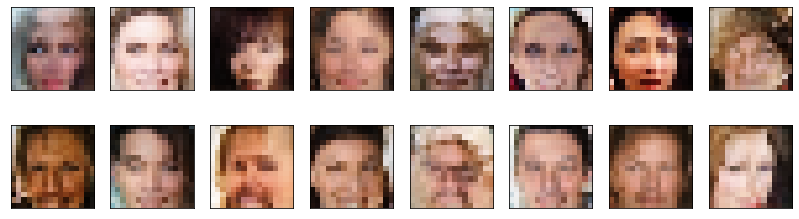

2024-10-31 05:35:16 | Epoch [29/100] | Batch 0/509 | d_loss: -339820.2500 | g_loss: 102969.3203
2024-10-31 05:35:29 | Epoch [29/100] | Batch 50/509 | d_loss: -525668.7500 | g_loss: 333874.4375
2024-10-31 05:35:42 | Epoch [29/100] | Batch 100/509 | d_loss: -385129.3125 | g_loss: 412452.9375
2024-10-31 05:35:56 | Epoch [29/100] | Batch 150/509 | d_loss: -351089.5625 | g_loss: 386987.5000
2024-10-31 05:36:09 | Epoch [29/100] | Batch 200/509 | d_loss: -476072.4688 | g_loss: 396861.2188
2024-10-31 05:36:23 | Epoch [29/100] | Batch 250/509 | d_loss: -540952.0000 | g_loss: 362148.2500
2024-10-31 05:36:36 | Epoch [29/100] | Batch 300/509 | d_loss: -406766.5625 | g_loss: 407983.1875
2024-10-31 05:36:49 | Epoch [29/100] | Batch 350/509 | d_loss: -214711.2031 | g_loss: 397734.6250
2024-10-31 05:37:02 | Epoch [29/100] | Batch 400/509 | d_loss: -335494.2500 | g_loss: 420492.2500
2024-10-31 05:37:16 | Epoch [29/100] | Batch 450/509 | d_loss: -600165.0000 | g_loss: 433182.0312
2024-10-31 05:37:29 | E

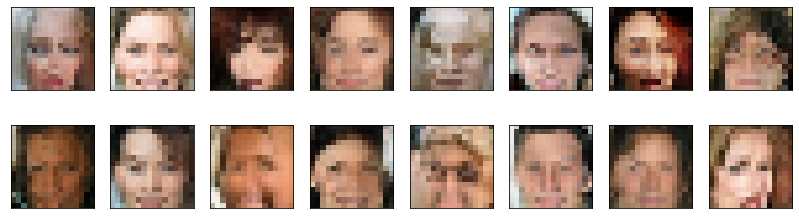

2024-10-31 05:37:36 | Epoch [30/100] | Batch 0/509 | d_loss: -432540.7500 | g_loss: 420821.1562
2024-10-31 05:37:49 | Epoch [30/100] | Batch 50/509 | d_loss: -283645.8750 | g_loss: 416947.5625
2024-10-31 05:38:03 | Epoch [30/100] | Batch 100/509 | d_loss: -321828.0625 | g_loss: 390696.8125
2024-10-31 05:38:16 | Epoch [30/100] | Batch 150/509 | d_loss: -562989.3125 | g_loss: 476979.8125
2024-10-31 05:38:29 | Epoch [30/100] | Batch 200/509 | d_loss: -278294.0625 | g_loss: 490466.7500
2024-10-31 05:38:42 | Epoch [30/100] | Batch 250/509 | d_loss: -648433.0625 | g_loss: 495374.4688
2024-10-31 05:38:56 | Epoch [30/100] | Batch 300/509 | d_loss: -390125.6562 | g_loss: 491370.9062
2024-10-31 05:39:09 | Epoch [30/100] | Batch 350/509 | d_loss: -775669.4375 | g_loss: 460270.9688
2024-10-31 05:39:22 | Epoch [30/100] | Batch 400/509 | d_loss: -569957.6875 | g_loss: 372794.4375
2024-10-31 05:39:36 | Epoch [30/100] | Batch 450/509 | d_loss: -527410.3125 | g_loss: 338856.3750
2024-10-31 05:39:49 | E

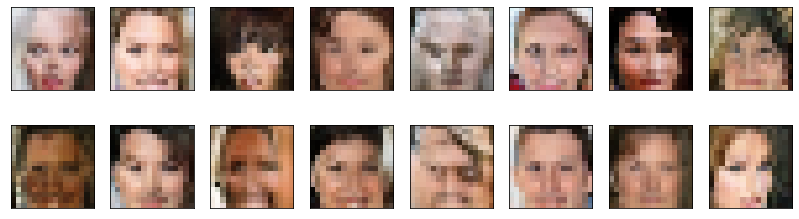

2024-10-31 05:39:56 | Epoch [31/100] | Batch 0/509 | d_loss: -493645.1562 | g_loss: 514087.0938
2024-10-31 05:40:10 | Epoch [31/100] | Batch 50/509 | d_loss: -625891.0000 | g_loss: 571357.8125
2024-10-31 05:40:23 | Epoch [31/100] | Batch 100/509 | d_loss: -857060.8125 | g_loss: 537162.0000
2024-10-31 05:40:37 | Epoch [31/100] | Batch 150/509 | d_loss: -629722.3750 | g_loss: 539998.9375
2024-10-31 05:40:50 | Epoch [31/100] | Batch 200/509 | d_loss: -722652.3750 | g_loss: 547003.6250
2024-10-31 05:41:03 | Epoch [31/100] | Batch 250/509 | d_loss: -651014.1250 | g_loss: 27634.6719
2024-10-31 05:41:16 | Epoch [31/100] | Batch 300/509 | d_loss: -612234.8750 | g_loss: 439329.5938
2024-10-31 05:41:30 | Epoch [31/100] | Batch 350/509 | d_loss: -491329.6562 | g_loss: 445720.8125
2024-10-31 05:41:43 | Epoch [31/100] | Batch 400/509 | d_loss: -487420.6875 | g_loss: 549170.3125
2024-10-31 05:41:56 | Epoch [31/100] | Batch 450/509 | d_loss: -493217.3750 | g_loss: 567079.3125
2024-10-31 05:42:10 | Ep

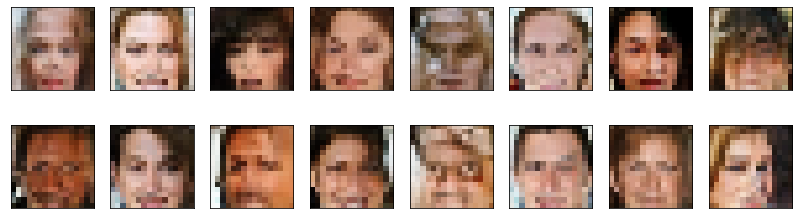

2024-10-31 05:42:17 | Epoch [32/100] | Batch 0/509 | d_loss: -396914.0000 | g_loss: 614075.5000
2024-10-31 05:42:30 | Epoch [32/100] | Batch 50/509 | d_loss: -858558.7500 | g_loss: 314418.5312
2024-10-31 05:42:43 | Epoch [32/100] | Batch 100/509 | d_loss: -1017504.7500 | g_loss: 627003.5000
2024-10-31 05:42:57 | Epoch [32/100] | Batch 150/509 | d_loss: -771828.5000 | g_loss: 584990.7500
2024-10-31 05:43:10 | Epoch [32/100] | Batch 200/509 | d_loss: -998701.3750 | g_loss: 660242.0000
2024-10-31 05:43:23 | Epoch [32/100] | Batch 250/509 | d_loss: -806986.3750 | g_loss: 658096.5000
2024-10-31 05:43:37 | Epoch [32/100] | Batch 300/509 | d_loss: -408510.7500 | g_loss: 689784.7500
2024-10-31 05:43:50 | Epoch [32/100] | Batch 350/509 | d_loss: -488307.5625 | g_loss: 621444.5625
2024-10-31 05:44:03 | Epoch [32/100] | Batch 400/509 | d_loss: -557154.3750 | g_loss: 648476.2500
2024-10-31 05:44:17 | Epoch [32/100] | Batch 450/509 | d_loss: -1038481.5625 | g_loss: 707147.0625
2024-10-31 05:44:30 |

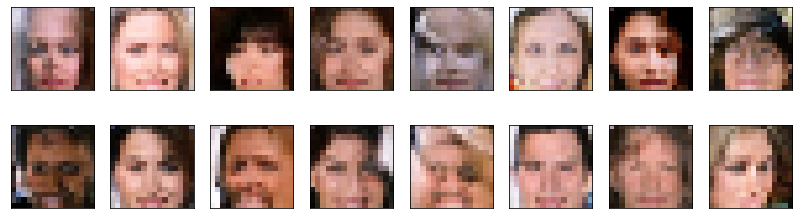

2024-10-31 05:44:35 | Epoch [33/100] | Batch 0/509 | d_loss: -79330.1250 | g_loss: 650504.6875
2024-10-31 05:44:49 | Epoch [33/100] | Batch 50/509 | d_loss: -844442.8750 | g_loss: 776362.7500
2024-10-31 05:45:02 | Epoch [33/100] | Batch 100/509 | d_loss: -1262327.0000 | g_loss: 658917.1250
2024-10-31 05:45:15 | Epoch [33/100] | Batch 150/509 | d_loss: -1166919.6250 | g_loss: 711288.9375
2024-10-31 05:45:29 | Epoch [33/100] | Batch 200/509 | d_loss: -640626.4375 | g_loss: 793674.7500
2024-10-31 05:45:42 | Epoch [33/100] | Batch 250/509 | d_loss: -979636.6250 | g_loss: 750300.1875
2024-10-31 05:45:55 | Epoch [33/100] | Batch 300/509 | d_loss: -919407.3125 | g_loss: 615547.2500
2024-10-31 05:46:09 | Epoch [33/100] | Batch 350/509 | d_loss: -1059794.2500 | g_loss: 755560.1250
2024-10-31 05:46:22 | Epoch [33/100] | Batch 400/509 | d_loss: -720889.7500 | g_loss: 783033.2500
2024-10-31 05:46:35 | Epoch [33/100] | Batch 450/509 | d_loss: -884717.2500 | g_loss: 575316.5000
2024-10-31 05:46:49 |

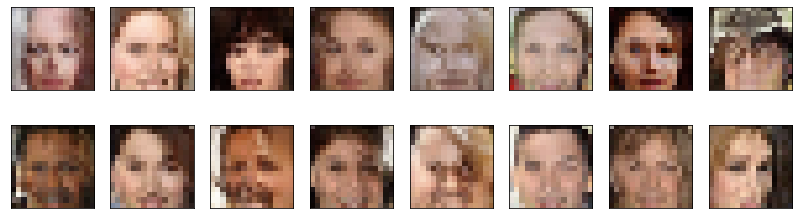

2024-10-31 05:46:56 | Epoch [34/100] | Batch 0/509 | d_loss: -398502.8125 | g_loss: 245722.6094
2024-10-31 05:47:18 | Epoch [34/100] | Batch 50/509 | d_loss: -297458.3125 | g_loss: 154983.7969
2024-10-31 05:47:41 | Epoch [34/100] | Batch 100/509 | d_loss: -1433004.5000 | g_loss: 885786.6250
2024-10-31 05:48:03 | Epoch [34/100] | Batch 150/509 | d_loss: -994986.6250 | g_loss: 820175.5000
2024-10-31 05:48:26 | Epoch [34/100] | Batch 200/509 | d_loss: -886959.7500 | g_loss: 856767.2500
2024-10-31 05:48:48 | Epoch [34/100] | Batch 250/509 | d_loss: -838596.0000 | g_loss: 911645.8750
2024-10-31 05:49:11 | Epoch [34/100] | Batch 300/509 | d_loss: -1289303.7500 | g_loss: 909825.1875
2024-10-31 05:49:33 | Epoch [34/100] | Batch 350/509 | d_loss: -468608.3125 | g_loss: 821142.2500
2024-10-31 05:49:56 | Epoch [34/100] | Batch 400/509 | d_loss: -335808.1250 | g_loss: 765357.1875
2024-10-31 05:50:18 | Epoch [34/100] | Batch 450/509 | d_loss: -703629.6875 | g_loss: 38617.7500
2024-10-31 05:50:41 | 

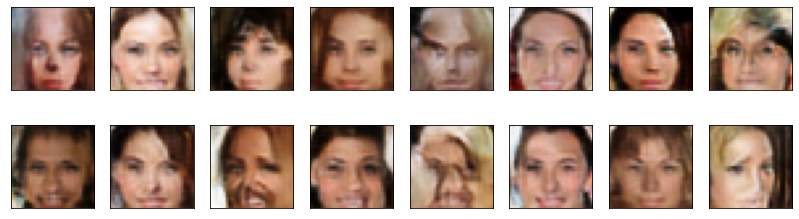

2024-10-31 05:50:50 | Epoch [35/100] | Batch 0/509 | d_loss: -1247557.0000 | g_loss: 841586.1250
2024-10-31 05:51:13 | Epoch [35/100] | Batch 50/509 | d_loss: -1116227.0000 | g_loss: 943915.1250
2024-10-31 05:51:35 | Epoch [35/100] | Batch 100/509 | d_loss: -687106.6250 | g_loss: 958939.7500
2024-10-31 05:51:58 | Epoch [35/100] | Batch 150/509 | d_loss: -837115.8125 | g_loss: 916559.2500
2024-10-31 05:52:20 | Epoch [35/100] | Batch 200/509 | d_loss: -604951.3125 | g_loss: 913015.0625
2024-10-31 05:52:43 | Epoch [35/100] | Batch 250/509 | d_loss: -1164189.2500 | g_loss: 768817.8750
2024-10-31 05:53:05 | Epoch [35/100] | Batch 300/509 | d_loss: -1253233.3750 | g_loss: 1013656.1875
2024-10-31 05:53:28 | Epoch [35/100] | Batch 350/509 | d_loss: -1621608.7500 | g_loss: 916032.3125
2024-10-31 05:53:50 | Epoch [35/100] | Batch 400/509 | d_loss: -1611779.0000 | g_loss: 796116.3750
2024-10-31 05:54:13 | Epoch [35/100] | Batch 450/509 | d_loss: -106542.2500 | g_loss: -142929.2969
2024-10-31 05:5

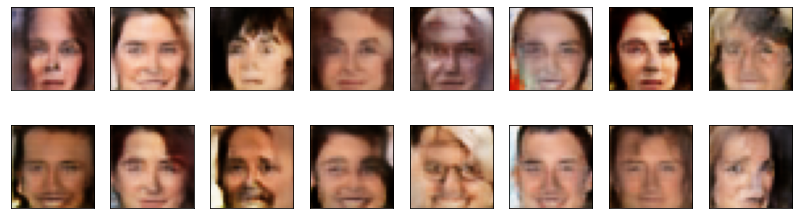

2024-10-31 05:54:42 | Epoch [36/100] | Batch 0/509 | d_loss: -763595.0625 | g_loss: 42074.8516
2024-10-31 05:55:05 | Epoch [36/100] | Batch 50/509 | d_loss: -1653554.6250 | g_loss: 964085.1250
2024-10-31 05:55:27 | Epoch [36/100] | Batch 100/509 | d_loss: -1552710.7500 | g_loss: 1068173.7500
2024-10-31 05:55:50 | Epoch [36/100] | Batch 150/509 | d_loss: -1887838.8750 | g_loss: 992621.8750
2024-10-31 05:56:12 | Epoch [36/100] | Batch 200/509 | d_loss: -1277217.3750 | g_loss: 1091443.5000
2024-10-31 05:56:35 | Epoch [36/100] | Batch 250/509 | d_loss: -1329701.8750 | g_loss: 1116413.1250
2024-10-31 05:56:57 | Epoch [36/100] | Batch 300/509 | d_loss: -1109184.3750 | g_loss: 1133644.7500
2024-10-31 05:57:20 | Epoch [36/100] | Batch 350/509 | d_loss: -980978.6875 | g_loss: 1132165.8750
2024-10-31 05:57:42 | Epoch [36/100] | Batch 400/509 | d_loss: -1554015.3750 | g_loss: 1109620.1250
2024-10-31 05:58:05 | Epoch [36/100] | Batch 450/509 | d_loss: -105086.6875 | g_loss: 1091834.5000
2024-10-31

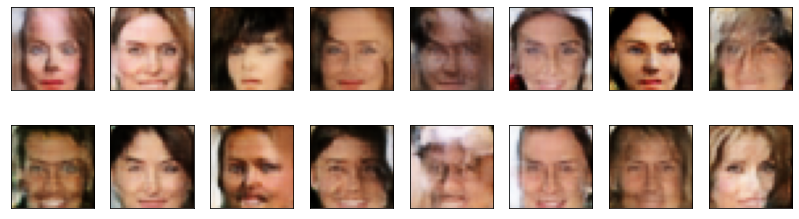

2024-10-31 05:58:36 | Epoch [37/100] | Batch 0/509 | d_loss: -940370.1250 | g_loss: 216643.9375
2024-10-31 05:58:59 | Epoch [37/100] | Batch 50/509 | d_loss: -1671215.5000 | g_loss: 188386.6875
2024-10-31 05:59:21 | Epoch [37/100] | Batch 100/509 | d_loss: -1517705.0000 | g_loss: 1188770.8750
2024-10-31 05:59:44 | Epoch [37/100] | Batch 150/509 | d_loss: -1609804.1250 | g_loss: 1095304.2500
2024-10-31 06:00:06 | Epoch [37/100] | Batch 200/509 | d_loss: -846726.9375 | g_loss: 434670.9375
2024-10-31 06:00:29 | Epoch [37/100] | Batch 250/509 | d_loss: -1353480.7500 | g_loss: 1153606.1250
2024-10-31 06:00:51 | Epoch [37/100] | Batch 300/509 | d_loss: -1733169.5000 | g_loss: 1158971.7500
2024-10-31 06:01:14 | Epoch [37/100] | Batch 350/509 | d_loss: -1829102.8750 | g_loss: 990424.8750
2024-10-31 06:01:36 | Epoch [37/100] | Batch 400/509 | d_loss: -1619611.0000 | g_loss: 677270.5000
2024-10-31 06:01:59 | Epoch [37/100] | Batch 450/509 | d_loss: -1911395.7500 | g_loss: 648061.7500
2024-10-31 

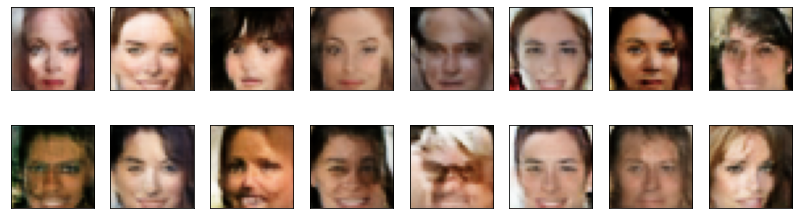

2024-10-31 06:02:29 | Epoch [38/100] | Batch 0/509 | d_loss: -1936195.3750 | g_loss: 987003.6250
2024-10-31 06:02:52 | Epoch [38/100] | Batch 50/509 | d_loss: -1947638.1250 | g_loss: 1181561.0000
2024-10-31 06:03:14 | Epoch [38/100] | Batch 100/509 | d_loss: -417688.6875 | g_loss: 330618.2500
2024-10-31 06:03:37 | Epoch [38/100] | Batch 150/509 | d_loss: -2204870.2500 | g_loss: 1274707.5000
2024-10-31 06:03:59 | Epoch [38/100] | Batch 200/509 | d_loss: -1272691.3750 | g_loss: 1276821.0000
2024-10-31 06:04:22 | Epoch [38/100] | Batch 250/509 | d_loss: -1255555.3750 | g_loss: 1270623.2500
2024-10-31 06:04:44 | Epoch [38/100] | Batch 300/509 | d_loss: -2278585.2500 | g_loss: 1253889.7500
2024-10-31 06:05:07 | Epoch [38/100] | Batch 350/509 | d_loss: -2112523.0000 | g_loss: 986647.1250
2024-10-31 06:05:29 | Epoch [38/100] | Batch 400/509 | d_loss: -1679854.3750 | g_loss: 1323808.5000
2024-10-31 06:05:52 | Epoch [38/100] | Batch 450/509 | d_loss: -2382722.5000 | g_loss: 1126741.7500
2024-10

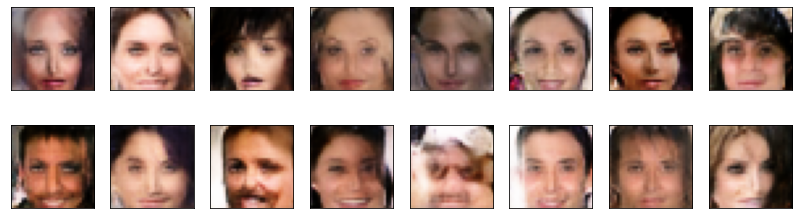

2024-10-31 06:06:22 | Epoch [39/100] | Batch 0/509 | d_loss: -2065905.2500 | g_loss: 1239629.5000
2024-10-31 06:06:44 | Epoch [39/100] | Batch 50/509 | d_loss: -2222488.0000 | g_loss: 1132422.7500
2024-10-31 06:07:07 | Epoch [39/100] | Batch 100/509 | d_loss: -2591996.0000 | g_loss: 1421972.5000
2024-10-31 06:07:29 | Epoch [39/100] | Batch 150/509 | d_loss: -1389308.2500 | g_loss: 350274.7812
2024-10-31 06:07:52 | Epoch [39/100] | Batch 200/509 | d_loss: -1929673.1250 | g_loss: 1471515.5000
2024-10-31 06:08:14 | Epoch [39/100] | Batch 250/509 | d_loss: -2248123.2500 | g_loss: 1374392.5000
2024-10-31 06:08:37 | Epoch [39/100] | Batch 300/509 | d_loss: -1874422.7500 | g_loss: 1374736.2500
2024-10-31 06:08:59 | Epoch [39/100] | Batch 350/509 | d_loss: -1949615.8750 | g_loss: 1497235.2500
2024-10-31 06:09:22 | Epoch [39/100] | Batch 400/509 | d_loss: -1819718.2500 | g_loss: 1461745.2500
2024-10-31 06:09:44 | Epoch [39/100] | Batch 450/509 | d_loss: -2156950.2500 | g_loss: 1023246.3750
2024

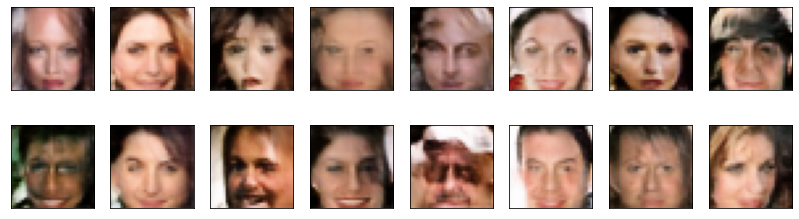

2024-10-31 06:10:14 | Epoch [40/100] | Batch 0/509 | d_loss: -1780666.7500 | g_loss: 1498943.1250
2024-10-31 06:10:37 | Epoch [40/100] | Batch 50/509 | d_loss: -1988485.2500 | g_loss: 943419.6250
2024-10-31 06:10:59 | Epoch [40/100] | Batch 100/509 | d_loss: -2056812.0000 | g_loss: 1499062.0000
2024-10-31 06:11:22 | Epoch [40/100] | Batch 150/509 | d_loss: -2380110.5000 | g_loss: 1105326.5000
2024-10-31 06:11:44 | Epoch [40/100] | Batch 200/509 | d_loss: -1602286.7500 | g_loss: 1508362.7500
2024-10-31 06:12:07 | Epoch [40/100] | Batch 250/509 | d_loss: -2625503.5000 | g_loss: 1413111.7500
2024-10-31 06:12:29 | Epoch [40/100] | Batch 300/509 | d_loss: -2279407.2500 | g_loss: 1562422.3750
2024-10-31 06:12:52 | Epoch [40/100] | Batch 350/509 | d_loss: -2851288.0000 | g_loss: 1351199.0000
2024-10-31 06:13:14 | Epoch [40/100] | Batch 400/509 | d_loss: -1386843.0000 | g_loss: 1677103.0000
2024-10-31 06:13:37 | Epoch [40/100] | Batch 450/509 | d_loss: -2396211.7500 | g_loss: 1644505.2500
2024

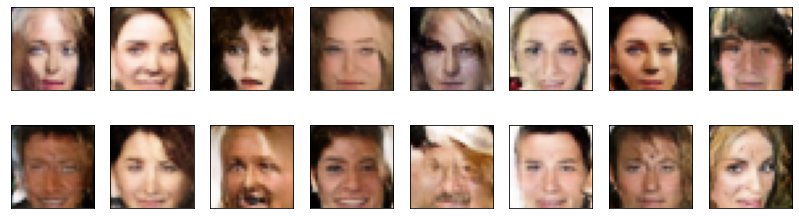

2024-10-31 06:14:07 | Epoch [41/100] | Batch 0/509 | d_loss: -2007101.3750 | g_loss: 1566986.2500
2024-10-31 06:14:29 | Epoch [41/100] | Batch 50/509 | d_loss: -2809476.7500 | g_loss: 1380039.6250
2024-10-31 06:14:52 | Epoch [41/100] | Batch 100/509 | d_loss: -1487601.0000 | g_loss: 1605559.3750
2024-10-31 06:15:14 | Epoch [41/100] | Batch 150/509 | d_loss: -2731543.5000 | g_loss: 1656636.2500
2024-10-31 06:15:37 | Epoch [41/100] | Batch 200/509 | d_loss: -2853107.5000 | g_loss: 1416737.7500
2024-10-31 06:15:59 | Epoch [41/100] | Batch 250/509 | d_loss: -2182654.5000 | g_loss: 1724231.2500
2024-10-31 06:16:22 | Epoch [41/100] | Batch 300/509 | d_loss: -1891546.6250 | g_loss: 1775915.2500
2024-10-31 06:16:44 | Epoch [41/100] | Batch 350/509 | d_loss: -2798198.5000 | g_loss: 1714650.5000
2024-10-31 06:17:07 | Epoch [41/100] | Batch 400/509 | d_loss: -2981322.2500 | g_loss: 1763748.0000
2024-10-31 06:17:29 | Epoch [41/100] | Batch 450/509 | d_loss: -2389081.2500 | g_loss: 1075785.2500
202

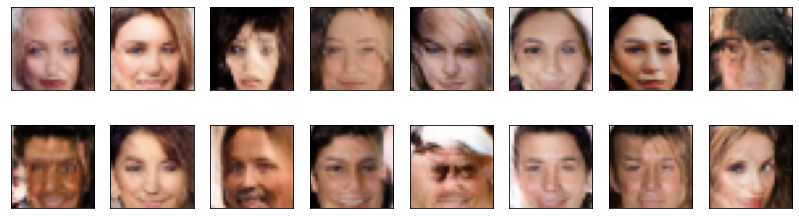

2024-10-31 06:18:00 | Epoch [42/100] | Batch 0/509 | d_loss: -2834717.0000 | g_loss: 1778993.7500
2024-10-31 06:18:23 | Epoch [42/100] | Batch 50/509 | d_loss: -3286653.0000 | g_loss: -13883.6514
2024-10-31 06:18:45 | Epoch [42/100] | Batch 100/509 | d_loss: -3333792.0000 | g_loss: 1299367.6250
2024-10-31 06:19:08 | Epoch [42/100] | Batch 150/509 | d_loss: -2529904.5000 | g_loss: 1489330.2500
2024-10-31 06:19:30 | Epoch [42/100] | Batch 200/509 | d_loss: -1965332.7500 | g_loss: 1895814.8750
2024-10-31 06:19:53 | Epoch [42/100] | Batch 250/509 | d_loss: -2986123.0000 | g_loss: 1739455.5000
2024-10-31 06:20:15 | Epoch [42/100] | Batch 300/509 | d_loss: -3317933.0000 | g_loss: 1830144.0000
2024-10-31 06:20:38 | Epoch [42/100] | Batch 350/509 | d_loss: -1875672.7500 | g_loss: 1782903.5000
2024-10-31 06:21:00 | Epoch [42/100] | Batch 400/509 | d_loss: -3308672.0000 | g_loss: 1740982.5000
2024-10-31 06:21:23 | Epoch [42/100] | Batch 450/509 | d_loss: -3528335.7500 | g_loss: 1899746.5000
2024

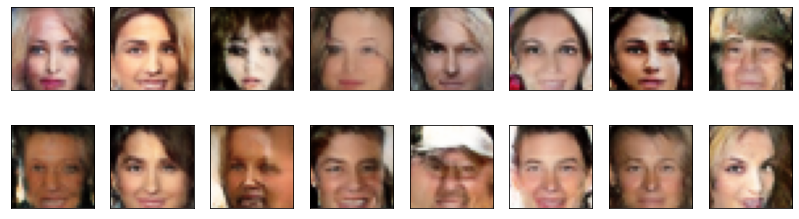

2024-10-31 06:21:53 | Epoch [43/100] | Batch 0/509 | d_loss: -2098455.7500 | g_loss: 1844028.7500
2024-10-31 06:22:16 | Epoch [43/100] | Batch 50/509 | d_loss: -3211170.0000 | g_loss: 198093.0938
2024-10-31 06:22:38 | Epoch [43/100] | Batch 100/509 | d_loss: -3058462.0000 | g_loss: 1999460.7500
2024-10-31 06:23:01 | Epoch [43/100] | Batch 150/509 | d_loss: -3501465.2500 | g_loss: 1606911.5000
2024-10-31 06:23:23 | Epoch [43/100] | Batch 200/509 | d_loss: -2956473.7500 | g_loss: 2028104.3750
2024-10-31 06:23:46 | Epoch [43/100] | Batch 250/509 | d_loss: -2891214.5000 | g_loss: 1912665.1250
2024-10-31 06:24:08 | Epoch [43/100] | Batch 300/509 | d_loss: -3497324.7500 | g_loss: 1941614.5000
2024-10-31 06:24:31 | Epoch [43/100] | Batch 350/509 | d_loss: -3750635.5000 | g_loss: 2000620.0000
2024-10-31 06:24:53 | Epoch [43/100] | Batch 400/509 | d_loss: -3033281.5000 | g_loss: 1908907.7500
2024-10-31 06:25:16 | Epoch [43/100] | Batch 450/509 | d_loss: -2556299.0000 | g_loss: 1858157.1250
2024

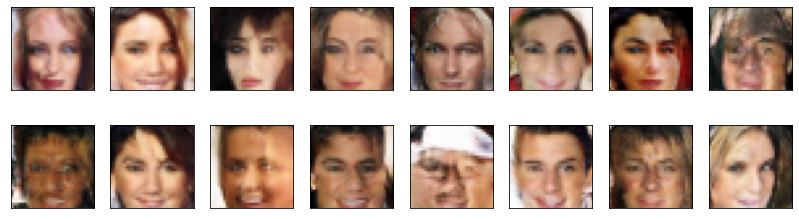

2024-10-31 06:25:47 | Epoch [44/100] | Batch 0/509 | d_loss: -3467211.2500 | g_loss: 2027018.2500
2024-10-31 06:26:09 | Epoch [44/100] | Batch 50/509 | d_loss: -3632181.5000 | g_loss: 1721911.0000
2024-10-31 06:26:32 | Epoch [44/100] | Batch 100/509 | d_loss: -3351653.2500 | g_loss: 2071782.8750
2024-10-31 06:26:54 | Epoch [44/100] | Batch 150/509 | d_loss: -3809479.5000 | g_loss: 2119453.7500
2024-10-31 06:27:17 | Epoch [44/100] | Batch 200/509 | d_loss: -3813177.2500 | g_loss: 2197429.0000
2024-10-31 06:27:39 | Epoch [44/100] | Batch 250/509 | d_loss: -2649619.5000 | g_loss: 1078073.2500
2024-10-31 06:28:02 | Epoch [44/100] | Batch 300/509 | d_loss: -2783692.2500 | g_loss: 2281597.0000
2024-10-31 06:28:24 | Epoch [44/100] | Batch 350/509 | d_loss: -3697349.2500 | g_loss: 2146001.7500
2024-10-31 06:28:47 | Epoch [44/100] | Batch 400/509 | d_loss: -1816336.8750 | g_loss: 2240732.0000
2024-10-31 06:29:09 | Epoch [44/100] | Batch 450/509 | d_loss: -3996465.2500 | g_loss: 2096235.6250
202

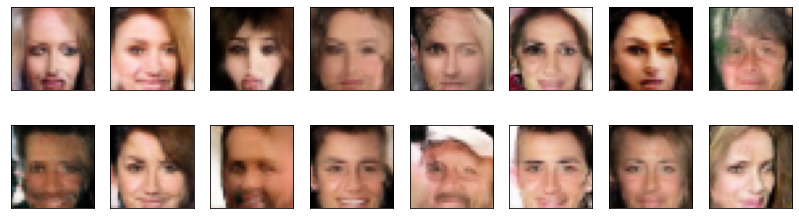

2024-10-31 06:29:40 | Epoch [45/100] | Batch 0/509 | d_loss: -2980725.5000 | g_loss: 2204601.5000
2024-10-31 06:30:23 | Epoch [45/100] | Batch 50/509 | d_loss: -1166478.5000 | g_loss: 2272148.2500
2024-10-31 06:31:07 | Epoch [45/100] | Batch 100/509 | d_loss: -4371473.5000 | g_loss: 2340808.0000
2024-10-31 06:31:51 | Epoch [45/100] | Batch 150/509 | d_loss: -107212.7500 | g_loss: -1929062.7500
2024-10-31 06:32:35 | Epoch [45/100] | Batch 200/509 | d_loss: -2472252.0000 | g_loss: 2134282.0000
2024-10-31 06:33:19 | Epoch [45/100] | Batch 250/509 | d_loss: -3797527.7500 | g_loss: 2411847.0000
2024-10-31 06:34:03 | Epoch [45/100] | Batch 300/509 | d_loss: -4281338.5000 | g_loss: 2342162.5000
2024-10-31 06:34:47 | Epoch [45/100] | Batch 350/509 | d_loss: -4496066.0000 | g_loss: 2425381.0000
2024-10-31 06:35:30 | Epoch [45/100] | Batch 400/509 | d_loss: -4284470.5000 | g_loss: 2349382.0000
2024-10-31 06:36:14 | Epoch [45/100] | Batch 450/509 | d_loss: -4425487.0000 | g_loss: 2441372.2500
202

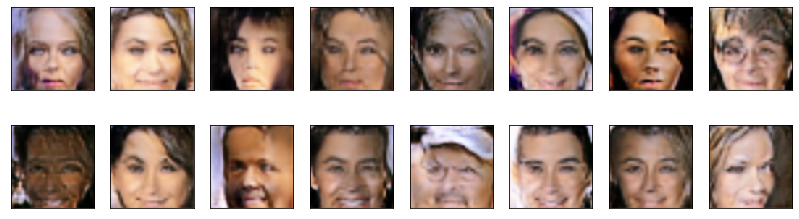

2024-10-31 06:37:10 | Epoch [46/100] | Batch 0/509 | d_loss: -4420334.0000 | g_loss: 2442602.7500
2024-10-31 06:37:54 | Epoch [46/100] | Batch 50/509 | d_loss: -2270710.0000 | g_loss: 2021766.7500
2024-10-31 06:38:38 | Epoch [46/100] | Batch 100/509 | d_loss: -4160036.7500 | g_loss: 2485079.5000
2024-10-31 06:39:21 | Epoch [46/100] | Batch 150/509 | d_loss: -4354460.0000 | g_loss: 2382267.5000
2024-10-31 06:40:05 | Epoch [46/100] | Batch 200/509 | d_loss: -4441022.5000 | g_loss: 2415113.5000
2024-10-31 06:40:49 | Epoch [46/100] | Batch 250/509 | d_loss: -4315986.0000 | g_loss: 2534071.0000
2024-10-31 06:41:33 | Epoch [46/100] | Batch 300/509 | d_loss: -486033.0000 | g_loss: 1883749.3750
2024-10-31 06:42:17 | Epoch [46/100] | Batch 350/509 | d_loss: -4482786.0000 | g_loss: 2519940.0000
2024-10-31 06:43:01 | Epoch [46/100] | Batch 400/509 | d_loss: -3532431.5000 | g_loss: 2256972.0000
2024-10-31 06:43:45 | Epoch [46/100] | Batch 450/509 | d_loss: -4874436.0000 | g_loss: 2616915.5000
2024

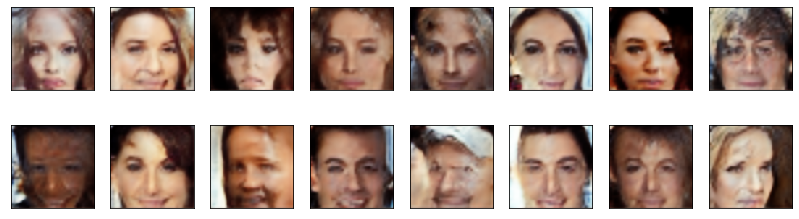

2024-10-31 06:44:41 | Epoch [47/100] | Batch 0/509 | d_loss: -4620466.0000 | g_loss: 2493521.5000
2024-10-31 06:45:25 | Epoch [47/100] | Batch 50/509 | d_loss: -79912.5000 | g_loss: 2583653.5000
2024-10-31 06:46:09 | Epoch [47/100] | Batch 100/509 | d_loss: -4196301.0000 | g_loss: 1936069.0000
2024-10-31 06:46:52 | Epoch [47/100] | Batch 150/509 | d_loss: 8962.5000 | g_loss: -2245062.7500
2024-10-31 06:47:36 | Epoch [47/100] | Batch 200/509 | d_loss: -4552860.0000 | g_loss: 2472878.0000
2024-10-31 06:48:20 | Epoch [47/100] | Batch 250/509 | d_loss: -4849863.0000 | g_loss: 2618596.7500
2024-10-31 06:49:04 | Epoch [47/100] | Batch 300/509 | d_loss: -4636842.0000 | g_loss: 2724742.5000
2024-10-31 06:49:48 | Epoch [47/100] | Batch 350/509 | d_loss: -3478032.0000 | g_loss: 524697.1250
2024-10-31 06:50:32 | Epoch [47/100] | Batch 400/509 | d_loss: -4089046.5000 | g_loss: 2706559.5000
2024-10-31 06:51:16 | Epoch [47/100] | Batch 450/509 | d_loss: -4253289.0000 | g_loss: 2706950.5000
2024-10-3

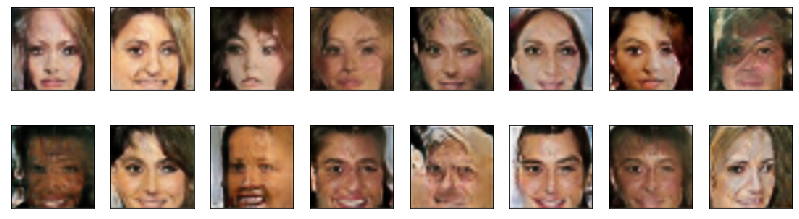

2024-10-31 06:52:11 | Epoch [48/100] | Batch 0/509 | d_loss: -4314616.0000 | g_loss: 2473731.0000
2024-10-31 06:52:55 | Epoch [48/100] | Batch 50/509 | d_loss: -4799099.5000 | g_loss: 2619715.0000
2024-10-31 06:53:39 | Epoch [48/100] | Batch 100/509 | d_loss: -3278772.0000 | g_loss: 2549779.7500
2024-10-31 06:54:23 | Epoch [48/100] | Batch 150/509 | d_loss: -4703782.5000 | g_loss: 2708266.0000
2024-10-31 06:55:07 | Epoch [48/100] | Batch 200/509 | d_loss: -4722108.0000 | g_loss: 2749477.0000
2024-10-31 06:55:51 | Epoch [48/100] | Batch 250/509 | d_loss: -4109569.5000 | g_loss: 2526128.0000
2024-10-31 06:56:35 | Epoch [48/100] | Batch 300/509 | d_loss: -5126433.5000 | g_loss: 2812263.0000
2024-10-31 06:57:18 | Epoch [48/100] | Batch 350/509 | d_loss: -4769254.0000 | g_loss: 2825680.5000
2024-10-31 06:58:02 | Epoch [48/100] | Batch 400/509 | d_loss: -5112646.5000 | g_loss: 2230619.0000
2024-10-31 06:58:46 | Epoch [48/100] | Batch 450/509 | d_loss: -4941946.0000 | g_loss: 2307283.0000
202

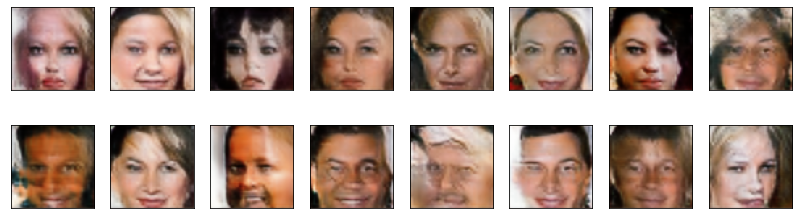

2024-10-31 06:59:43 | Epoch [49/100] | Batch 0/509 | d_loss: -4976503.0000 | g_loss: 2731206.0000
2024-10-31 07:00:27 | Epoch [49/100] | Batch 50/509 | d_loss: -5110734.0000 | g_loss: 2783431.5000
2024-10-31 07:01:11 | Epoch [49/100] | Batch 100/509 | d_loss: -4895762.0000 | g_loss: 2848501.7500
2024-10-31 07:01:55 | Epoch [49/100] | Batch 150/509 | d_loss: -5414143.0000 | g_loss: 2946592.0000
2024-10-31 07:02:39 | Epoch [49/100] | Batch 200/509 | d_loss: -893448.0000 | g_loss: 2718822.5000
2024-10-31 07:03:23 | Epoch [49/100] | Batch 250/509 | d_loss: -4905346.0000 | g_loss: 3002385.5000
2024-10-31 07:04:07 | Epoch [49/100] | Batch 300/509 | d_loss: -5201593.5000 | g_loss: 2348237.2500
2024-10-31 07:04:51 | Epoch [49/100] | Batch 350/509 | d_loss: -5562315.0000 | g_loss: 3041511.2500
2024-10-31 07:05:35 | Epoch [49/100] | Batch 400/509 | d_loss: -5369553.5000 | g_loss: 2993213.0000
2024-10-31 07:06:18 | Epoch [49/100] | Batch 450/509 | d_loss: -5654984.0000 | g_loss: 2965190.2500
2024

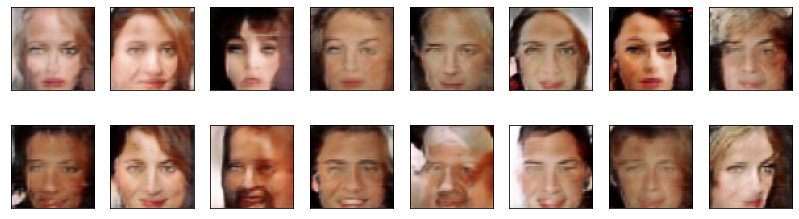

2024-10-31 07:07:14 | Epoch [50/100] | Batch 0/509 | d_loss: -72735.5000 | g_loss: -2620945.7500
2024-10-31 07:07:58 | Epoch [50/100] | Batch 50/509 | d_loss: -889843.2500 | g_loss: 2739603.2500
2024-10-31 07:08:42 | Epoch [50/100] | Batch 100/509 | d_loss: -340646.0000 | g_loss: -2084171.6250
2024-10-31 07:09:26 | Epoch [50/100] | Batch 150/509 | d_loss: -5627769.0000 | g_loss: 3132536.2500
2024-10-31 07:10:10 | Epoch [50/100] | Batch 200/509 | d_loss: -5524519.0000 | g_loss: 3112456.5000
2024-10-31 07:10:54 | Epoch [50/100] | Batch 250/509 | d_loss: -5946315.0000 | g_loss: 3194033.0000
2024-10-31 07:11:38 | Epoch [50/100] | Batch 300/509 | d_loss: -5863630.5000 | g_loss: 2783243.7500
2024-10-31 07:12:22 | Epoch [50/100] | Batch 350/509 | d_loss: -5905155.0000 | g_loss: 3177387.0000
2024-10-31 07:13:06 | Epoch [50/100] | Batch 400/509 | d_loss: -5786642.0000 | g_loss: 3219750.5000
2024-10-31 07:13:50 | Epoch [50/100] | Batch 450/509 | d_loss: -384055.7500 | g_loss: -1274329.8750
2024-

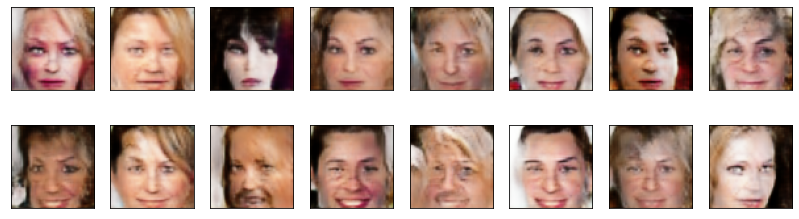

2024-10-31 07:14:45 | Epoch [51/100] | Batch 0/509 | d_loss: -5897074.0000 | g_loss: 3261037.0000
2024-10-31 07:15:29 | Epoch [51/100] | Batch 50/509 | d_loss: -6077819.5000 | g_loss: 3323101.7500
2024-10-31 07:16:13 | Epoch [51/100] | Batch 100/509 | d_loss: -278234.2500 | g_loss: -2135265.7500
2024-10-31 07:16:56 | Epoch [51/100] | Batch 150/509 | d_loss: -5816359.5000 | g_loss: 3221369.2500
2024-10-31 07:17:40 | Epoch [51/100] | Batch 200/509 | d_loss: -633644.5000 | g_loss: 3311141.2500
2024-10-31 07:18:24 | Epoch [51/100] | Batch 250/509 | d_loss: -6117248.0000 | g_loss: 3338459.0000
2024-10-31 07:19:08 | Epoch [51/100] | Batch 300/509 | d_loss: -5941435.0000 | g_loss: 3315743.2500
2024-10-31 07:19:52 | Epoch [51/100] | Batch 350/509 | d_loss: -640996.2500 | g_loss: 3406114.0000
2024-10-31 07:20:35 | Epoch [51/100] | Batch 400/509 | d_loss: 26178.5000 | g_loss: -2889223.7500
2024-10-31 07:21:19 | Epoch [51/100] | Batch 450/509 | d_loss: -6155728.0000 | g_loss: 3316601.5000
2024-10

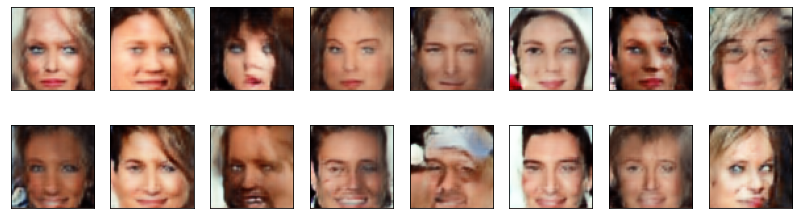

2024-10-31 07:22:15 | Epoch [52/100] | Batch 0/509 | d_loss: -6180505.5000 | g_loss: 3426055.5000
2024-10-31 07:22:59 | Epoch [52/100] | Batch 50/509 | d_loss: -5731098.0000 | g_loss: 3369121.5000
2024-10-31 07:23:43 | Epoch [52/100] | Batch 100/509 | d_loss: -6198257.0000 | g_loss: 3451990.2500
2024-10-31 07:24:27 | Epoch [52/100] | Batch 150/509 | d_loss: -6293529.0000 | g_loss: 3423441.0000
2024-10-31 07:25:11 | Epoch [52/100] | Batch 200/509 | d_loss: -6111818.0000 | g_loss: 3400587.0000
2024-10-31 07:25:55 | Epoch [52/100] | Batch 250/509 | d_loss: -6293079.0000 | g_loss: 3484687.7500
2024-10-31 07:26:39 | Epoch [52/100] | Batch 300/509 | d_loss: -6227982.5000 | g_loss: 3322881.5000
2024-10-31 07:27:23 | Epoch [52/100] | Batch 350/509 | d_loss: -6014717.0000 | g_loss: 3556571.5000
2024-10-31 07:28:07 | Epoch [52/100] | Batch 400/509 | d_loss: -6527010.0000 | g_loss: 3425219.0000
2024-10-31 07:28:50 | Epoch [52/100] | Batch 450/509 | d_loss: -6574623.0000 | g_loss: 3562554.2500
202

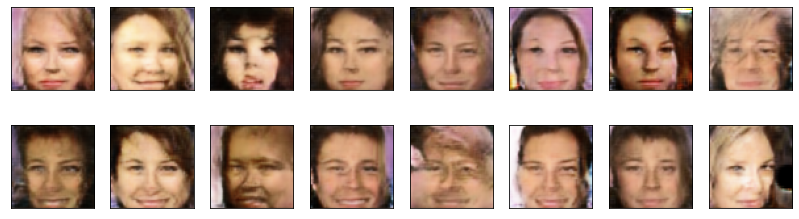

2024-10-31 07:29:46 | Epoch [53/100] | Batch 0/509 | d_loss: -366038.2500 | g_loss: -1818935.5000
2024-10-31 07:30:30 | Epoch [53/100] | Batch 50/509 | d_loss: -6043255.0000 | g_loss: 3682228.2500
2024-10-31 07:31:13 | Epoch [53/100] | Batch 100/509 | d_loss: -6225892.0000 | g_loss: 3562853.2500
2024-10-31 07:31:57 | Epoch [53/100] | Batch 150/509 | d_loss: -606159.2500 | g_loss: 1191347.2500
2024-10-31 07:32:41 | Epoch [53/100] | Batch 200/509 | d_loss: -6870184.5000 | g_loss: 3683971.5000
2024-10-31 07:33:25 | Epoch [53/100] | Batch 250/509 | d_loss: -6237987.0000 | g_loss: 3672000.5000
2024-10-31 07:34:09 | Epoch [53/100] | Batch 300/509 | d_loss: -6297562.5000 | g_loss: 3701661.5000
2024-10-31 07:34:52 | Epoch [53/100] | Batch 350/509 | d_loss: -6645022.5000 | g_loss: 3521662.5000
2024-10-31 07:35:36 | Epoch [53/100] | Batch 400/509 | d_loss: -6495720.5000 | g_loss: 3718621.5000
2024-10-31 07:36:20 | Epoch [53/100] | Batch 450/509 | d_loss: -58122.0000 | g_loss: -3111887.7500
2024-

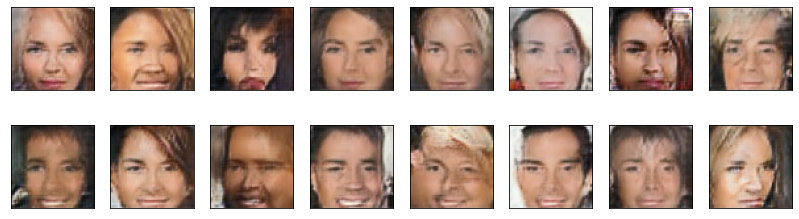

2024-10-31 07:37:16 | Epoch [54/100] | Batch 0/509 | d_loss: -6714112.0000 | g_loss: 3730947.0000
2024-10-31 07:38:00 | Epoch [54/100] | Batch 50/509 | d_loss: -6859244.0000 | g_loss: 3798055.5000
2024-10-31 07:38:44 | Epoch [54/100] | Batch 100/509 | d_loss: -832348.5000 | g_loss: -1346128.5000
2024-10-31 07:39:28 | Epoch [54/100] | Batch 150/509 | d_loss: -1372107.1250 | g_loss: 3891703.7500
2024-10-31 07:40:12 | Epoch [54/100] | Batch 200/509 | d_loss: -1864500.0000 | g_loss: 3860888.5000
2024-10-31 07:40:56 | Epoch [54/100] | Batch 250/509 | d_loss: -6829948.0000 | g_loss: 3826653.0000
2024-10-31 07:41:40 | Epoch [54/100] | Batch 300/509 | d_loss: -7083691.0000 | g_loss: 3929566.2500
2024-10-31 07:42:24 | Epoch [54/100] | Batch 350/509 | d_loss: -7012526.0000 | g_loss: 3903061.5000
2024-10-31 07:43:07 | Epoch [54/100] | Batch 400/509 | d_loss: -7068567.0000 | g_loss: 3552430.0000
2024-10-31 07:43:51 | Epoch [54/100] | Batch 450/509 | d_loss: -7099724.0000 | g_loss: 3822806.2500
202

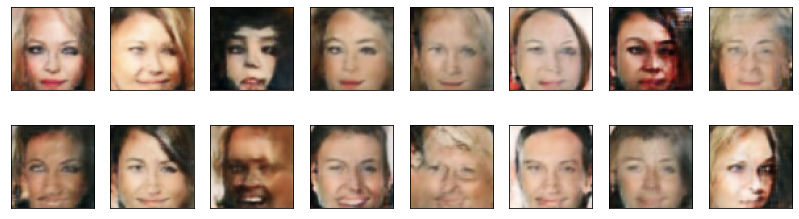

2024-10-31 07:44:47 | Epoch [55/100] | Batch 0/509 | d_loss: -7090138.0000 | g_loss: 3793125.0000
2024-10-31 07:45:31 | Epoch [55/100] | Batch 50/509 | d_loss: -6902503.5000 | g_loss: 3843703.2500
2024-10-31 07:46:15 | Epoch [55/100] | Batch 100/509 | d_loss: -7325380.0000 | g_loss: 3813055.2500
2024-10-31 07:46:59 | Epoch [55/100] | Batch 150/509 | d_loss: -150929.5000 | g_loss: -3054453.2500
2024-10-31 07:47:43 | Epoch [55/100] | Batch 200/509 | d_loss: -7350438.5000 | g_loss: 3884785.5000
2024-10-31 07:48:27 | Epoch [55/100] | Batch 250/509 | d_loss: -7470927.0000 | g_loss: 4034594.0000
2024-10-31 07:49:10 | Epoch [55/100] | Batch 300/509 | d_loss: -7407552.0000 | g_loss: 4076390.2500
2024-10-31 07:49:54 | Epoch [55/100] | Batch 350/509 | d_loss: -7242547.5000 | g_loss: 4052809.0000
2024-10-31 07:50:38 | Epoch [55/100] | Batch 400/509 | d_loss: -6175079.0000 | g_loss: -1955128.2500
2024-10-31 07:51:22 | Epoch [55/100] | Batch 450/509 | d_loss: -7495280.0000 | g_loss: 4141400.0000
20

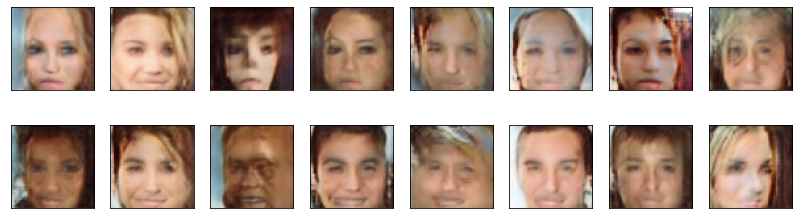

2024-10-31 07:52:18 | Epoch [56/100] | Batch 0/509 | d_loss: -7718271.5000 | g_loss: 4186436.5000
2024-10-31 07:53:02 | Epoch [56/100] | Batch 50/509 | d_loss: -7746559.5000 | g_loss: 4070153.5000
2024-10-31 07:53:46 | Epoch [56/100] | Batch 100/509 | d_loss: -7388716.5000 | g_loss: 4201731.5000
2024-10-31 07:54:30 | Epoch [56/100] | Batch 150/509 | d_loss: -7482277.5000 | g_loss: 3779887.5000
2024-10-31 07:55:14 | Epoch [56/100] | Batch 200/509 | d_loss: -7551334.0000 | g_loss: 4131760.5000
2024-10-31 07:55:58 | Epoch [56/100] | Batch 250/509 | d_loss: -255887.2500 | g_loss: -2126624.7500
2024-10-31 07:56:42 | Epoch [56/100] | Batch 300/509 | d_loss: -7589996.5000 | g_loss: 4165357.5000
2024-10-31 07:57:26 | Epoch [56/100] | Batch 350/509 | d_loss: -7861220.5000 | g_loss: 4278118.0000
2024-10-31 07:58:09 | Epoch [56/100] | Batch 400/509 | d_loss: -2051865.5000 | g_loss: 4285831.0000
2024-10-31 07:58:53 | Epoch [56/100] | Batch 450/509 | d_loss: -7764995.5000 | g_loss: 4266221.0000
202

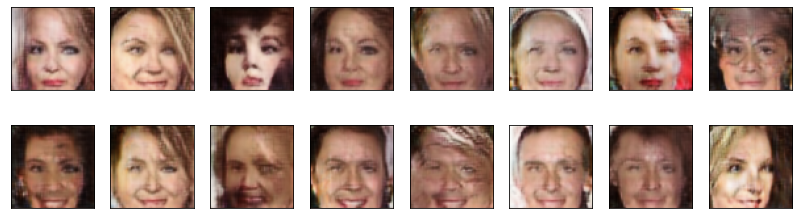

2024-10-31 07:59:50 | Epoch [57/100] | Batch 0/509 | d_loss: -8013971.0000 | g_loss: 4284590.5000
2024-10-31 08:00:34 | Epoch [57/100] | Batch 50/509 | d_loss: -7995132.0000 | g_loss: 4366063.0000
2024-10-31 08:01:17 | Epoch [57/100] | Batch 100/509 | d_loss: -7927923.0000 | g_loss: 4344127.0000
2024-10-31 08:02:01 | Epoch [57/100] | Batch 150/509 | d_loss: -20523.7500 | g_loss: -3685694.0000
2024-10-31 08:02:45 | Epoch [57/100] | Batch 200/509 | d_loss: -8188412.5000 | g_loss: 4382219.5000
2024-10-31 08:03:29 | Epoch [57/100] | Batch 250/509 | d_loss: -8074077.5000 | g_loss: 4408538.5000
2024-10-31 08:04:13 | Epoch [57/100] | Batch 300/509 | d_loss: -8066439.5000 | g_loss: 4413920.0000
2024-10-31 08:04:57 | Epoch [57/100] | Batch 350/509 | d_loss: -7973772.0000 | g_loss: 4340825.0000
2024-10-31 08:05:41 | Epoch [57/100] | Batch 400/509 | d_loss: -8122386.5000 | g_loss: 4417478.0000
2024-10-31 08:06:25 | Epoch [57/100] | Batch 450/509 | d_loss: -370143.5000 | g_loss: -2771658.0000
2024

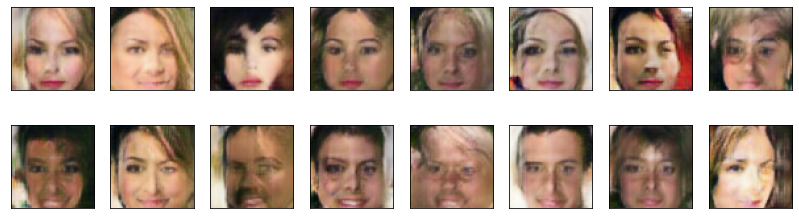

2024-10-31 08:07:21 | Epoch [58/100] | Batch 0/509 | d_loss: -8086340.0000 | g_loss: 4446305.0000
2024-10-31 08:08:05 | Epoch [58/100] | Batch 50/509 | d_loss: -1119561.2500 | g_loss: 3440328.5000
2024-10-31 08:08:48 | Epoch [58/100] | Batch 100/509 | d_loss: -624646.5000 | g_loss: 4496286.5000
2024-10-31 08:09:32 | Epoch [58/100] | Batch 150/509 | d_loss: -8160377.0000 | g_loss: 3972416.2500
2024-10-31 08:10:16 | Epoch [58/100] | Batch 200/509 | d_loss: -7822590.0000 | g_loss: 4103192.5000
2024-10-31 08:11:00 | Epoch [58/100] | Batch 250/509 | d_loss: -7552270.5000 | g_loss: 4493412.5000
2024-10-31 08:11:44 | Epoch [58/100] | Batch 300/509 | d_loss: -439127.7500 | g_loss: 4625254.0000
2024-10-31 08:12:28 | Epoch [58/100] | Batch 350/509 | d_loss: -8106112.0000 | g_loss: 4509651.0000
2024-10-31 08:13:12 | Epoch [58/100] | Batch 400/509 | d_loss: -7894028.0000 | g_loss: 4487473.0000
2024-10-31 08:13:56 | Epoch [58/100] | Batch 450/509 | d_loss: -8199652.0000 | g_loss: 4586064.0000
2024-

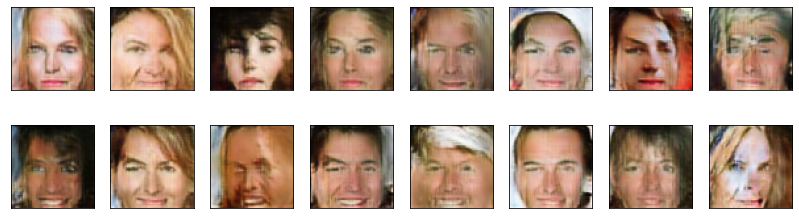

2024-10-31 08:14:52 | Epoch [59/100] | Batch 0/509 | d_loss: -8412029.0000 | g_loss: 4473705.0000
2024-10-31 08:15:36 | Epoch [59/100] | Batch 50/509 | d_loss: -8401737.0000 | g_loss: 4602286.0000
2024-10-31 08:16:20 | Epoch [59/100] | Batch 100/509 | d_loss: -8405085.0000 | g_loss: 4548713.5000
2024-10-31 08:17:04 | Epoch [59/100] | Batch 150/509 | d_loss: -8191315.0000 | g_loss: 4535829.5000
2024-10-31 08:17:48 | Epoch [59/100] | Batch 200/509 | d_loss: -8247649.0000 | g_loss: 4492058.0000
2024-10-31 08:18:32 | Epoch [59/100] | Batch 250/509 | d_loss: -8610894.0000 | g_loss: 4496431.0000
2024-10-31 08:19:16 | Epoch [59/100] | Batch 300/509 | d_loss: -8288861.5000 | g_loss: 4562384.0000
2024-10-31 08:20:00 | Epoch [59/100] | Batch 350/509 | d_loss: -8347221.5000 | g_loss: 4725342.5000
2024-10-31 08:20:44 | Epoch [59/100] | Batch 400/509 | d_loss: -8213175.0000 | g_loss: 4730397.0000
2024-10-31 08:21:28 | Epoch [59/100] | Batch 450/509 | d_loss: -8833902.0000 | g_loss: 4797869.0000
202

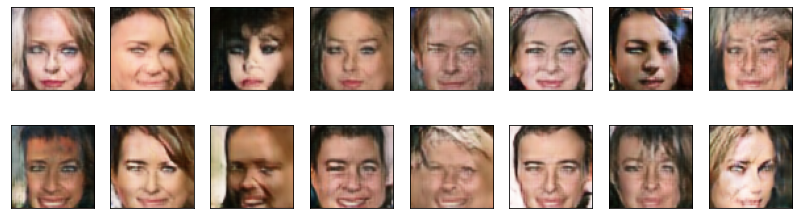

2024-10-31 08:22:23 | Epoch [60/100] | Batch 0/509 | d_loss: -8782552.0000 | g_loss: 4732306.0000
2024-10-31 08:23:07 | Epoch [60/100] | Batch 50/509 | d_loss: -8860646.0000 | g_loss: 4745401.0000
2024-10-31 08:23:51 | Epoch [60/100] | Batch 100/509 | d_loss: -8860208.0000 | g_loss: 4724789.0000
2024-10-31 08:24:34 | Epoch [60/100] | Batch 150/509 | d_loss: -86060.5000 | g_loss: -4117025.0000
2024-10-31 08:25:18 | Epoch [60/100] | Batch 200/509 | d_loss: -8725885.0000 | g_loss: 4671575.0000
2024-10-31 08:26:02 | Epoch [60/100] | Batch 250/509 | d_loss: -8759156.0000 | g_loss: 4866471.5000
2024-10-31 08:26:46 | Epoch [60/100] | Batch 300/509 | d_loss: -8773832.0000 | g_loss: 4718999.0000
2024-10-31 08:27:30 | Epoch [60/100] | Batch 350/509 | d_loss: -174898.7500 | g_loss: -3644251.2500
2024-10-31 08:28:14 | Epoch [60/100] | Batch 400/509 | d_loss: -8938930.0000 | g_loss: 4913225.0000
2024-10-31 08:28:58 | Epoch [60/100] | Batch 450/509 | d_loss: -9112330.0000 | g_loss: 4853151.0000
2024

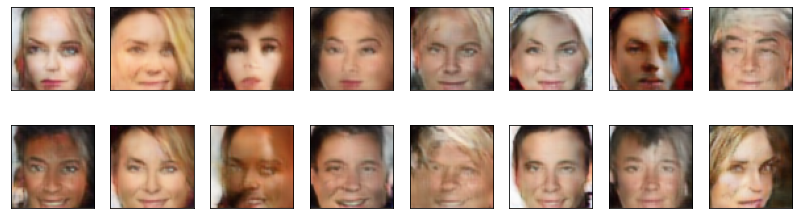

2024-10-31 08:29:54 | Epoch [61/100] | Batch 0/509 | d_loss: -7471009.5000 | g_loss: 4592989.0000
2024-10-31 08:30:38 | Epoch [61/100] | Batch 50/509 | d_loss: -9016159.0000 | g_loss: 4757784.5000
2024-10-31 08:31:22 | Epoch [61/100] | Batch 100/509 | d_loss: -8360927.0000 | g_loss: 5032890.0000
2024-10-31 08:32:05 | Epoch [61/100] | Batch 150/509 | d_loss: -302236.0000 | g_loss: 5062625.0000
2024-10-31 08:32:49 | Epoch [61/100] | Batch 200/509 | d_loss: -9224953.0000 | g_loss: 5068001.0000
2024-10-31 08:33:33 | Epoch [61/100] | Batch 250/509 | d_loss: -155312.0000 | g_loss: 5126541.0000
2024-10-31 08:34:17 | Epoch [61/100] | Batch 300/509 | d_loss: -9282943.0000 | g_loss: 5029554.5000
2024-10-31 08:35:01 | Epoch [61/100] | Batch 350/509 | d_loss: -9448829.0000 | g_loss: 5134174.0000
2024-10-31 08:35:44 | Epoch [61/100] | Batch 400/509 | d_loss: -9240339.0000 | g_loss: 5136505.0000
2024-10-31 08:36:28 | Epoch [61/100] | Batch 450/509 | d_loss: -5685.0000 | g_loss: 5190332.5000
2024-10-

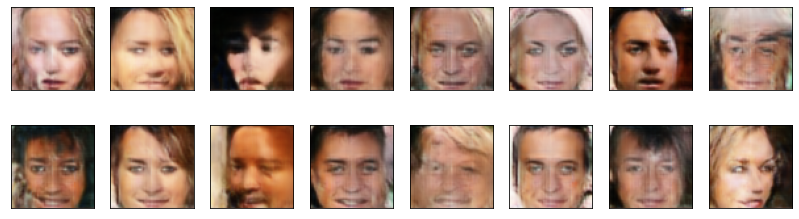

2024-10-31 08:37:24 | Epoch [62/100] | Batch 0/509 | d_loss: -9429742.0000 | g_loss: 5155888.0000
2024-10-31 08:38:08 | Epoch [62/100] | Batch 50/509 | d_loss: -9639252.0000 | g_loss: 5210359.0000
2024-10-31 08:38:52 | Epoch [62/100] | Batch 100/509 | d_loss: -9701882.0000 | g_loss: 5188223.5000
2024-10-31 08:39:36 | Epoch [62/100] | Batch 150/509 | d_loss: -70350.0000 | g_loss: -4387840.0000
2024-10-31 08:40:19 | Epoch [62/100] | Batch 200/509 | d_loss: -9678766.0000 | g_loss: 5177371.5000
2024-10-31 08:41:03 | Epoch [62/100] | Batch 250/509 | d_loss: -144014.0000 | g_loss: -4186904.7500
2024-10-31 08:41:47 | Epoch [62/100] | Batch 300/509 | d_loss: -9549235.0000 | g_loss: 5269026.0000
2024-10-31 08:42:31 | Epoch [62/100] | Batch 350/509 | d_loss: -9795859.0000 | g_loss: 5272030.5000
2024-10-31 08:43:15 | Epoch [62/100] | Batch 400/509 | d_loss: -9855048.0000 | g_loss: 5332752.5000
2024-10-31 08:43:59 | Epoch [62/100] | Batch 450/509 | d_loss: -8208138.5000 | g_loss: -4287587.5000
202

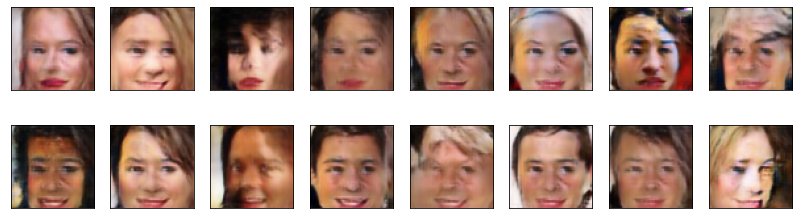

2024-10-31 08:44:54 | Epoch [63/100] | Batch 0/509 | d_loss: -9823512.0000 | g_loss: 5305768.5000
2024-10-31 08:45:38 | Epoch [63/100] | Batch 50/509 | d_loss: -9641850.0000 | g_loss: 5370564.5000
2024-10-31 08:46:22 | Epoch [63/100] | Batch 100/509 | d_loss: -123661.5000 | g_loss: -4049493.7500
2024-10-31 08:47:05 | Epoch [63/100] | Batch 150/509 | d_loss: -9900882.0000 | g_loss: 5382445.0000
2024-10-31 08:47:49 | Epoch [63/100] | Batch 200/509 | d_loss: -185798.0000 | g_loss: -4465047.0000
2024-10-31 08:48:33 | Epoch [63/100] | Batch 250/509 | d_loss: -9949406.0000 | g_loss: 5385625.5000
2024-10-31 08:49:17 | Epoch [63/100] | Batch 300/509 | d_loss: -839720.5000 | g_loss: 5428923.0000
2024-10-31 08:50:01 | Epoch [63/100] | Batch 350/509 | d_loss: -152513.0000 | g_loss: -4571736.5000
2024-10-31 08:50:45 | Epoch [63/100] | Batch 400/509 | d_loss: -10084339.0000 | g_loss: 5474925.5000
2024-10-31 08:51:29 | Epoch [63/100] | Batch 450/509 | d_loss: -9765124.0000 | g_loss: 5437009.0000
202

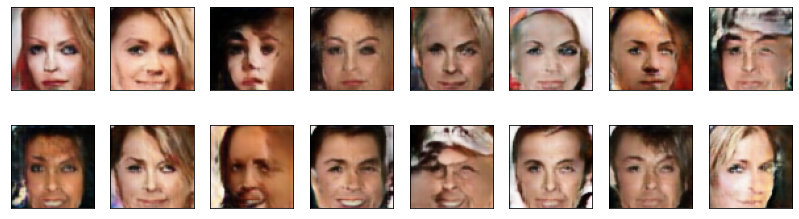

2024-10-31 08:52:24 | Epoch [64/100] | Batch 0/509 | d_loss: -9961913.0000 | g_loss: 5464083.0000
2024-10-31 08:53:08 | Epoch [64/100] | Batch 50/509 | d_loss: -10292616.0000 | g_loss: 5525986.0000
2024-10-31 08:53:52 | Epoch [64/100] | Batch 100/509 | d_loss: 7541.0000 | g_loss: -4465490.0000
2024-10-31 08:54:35 | Epoch [64/100] | Batch 150/509 | d_loss: -10213198.0000 | g_loss: 5451248.0000
2024-10-31 08:55:19 | Epoch [64/100] | Batch 200/509 | d_loss: -10405024.0000 | g_loss: 5587211.0000
2024-10-31 08:56:03 | Epoch [64/100] | Batch 250/509 | d_loss: -10440956.0000 | g_loss: 5619335.5000
2024-10-31 08:56:47 | Epoch [64/100] | Batch 300/509 | d_loss: -37104.0000 | g_loss: 5604540.0000
2024-10-31 08:57:31 | Epoch [64/100] | Batch 350/509 | d_loss: -10095006.0000 | g_loss: 5559962.0000
2024-10-31 08:58:15 | Epoch [64/100] | Batch 400/509 | d_loss: -103341.5000 | g_loss: -4712586.0000
2024-10-31 08:58:59 | Epoch [64/100] | Batch 450/509 | d_loss: -10343527.0000 | g_loss: 5631226.0000
20

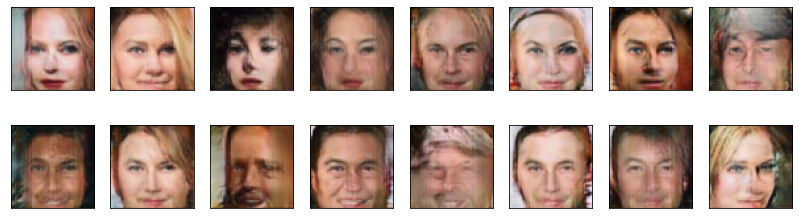

2024-10-31 08:59:55 | Epoch [65/100] | Batch 0/509 | d_loss: -61161.0000 | g_loss: -4660622.0000
2024-10-31 09:00:39 | Epoch [65/100] | Batch 50/509 | d_loss: -74310.0000 | g_loss: -4001846.0000
2024-10-31 09:01:23 | Epoch [65/100] | Batch 100/509 | d_loss: -395907.0000 | g_loss: 5686873.0000
2024-10-31 09:02:07 | Epoch [65/100] | Batch 150/509 | d_loss: -10551432.0000 | g_loss: 5644846.0000
2024-10-31 09:03:35 | Epoch [65/100] | Batch 250/509 | d_loss: -10615442.0000 | g_loss: 5740180.5000
2024-10-31 09:04:19 | Epoch [65/100] | Batch 300/509 | d_loss: -10580694.0000 | g_loss: 5690377.0000
2024-10-31 09:05:03 | Epoch [65/100] | Batch 350/509 | d_loss: -31473.5000 | g_loss: 5805960.0000
2024-10-31 09:05:47 | Epoch [65/100] | Batch 400/509 | d_loss: -10440278.0000 | g_loss: 5655105.5000
2024-10-31 09:06:30 | Epoch [65/100] | Batch 450/509 | d_loss: -38186.0000 | g_loss: 5820406.5000
2024-10-31 09:07:14 | Epoch [65/100] | Batch 500/509 | d_loss: -332245.0000 | g_loss: -4381344.0000


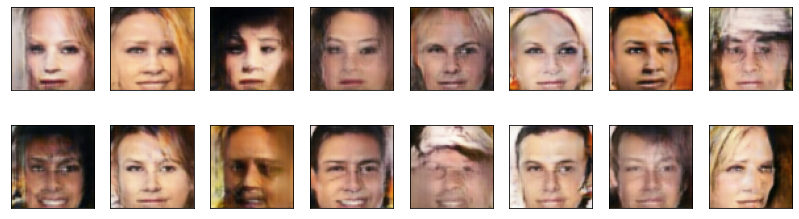

2024-10-31 09:07:25 | Epoch [66/100] | Batch 0/509 | d_loss: -10351304.0000 | g_loss: 5767972.5000
2024-10-31 09:08:09 | Epoch [66/100] | Batch 50/509 | d_loss: -10866010.0000 | g_loss: 5813883.0000
2024-10-31 09:08:53 | Epoch [66/100] | Batch 100/509 | d_loss: -10803286.0000 | g_loss: 5812455.0000
2024-10-31 09:09:37 | Epoch [66/100] | Batch 150/509 | d_loss: -112584.0000 | g_loss: -4910034.0000
2024-10-31 09:10:21 | Epoch [66/100] | Batch 200/509 | d_loss: -10737521.0000 | g_loss: 5852530.0000
2024-10-31 09:11:49 | Epoch [66/100] | Batch 300/509 | d_loss: -11017239.0000 | g_loss: 5925699.0000
2024-10-31 09:12:33 | Epoch [66/100] | Batch 350/509 | d_loss: -10799288.0000 | g_loss: 5832611.0000
2024-10-31 09:13:16 | Epoch [66/100] | Batch 400/509 | d_loss: -10875848.0000 | g_loss: 5910739.0000
2024-10-31 09:14:00 | Epoch [66/100] | Batch 450/509 | d_loss: -8787598.0000 | g_loss: 5954874.0000
2024-10-31 09:14:44 | Epoch [66/100] | Batch 500/509 | d_loss: -10809124.0000 | g_loss: 5925838.

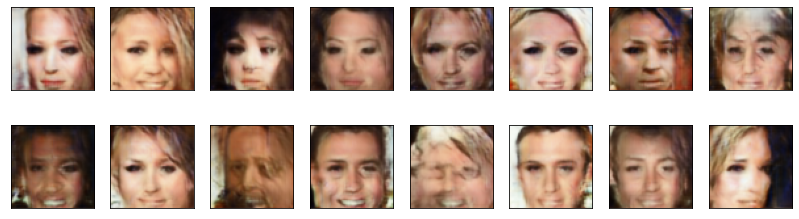

2024-10-31 09:14:55 | Epoch [67/100] | Batch 0/509 | d_loss: -11012602.0000 | g_loss: 5887143.0000
2024-10-31 09:15:39 | Epoch [67/100] | Batch 50/509 | d_loss: -11132530.0000 | g_loss: 5993134.0000
2024-10-31 09:16:23 | Epoch [67/100] | Batch 100/509 | d_loss: -10576621.0000 | g_loss: 5802788.0000
2024-10-31 09:17:07 | Epoch [67/100] | Batch 150/509 | d_loss: -267732.0000 | g_loss: -4598714.0000
2024-10-31 09:17:51 | Epoch [67/100] | Batch 200/509 | d_loss: -11046971.0000 | g_loss: 5920323.5000
2024-10-31 09:18:35 | Epoch [67/100] | Batch 250/509 | d_loss: -10852048.0000 | g_loss: 5933845.0000
2024-10-31 09:19:18 | Epoch [67/100] | Batch 300/509 | d_loss: -10769336.0000 | g_loss: 5949767.0000
2024-10-31 09:20:02 | Epoch [67/100] | Batch 350/509 | d_loss: -11253460.0000 | g_loss: 6082844.0000
2024-10-31 09:20:46 | Epoch [67/100] | Batch 400/509 | d_loss: -11238826.0000 | g_loss: 5994410.0000
2024-10-31 09:21:30 | Epoch [67/100] | Batch 450/509 | d_loss: -11479436.0000 | g_loss: 6163398

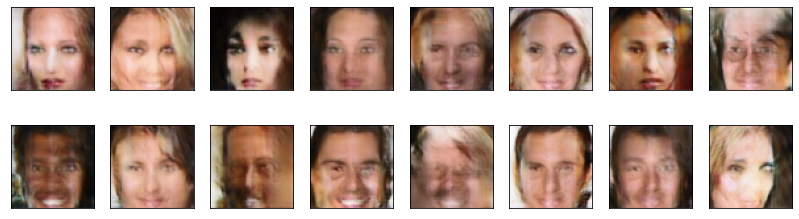

2024-10-31 09:22:26 | Epoch [68/100] | Batch 0/509 | d_loss: -11536248.0000 | g_loss: 6162942.0000
2024-10-31 09:23:10 | Epoch [68/100] | Batch 50/509 | d_loss: -11533679.0000 | g_loss: 6202525.0000
2024-10-31 09:23:54 | Epoch [68/100] | Batch 100/509 | d_loss: -71145.0000 | g_loss: -5185721.0000
2024-10-31 09:24:37 | Epoch [68/100] | Batch 150/509 | d_loss: -11070686.0000 | g_loss: 6124133.0000
2024-10-31 09:25:21 | Epoch [68/100] | Batch 200/509 | d_loss: -11257014.0000 | g_loss: 6079427.0000
2024-10-31 09:26:05 | Epoch [68/100] | Batch 250/509 | d_loss: -11536861.0000 | g_loss: 6233425.0000
2024-10-31 09:26:49 | Epoch [68/100] | Batch 300/509 | d_loss: -11486681.0000 | g_loss: 6218038.5000
2024-10-31 09:27:33 | Epoch [68/100] | Batch 350/509 | d_loss: -11612826.0000 | g_loss: 6231927.5000
2024-10-31 09:28:17 | Epoch [68/100] | Batch 400/509 | d_loss: -11642824.0000 | g_loss: 6278230.5000
2024-10-31 09:29:00 | Epoch [68/100] | Batch 450/509 | d_loss: -330412.0000 | g_loss: -4923455.0

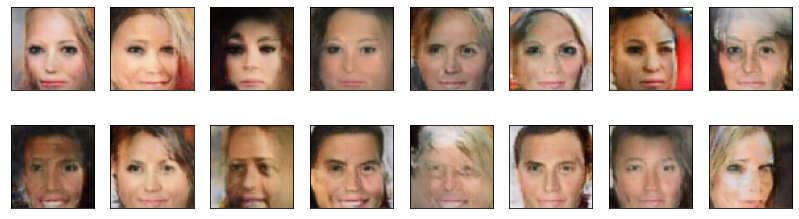

2024-10-31 09:29:55 | Epoch [69/100] | Batch 0/509 | d_loss: -11434932.0000 | g_loss: 6263609.0000
2024-10-31 09:30:39 | Epoch [69/100] | Batch 50/509 | d_loss: -11597450.0000 | g_loss: 6306635.0000
2024-10-31 09:31:23 | Epoch [69/100] | Batch 100/509 | d_loss: -11588576.0000 | g_loss: 6268103.0000
2024-10-31 09:32:07 | Epoch [69/100] | Batch 150/509 | d_loss: -11227534.0000 | g_loss: 6333298.5000
2024-10-31 09:32:51 | Epoch [69/100] | Batch 200/509 | d_loss: -11615128.0000 | g_loss: 6245974.0000
2024-10-31 09:33:34 | Epoch [69/100] | Batch 250/509 | d_loss: -60219.0000 | g_loss: -5380638.0000
2024-10-31 09:34:18 | Epoch [69/100] | Batch 300/509 | d_loss: -11765640.0000 | g_loss: 6381779.5000
2024-10-31 09:35:02 | Epoch [69/100] | Batch 350/509 | d_loss: -11844029.0000 | g_loss: 6349908.5000
2024-10-31 09:35:46 | Epoch [69/100] | Batch 400/509 | d_loss: -11728352.0000 | g_loss: 6384550.5000
2024-10-31 09:36:30 | Epoch [69/100] | Batch 450/509 | d_loss: -11865525.0000 | g_loss: 6427113.

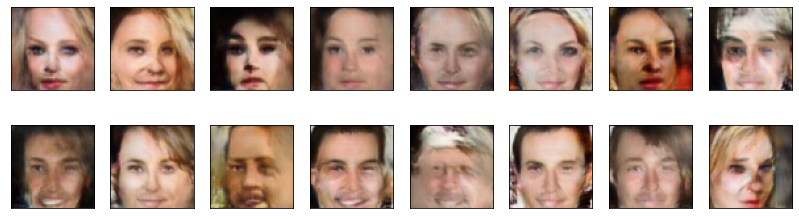

2024-10-31 09:37:26 | Epoch [70/100] | Batch 0/509 | d_loss: -11560126.0000 | g_loss: 6441843.5000
2024-10-31 09:38:10 | Epoch [70/100] | Batch 50/509 | d_loss: -12089400.0000 | g_loss: 6493526.0000
2024-10-31 09:38:54 | Epoch [70/100] | Batch 100/509 | d_loss: -12099283.0000 | g_loss: 6484400.0000
2024-10-31 09:39:37 | Epoch [70/100] | Batch 150/509 | d_loss: 1357.5000 | g_loss: 6514832.0000
2024-10-31 09:40:21 | Epoch [70/100] | Batch 200/509 | d_loss: -12074775.0000 | g_loss: 6466744.0000
2024-10-31 09:41:05 | Epoch [70/100] | Batch 250/509 | d_loss: -12122647.0000 | g_loss: 6541216.0000
2024-10-31 09:41:49 | Epoch [70/100] | Batch 300/509 | d_loss: -12155441.0000 | g_loss: 6582173.0000
2024-10-31 09:42:33 | Epoch [70/100] | Batch 350/509 | d_loss: -12209202.0000 | g_loss: 6601810.0000
2024-10-31 09:43:17 | Epoch [70/100] | Batch 400/509 | d_loss: 5729.0000 | g_loss: -5637007.0000
2024-10-31 09:44:00 | Epoch [70/100] | Batch 450/509 | d_loss: -82823.0000 | g_loss: 6591131.0000
2024-

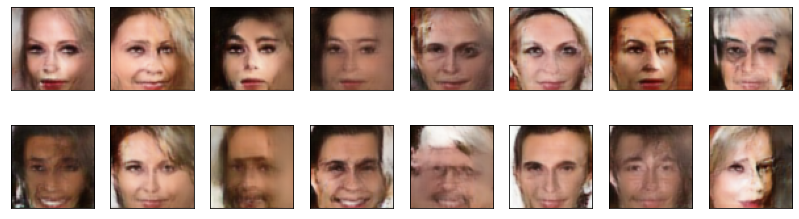

2024-10-31 09:44:55 | Epoch [71/100] | Batch 0/509 | d_loss: -12086939.0000 | g_loss: 6516283.5000
2024-10-31 09:45:39 | Epoch [71/100] | Batch 50/509 | d_loss: -12228434.0000 | g_loss: 6602278.0000
2024-10-31 09:46:23 | Epoch [71/100] | Batch 100/509 | d_loss: -12187631.0000 | g_loss: 6638247.0000
2024-10-31 09:47:06 | Epoch [71/100] | Batch 150/509 | d_loss: -31410.5000 | g_loss: -5703950.5000
2024-10-31 09:47:50 | Epoch [71/100] | Batch 200/509 | d_loss: -265908.5000 | g_loss: -5594145.0000
2024-10-31 09:48:34 | Epoch [71/100] | Batch 250/509 | d_loss: -225480.5000 | g_loss: -5116888.0000
2024-10-31 09:49:18 | Epoch [71/100] | Batch 300/509 | d_loss: -12395242.0000 | g_loss: 6650442.0000
2024-10-31 09:50:02 | Epoch [71/100] | Batch 350/509 | d_loss: -12332810.0000 | g_loss: 6670361.0000
2024-10-31 09:50:46 | Epoch [71/100] | Batch 400/509 | d_loss: -12463996.0000 | g_loss: 6677164.5000
2024-10-31 09:51:30 | Epoch [71/100] | Batch 450/509 | d_loss: -12593485.0000 | g_loss: 6764739.00

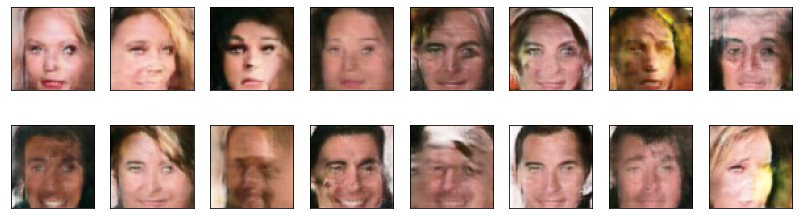

2024-10-31 09:52:26 | Epoch [72/100] | Batch 0/509 | d_loss: -12618040.0000 | g_loss: 6777829.5000
2024-10-31 09:53:10 | Epoch [72/100] | Batch 50/509 | d_loss: -115438.0000 | g_loss: -5351898.5000
2024-10-31 09:53:53 | Epoch [72/100] | Batch 100/509 | d_loss: -12627246.0000 | g_loss: 6775551.0000
2024-10-31 09:54:37 | Epoch [72/100] | Batch 150/509 | d_loss: -114911.0000 | g_loss: -5309299.0000
2024-10-31 09:55:21 | Epoch [72/100] | Batch 200/509 | d_loss: -12318176.0000 | g_loss: 6740855.0000
2024-10-31 09:56:05 | Epoch [72/100] | Batch 250/509 | d_loss: -12356772.0000 | g_loss: 6679951.0000
2024-10-31 09:56:49 | Epoch [72/100] | Batch 300/509 | d_loss: -12530974.0000 | g_loss: 6717490.0000
2024-10-31 09:57:33 | Epoch [72/100] | Batch 350/509 | d_loss: -12547243.0000 | g_loss: 6806979.0000
2024-10-31 09:58:17 | Epoch [72/100] | Batch 400/509 | d_loss: -12686908.0000 | g_loss: 6900295.5000
2024-10-31 09:59:01 | Epoch [72/100] | Batch 450/509 | d_loss: -12743536.0000 | g_loss: 6890326.

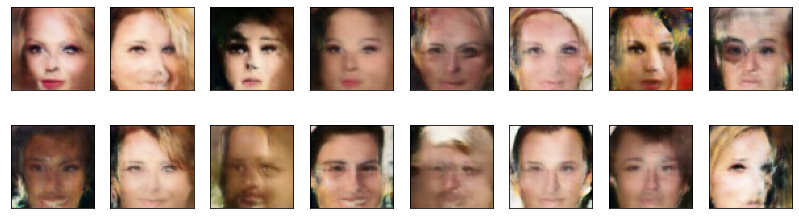

2024-10-31 09:59:56 | Epoch [73/100] | Batch 0/509 | d_loss: -12803474.0000 | g_loss: 6889592.0000
2024-10-31 10:00:40 | Epoch [73/100] | Batch 50/509 | d_loss: -194224.0000 | g_loss: -5866719.0000
2024-10-31 10:01:24 | Epoch [73/100] | Batch 100/509 | d_loss: -12710120.0000 | g_loss: 6904629.5000
2024-10-31 10:02:08 | Epoch [73/100] | Batch 150/509 | d_loss: -12603578.0000 | g_loss: 6824789.0000
2024-10-31 10:02:52 | Epoch [73/100] | Batch 200/509 | d_loss: -12813111.0000 | g_loss: 6926840.0000
2024-10-31 10:03:36 | Epoch [73/100] | Batch 250/509 | d_loss: -12940427.0000 | g_loss: 6962757.0000
2024-10-31 10:04:20 | Epoch [73/100] | Batch 300/509 | d_loss: -12950881.0000 | g_loss: 6976707.0000
2024-10-31 10:05:04 | Epoch [73/100] | Batch 350/509 | d_loss: -13078600.0000 | g_loss: 7007712.0000
2024-10-31 10:06:31 | Epoch [73/100] | Batch 450/509 | d_loss: -89693.5000 | g_loss: -5913178.0000
2024-10-31 10:07:15 | Epoch [73/100] | Batch 500/509 | d_loss: -195434.0000 | g_loss: 7051259.000

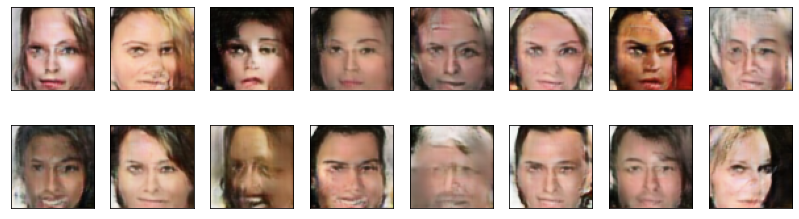

2024-10-31 10:07:27 | Epoch [74/100] | Batch 0/509 | d_loss: -12858618.0000 | g_loss: 6761956.0000
2024-10-31 10:08:10 | Epoch [74/100] | Batch 50/509 | d_loss: -12402253.0000 | g_loss: 6552955.5000
2024-10-31 10:08:54 | Epoch [74/100] | Batch 100/509 | d_loss: -12073778.0000 | g_loss: 6947579.5000
2024-10-31 10:09:38 | Epoch [74/100] | Batch 150/509 | d_loss: -12250484.0000 | g_loss: -2891647.0000
2024-10-31 10:10:22 | Epoch [74/100] | Batch 200/509 | d_loss: -13138092.0000 | g_loss: 7023996.0000
2024-10-31 10:11:06 | Epoch [74/100] | Batch 250/509 | d_loss: -13167525.0000 | g_loss: 7085306.5000
2024-10-31 10:11:50 | Epoch [74/100] | Batch 300/509 | d_loss: -13112450.0000 | g_loss: 7042974.0000
2024-10-31 10:12:34 | Epoch [74/100] | Batch 350/509 | d_loss: -13197338.0000 | g_loss: 7139225.0000
2024-10-31 10:13:17 | Epoch [74/100] | Batch 400/509 | d_loss: -13237296.0000 | g_loss: 7133073.0000
2024-10-31 10:14:01 | Epoch [74/100] | Batch 450/509 | d_loss: -10695151.0000 | g_loss: -5916

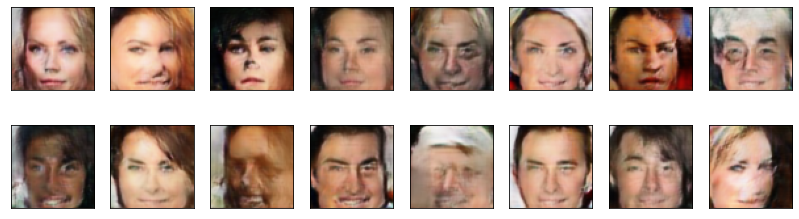

2024-10-31 10:14:56 | Epoch [75/100] | Batch 0/509 | d_loss: -12960369.0000 | g_loss: 7028852.0000
2024-10-31 10:15:40 | Epoch [75/100] | Batch 50/509 | d_loss: -13362129.0000 | g_loss: 7184331.0000
2024-10-31 10:16:24 | Epoch [75/100] | Batch 100/509 | d_loss: -13432870.0000 | g_loss: 7242070.0000
2024-10-31 10:17:08 | Epoch [75/100] | Batch 150/509 | d_loss: -13521194.0000 | g_loss: 7265121.0000
2024-10-31 10:17:51 | Epoch [75/100] | Batch 200/509 | d_loss: -13545280.0000 | g_loss: 7279551.0000
2024-10-31 10:18:35 | Epoch [75/100] | Batch 250/509 | d_loss: -13570016.0000 | g_loss: 7301355.0000
2024-10-31 10:19:19 | Epoch [75/100] | Batch 300/509 | d_loss: -13613120.0000 | g_loss: 7316309.5000
2024-10-31 10:20:03 | Epoch [75/100] | Batch 350/509 | d_loss: -13630212.0000 | g_loss: 7322107.5000
2024-10-31 10:20:47 | Epoch [75/100] | Batch 400/509 | d_loss: -13637678.0000 | g_loss: 7279392.5000
2024-10-31 10:21:30 | Epoch [75/100] | Batch 450/509 | d_loss: -13496967.0000 | g_loss: 733023

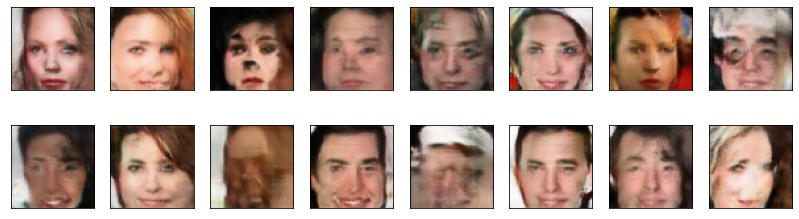

2024-10-31 10:22:26 | Epoch [76/100] | Batch 0/509 | d_loss: -11872.0000 | g_loss: 7333144.0000
2024-10-31 10:23:10 | Epoch [76/100] | Batch 50/509 | d_loss: -12336449.0000 | g_loss: 7324308.5000
2024-10-31 10:23:54 | Epoch [76/100] | Batch 100/509 | d_loss: -13285244.0000 | g_loss: 7219111.0000
2024-10-31 10:24:38 | Epoch [76/100] | Batch 150/509 | d_loss: -13557416.0000 | g_loss: 7296935.0000
2024-10-31 10:25:22 | Epoch [76/100] | Batch 200/509 | d_loss: -13636544.0000 | g_loss: 7360503.5000
2024-10-31 10:26:06 | Epoch [76/100] | Batch 250/509 | d_loss: -13703088.0000 | g_loss: 7368512.0000
2024-10-31 10:26:50 | Epoch [76/100] | Batch 300/509 | d_loss: -13479566.0000 | g_loss: 7270896.0000
2024-10-31 10:27:34 | Epoch [76/100] | Batch 350/509 | d_loss: -13693023.0000 | g_loss: 7410285.0000
2024-10-31 10:28:17 | Epoch [76/100] | Batch 400/509 | d_loss: -253239.0000 | g_loss: -6263609.0000
2024-10-31 10:29:01 | Epoch [76/100] | Batch 450/509 | d_loss: -13805170.0000 | g_loss: 7379992.50

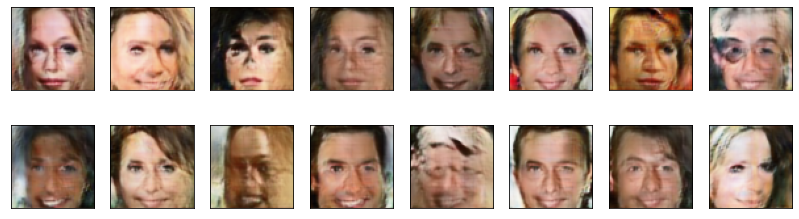

2024-10-31 10:29:57 | Epoch [77/100] | Batch 0/509 | d_loss: -517767.0000 | g_loss: 7480460.5000
2024-10-31 10:30:41 | Epoch [77/100] | Batch 50/509 | d_loss: -13411560.0000 | g_loss: 7182403.0000
2024-10-31 10:31:24 | Epoch [77/100] | Batch 100/509 | d_loss: -13791220.0000 | g_loss: 7447595.5000
2024-10-31 10:32:08 | Epoch [77/100] | Batch 150/509 | d_loss: -13926017.0000 | g_loss: 7472503.0000
2024-10-31 10:32:52 | Epoch [77/100] | Batch 200/509 | d_loss: -13971762.0000 | g_loss: 7469697.0000
2024-10-31 10:33:36 | Epoch [77/100] | Batch 250/509 | d_loss: -13945478.0000 | g_loss: 7506337.0000
2024-10-31 10:34:19 | Epoch [77/100] | Batch 300/509 | d_loss: -13977366.0000 | g_loss: 7487906.0000
2024-10-31 10:35:03 | Epoch [77/100] | Batch 350/509 | d_loss: -13925974.0000 | g_loss: 7557296.5000
2024-10-31 10:35:47 | Epoch [77/100] | Batch 400/509 | d_loss: -13782956.0000 | g_loss: 7487704.0000
2024-10-31 10:36:31 | Epoch [77/100] | Batch 450/509 | d_loss: -13906969.0000 | g_loss: 7519895.

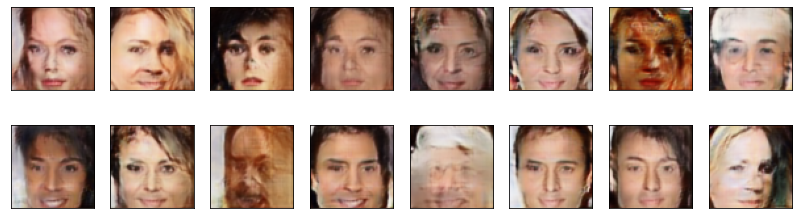

2024-10-31 10:37:26 | Epoch [78/100] | Batch 0/509 | d_loss: -13908202.0000 | g_loss: 7536135.0000
2024-10-31 10:38:10 | Epoch [78/100] | Batch 50/509 | d_loss: -14193215.0000 | g_loss: 7660174.0000
2024-10-31 10:38:54 | Epoch [78/100] | Batch 100/509 | d_loss: -14209215.0000 | g_loss: 7650832.0000
2024-10-31 10:39:37 | Epoch [78/100] | Batch 150/509 | d_loss: -14263958.0000 | g_loss: 7668790.0000
2024-10-31 10:40:21 | Epoch [78/100] | Batch 200/509 | d_loss: -14285605.0000 | g_loss: 7661429.0000
2024-10-31 10:41:05 | Epoch [78/100] | Batch 250/509 | d_loss: -14188338.0000 | g_loss: 7654825.5000
2024-10-31 10:41:49 | Epoch [78/100] | Batch 300/509 | d_loss: -14300735.0000 | g_loss: 7682613.0000
2024-10-31 10:42:33 | Epoch [78/100] | Batch 350/509 | d_loss: -14381244.0000 | g_loss: 7735028.0000
2024-10-31 10:43:17 | Epoch [78/100] | Batch 400/509 | d_loss: -14402463.0000 | g_loss: 7749998.0000
2024-10-31 10:44:00 | Epoch [78/100] | Batch 450/509 | d_loss: -14470178.0000 | g_loss: 775582

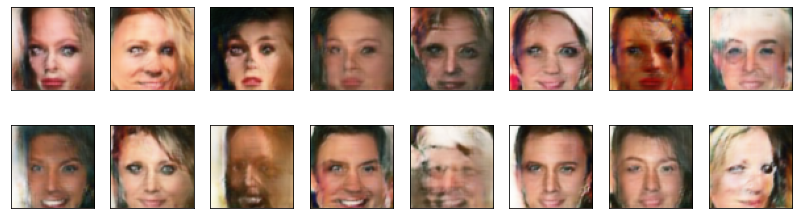

2024-10-31 10:44:55 | Epoch [79/100] | Batch 0/509 | d_loss: -14493862.0000 | g_loss: 7780655.0000
2024-10-31 10:45:39 | Epoch [79/100] | Batch 50/509 | d_loss: -14517575.0000 | g_loss: 7812895.0000
2024-10-31 10:46:23 | Epoch [79/100] | Batch 100/509 | d_loss: -14511392.0000 | g_loss: 7801267.0000
2024-10-31 10:47:07 | Epoch [79/100] | Batch 150/509 | d_loss: -99379.5000 | g_loss: -6367269.0000
2024-10-31 10:47:50 | Epoch [79/100] | Batch 200/509 | d_loss: -227767.0000 | g_loss: -6295537.0000
2024-10-31 10:48:34 | Epoch [79/100] | Batch 250/509 | d_loss: -14467708.0000 | g_loss: 7797811.5000
2024-10-31 10:49:18 | Epoch [79/100] | Batch 300/509 | d_loss: -14487450.0000 | g_loss: 7793524.5000
2024-10-31 10:50:02 | Epoch [79/100] | Batch 350/509 | d_loss: -14563760.0000 | g_loss: 7828428.5000
2024-10-31 10:50:46 | Epoch [79/100] | Batch 400/509 | d_loss: -339818.0000 | g_loss: -5830163.5000
2024-10-31 10:51:30 | Epoch [79/100] | Batch 450/509 | d_loss: -14499366.0000 | g_loss: 7737760.00

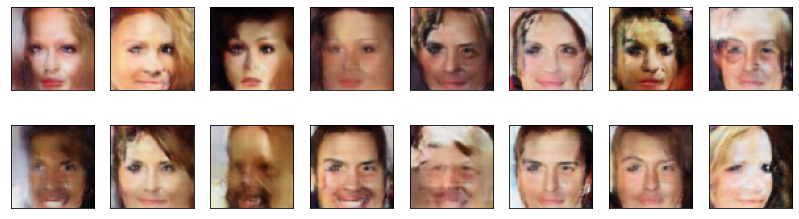

2024-10-31 10:52:25 | Epoch [80/100] | Batch 0/509 | d_loss: -14487710.0000 | g_loss: 7848405.0000
2024-10-31 10:53:09 | Epoch [80/100] | Batch 50/509 | d_loss: -14532181.0000 | g_loss: 7869304.5000
2024-10-31 10:53:53 | Epoch [80/100] | Batch 100/509 | d_loss: -194597.5000 | g_loss: -6259131.5000
2024-10-31 10:54:37 | Epoch [80/100] | Batch 150/509 | d_loss: -14590307.0000 | g_loss: 7896430.5000
2024-10-31 10:55:21 | Epoch [80/100] | Batch 200/509 | d_loss: -14484168.0000 | g_loss: 7874795.0000
2024-10-31 10:56:05 | Epoch [80/100] | Batch 250/509 | d_loss: -14539100.0000 | g_loss: 7874651.0000
2024-10-31 10:56:48 | Epoch [80/100] | Batch 300/509 | d_loss: -14724115.0000 | g_loss: 7927330.5000
2024-10-31 10:57:32 | Epoch [80/100] | Batch 350/509 | d_loss: -14778904.0000 | g_loss: 7914022.0000
2024-10-31 10:58:16 | Epoch [80/100] | Batch 400/509 | d_loss: -14781126.0000 | g_loss: 7950207.0000
2024-10-31 10:59:00 | Epoch [80/100] | Batch 450/509 | d_loss: -14729453.0000 | g_loss: 7930937

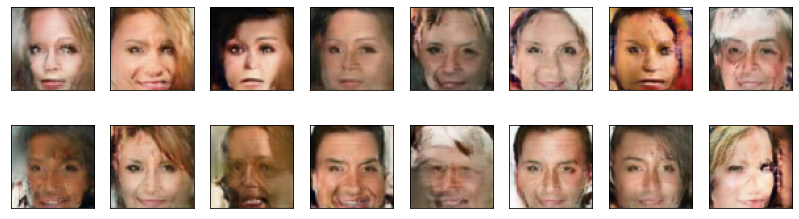

2024-10-31 10:59:56 | Epoch [81/100] | Batch 0/509 | d_loss: -14651343.0000 | g_loss: 7729379.0000
2024-10-31 11:00:40 | Epoch [81/100] | Batch 50/509 | d_loss: -14576698.0000 | g_loss: 7999324.0000
2024-10-31 11:01:23 | Epoch [81/100] | Batch 100/509 | d_loss: -14639484.0000 | g_loss: 7990613.0000
2024-10-31 11:02:07 | Epoch [81/100] | Batch 150/509 | d_loss: -37114.0000 | g_loss: 8018491.5000
2024-10-31 11:02:51 | Epoch [81/100] | Batch 200/509 | d_loss: -14925440.0000 | g_loss: 8069141.0000
2024-10-31 11:03:35 | Epoch [81/100] | Batch 250/509 | d_loss: -14951690.0000 | g_loss: 8021308.5000
2024-10-31 11:04:19 | Epoch [81/100] | Batch 300/509 | d_loss: -14999298.0000 | g_loss: 8038094.0000
2024-10-31 11:05:03 | Epoch [81/100] | Batch 350/509 | d_loss: -15016854.0000 | g_loss: 8100101.0000
2024-10-31 11:05:47 | Epoch [81/100] | Batch 400/509 | d_loss: -14433838.0000 | g_loss: 8053973.0000
2024-10-31 11:06:31 | Epoch [81/100] | Batch 450/509 | d_loss: -14936905.0000 | g_loss: 8026457.0

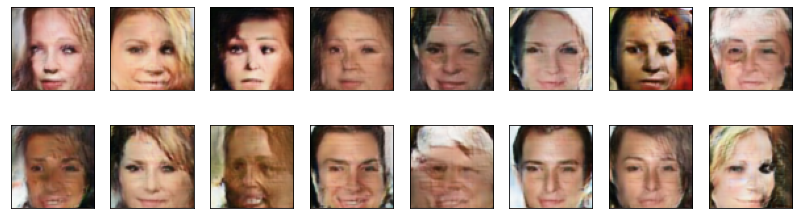

2024-10-31 11:07:26 | Epoch [82/100] | Batch 0/509 | d_loss: -15003204.0000 | g_loss: 8079433.0000
2024-10-31 11:08:10 | Epoch [82/100] | Batch 50/509 | d_loss: -15062998.0000 | g_loss: 8105361.5000
2024-10-31 11:08:54 | Epoch [82/100] | Batch 100/509 | d_loss: -740575.0000 | g_loss: -4686435.0000
2024-10-31 11:09:37 | Epoch [82/100] | Batch 150/509 | d_loss: -15052379.0000 | g_loss: 8053607.0000
2024-10-31 11:10:21 | Epoch [82/100] | Batch 200/509 | d_loss: -14573493.0000 | g_loss: 8149246.5000
2024-10-31 11:11:05 | Epoch [82/100] | Batch 250/509 | d_loss: -15089230.0000 | g_loss: 8119208.0000
2024-10-31 11:11:49 | Epoch [82/100] | Batch 300/509 | d_loss: -14437675.0000 | g_loss: 7901373.0000
2024-10-31 11:12:33 | Epoch [82/100] | Batch 350/509 | d_loss: -14896085.0000 | g_loss: 8102255.0000
2024-10-31 11:13:17 | Epoch [82/100] | Batch 400/509 | d_loss: -14914548.0000 | g_loss: 8139995.0000
2024-10-31 11:14:01 | Epoch [82/100] | Batch 450/509 | d_loss: -15110526.0000 | g_loss: 8088124

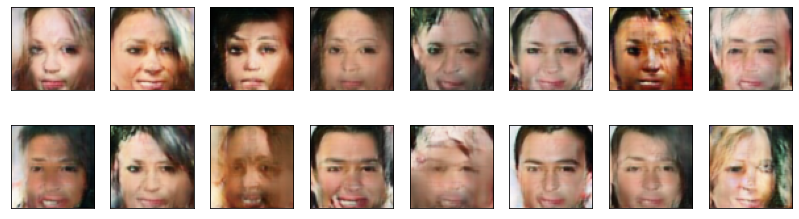

2024-10-31 11:14:56 | Epoch [83/100] | Batch 0/509 | d_loss: -14327395.0000 | g_loss: 8175903.0000
2024-10-31 11:15:40 | Epoch [83/100] | Batch 50/509 | d_loss: -14987069.0000 | g_loss: 7963708.0000
2024-10-31 11:16:24 | Epoch [83/100] | Batch 100/509 | d_loss: -15145653.0000 | g_loss: 8213241.0000
2024-10-31 11:17:08 | Epoch [83/100] | Batch 150/509 | d_loss: -14339409.0000 | g_loss: 8194450.0000
2024-10-31 11:17:52 | Epoch [83/100] | Batch 200/509 | d_loss: -85447.0000 | g_loss: -7026603.5000
2024-10-31 11:18:35 | Epoch [83/100] | Batch 250/509 | d_loss: -14843486.0000 | g_loss: 8212623.0000
2024-10-31 11:19:19 | Epoch [83/100] | Batch 300/509 | d_loss: -5570.5000 | g_loss: 8289609.0000
2024-10-31 11:20:03 | Epoch [83/100] | Batch 350/509 | d_loss: -15173462.0000 | g_loss: 8159255.0000
2024-10-31 11:20:47 | Epoch [83/100] | Batch 400/509 | d_loss: -14763414.0000 | g_loss: 8224655.5000
2024-10-31 11:21:31 | Epoch [83/100] | Batch 450/509 | d_loss: -15043530.0000 | g_loss: 8171263.0000

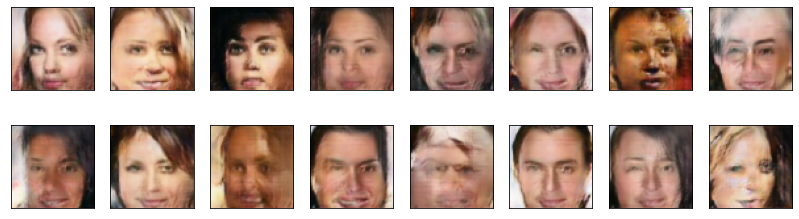

2024-10-31 11:22:26 | Epoch [84/100] | Batch 0/509 | d_loss: -14863794.0000 | g_loss: 8296686.0000
2024-10-31 11:23:10 | Epoch [84/100] | Batch 50/509 | d_loss: -15166652.0000 | g_loss: 8246788.0000
2024-10-31 11:23:54 | Epoch [84/100] | Batch 100/509 | d_loss: -15280614.0000 | g_loss: 8255291.5000
2024-10-31 11:24:38 | Epoch [84/100] | Batch 150/509 | d_loss: -93248.5000 | g_loss: 8357800.5000
2024-10-31 11:25:22 | Epoch [84/100] | Batch 200/509 | d_loss: -15292366.0000 | g_loss: 8268766.0000
2024-10-31 11:26:06 | Epoch [84/100] | Batch 250/509 | d_loss: -15294929.0000 | g_loss: 8289125.5000
2024-10-31 11:26:50 | Epoch [84/100] | Batch 300/509 | d_loss: -15291698.0000 | g_loss: 8356790.5000
2024-10-31 11:27:34 | Epoch [84/100] | Batch 350/509 | d_loss: -15441381.0000 | g_loss: 8319970.0000
2024-10-31 11:28:18 | Epoch [84/100] | Batch 400/509 | d_loss: -61915.0000 | g_loss: -7150995.0000
2024-10-31 11:29:02 | Epoch [84/100] | Batch 450/509 | d_loss: -15413548.0000 | g_loss: 8336617.500

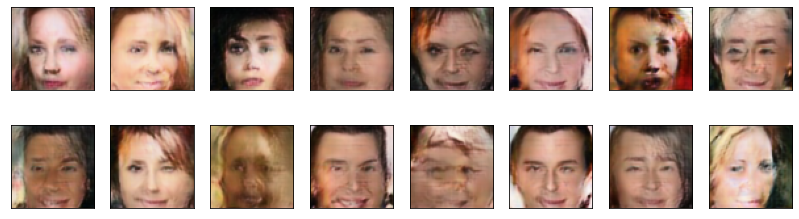

2024-10-31 11:29:57 | Epoch [85/100] | Batch 0/509 | d_loss: -15352941.0000 | g_loss: 8248837.0000
2024-10-31 11:30:41 | Epoch [85/100] | Batch 50/509 | d_loss: -15609600.0000 | g_loss: 8374585.0000
2024-10-31 11:31:25 | Epoch [85/100] | Batch 100/509 | d_loss: -15690413.0000 | g_loss: 8470048.0000
2024-10-31 11:32:09 | Epoch [85/100] | Batch 150/509 | d_loss: -15764680.0000 | g_loss: 8475969.0000
2024-10-31 11:32:53 | Epoch [85/100] | Batch 200/509 | d_loss: -15741468.0000 | g_loss: 8479758.0000
2024-10-31 11:33:37 | Epoch [85/100] | Batch 250/509 | d_loss: -125864.0000 | g_loss: -7175832.0000
2024-10-31 11:34:21 | Epoch [85/100] | Batch 300/509 | d_loss: -1006436.0000 | g_loss: 8087671.5000
2024-10-31 11:35:05 | Epoch [85/100] | Batch 350/509 | d_loss: -15706265.0000 | g_loss: 8376271.5000
2024-10-31 11:35:49 | Epoch [85/100] | Batch 400/509 | d_loss: -15791942.0000 | g_loss: 8490532.0000
2024-10-31 11:36:33 | Epoch [85/100] | Batch 450/509 | d_loss: -15783286.0000 | g_loss: 8533426.

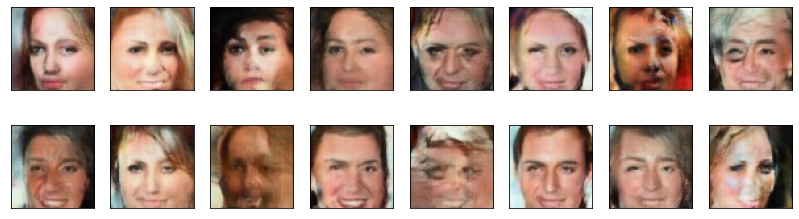

2024-10-31 11:37:28 | Epoch [86/100] | Batch 0/509 | d_loss: -15892757.0000 | g_loss: 8513772.0000
2024-10-31 11:38:12 | Epoch [86/100] | Batch 50/509 | d_loss: -656741.5000 | g_loss: 8511432.0000
2024-10-31 11:38:56 | Epoch [86/100] | Batch 100/509 | d_loss: -15526606.0000 | g_loss: 7628355.0000
2024-10-31 11:39:40 | Epoch [86/100] | Batch 150/509 | d_loss: -15994446.0000 | g_loss: 8581258.0000
2024-10-31 11:40:23 | Epoch [86/100] | Batch 200/509 | d_loss: -16027580.0000 | g_loss: 8609675.0000
2024-10-31 11:41:07 | Epoch [86/100] | Batch 250/509 | d_loss: -15935968.0000 | g_loss: 8518537.0000
2024-10-31 11:41:51 | Epoch [86/100] | Batch 300/509 | d_loss: -15964490.0000 | g_loss: 8534602.0000
2024-10-31 11:42:35 | Epoch [86/100] | Batch 350/509 | d_loss: -15274441.0000 | g_loss: 6945002.0000
2024-10-31 11:43:19 | Epoch [86/100] | Batch 400/509 | d_loss: -15878766.0000 | g_loss: 8624444.0000
2024-10-31 11:44:03 | Epoch [86/100] | Batch 450/509 | d_loss: -59249.0000 | g_loss: 8643004.000

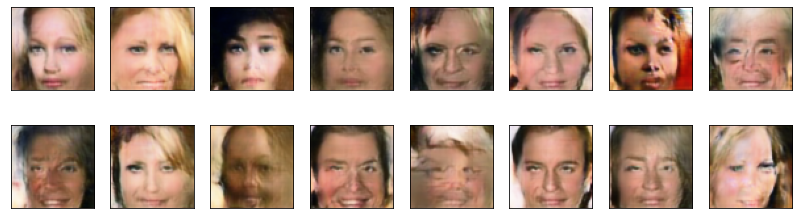

2024-10-31 11:44:58 | Epoch [87/100] | Batch 0/509 | d_loss: -15968972.0000 | g_loss: 8557096.0000
2024-10-31 11:45:42 | Epoch [87/100] | Batch 50/509 | d_loss: -16030188.0000 | g_loss: 8644451.0000
2024-10-31 11:46:26 | Epoch [87/100] | Batch 100/509 | d_loss: -16047817.0000 | g_loss: 8653032.0000
2024-10-31 11:47:09 | Epoch [87/100] | Batch 150/509 | d_loss: -16187360.0000 | g_loss: 8690400.0000
2024-10-31 11:47:53 | Epoch [87/100] | Batch 200/509 | d_loss: -16218760.0000 | g_loss: 8701136.0000
2024-10-31 11:48:37 | Epoch [87/100] | Batch 250/509 | d_loss: -16250484.0000 | g_loss: 8730826.0000
2024-10-31 11:49:21 | Epoch [87/100] | Batch 300/509 | d_loss: -16300135.0000 | g_loss: 8735842.0000
2024-10-31 11:50:05 | Epoch [87/100] | Batch 350/509 | d_loss: -16307118.0000 | g_loss: 8767126.0000
2024-10-31 11:50:48 | Epoch [87/100] | Batch 400/509 | d_loss: -16278684.0000 | g_loss: 8790530.0000
2024-10-31 11:51:32 | Epoch [87/100] | Batch 450/509 | d_loss: -16344734.0000 | g_loss: 877310

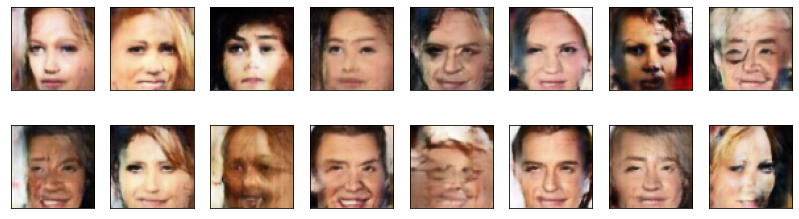

2024-10-31 11:52:28 | Epoch [88/100] | Batch 0/509 | d_loss: -31964.5000 | g_loss: -7539315.0000
2024-10-31 11:53:12 | Epoch [88/100] | Batch 50/509 | d_loss: -16164579.0000 | g_loss: 8771856.0000
2024-10-31 11:53:56 | Epoch [88/100] | Batch 100/509 | d_loss: -16328119.0000 | g_loss: 8713684.0000
2024-10-31 11:54:39 | Epoch [88/100] | Batch 150/509 | d_loss: -16184642.0000 | g_loss: 8765368.0000
2024-10-31 11:55:23 | Epoch [88/100] | Batch 200/509 | d_loss: -16379724.0000 | g_loss: 8775431.0000
2024-10-31 11:56:07 | Epoch [88/100] | Batch 250/509 | d_loss: -16409477.0000 | g_loss: 8804827.0000
2024-10-31 11:56:51 | Epoch [88/100] | Batch 300/509 | d_loss: -16412679.0000 | g_loss: 8839668.0000
2024-10-31 11:57:34 | Epoch [88/100] | Batch 350/509 | d_loss: -16461358.0000 | g_loss: 8836650.0000
2024-10-31 11:58:18 | Epoch [88/100] | Batch 400/509 | d_loss: -16467087.0000 | g_loss: 8857466.0000
2024-10-31 11:59:02 | Epoch [88/100] | Batch 450/509 | d_loss: -16512123.0000 | g_loss: 8883364.

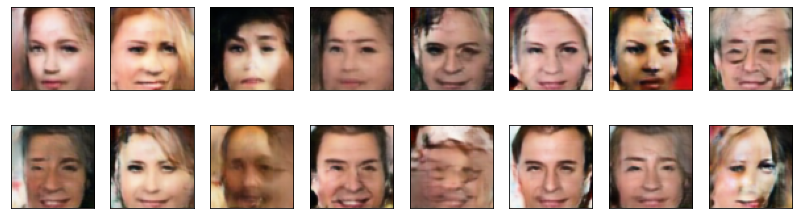

2024-10-31 11:59:58 | Epoch [89/100] | Batch 0/509 | d_loss: -16454415.0000 | g_loss: 8872767.0000
2024-10-31 12:00:42 | Epoch [89/100] | Batch 50/509 | d_loss: -16540893.0000 | g_loss: 8880416.0000
2024-10-31 12:01:25 | Epoch [89/100] | Batch 100/509 | d_loss: -16579900.0000 | g_loss: 8891610.0000
2024-10-31 12:02:09 | Epoch [89/100] | Batch 150/509 | d_loss: -16554895.0000 | g_loss: 8897747.0000
2024-10-31 12:02:53 | Epoch [89/100] | Batch 200/509 | d_loss: -16589150.0000 | g_loss: 8893886.0000
2024-10-31 12:03:37 | Epoch [89/100] | Batch 250/509 | d_loss: -16333272.0000 | g_loss: 8856128.0000
2024-10-31 12:04:21 | Epoch [89/100] | Batch 300/509 | d_loss: -16505390.0000 | g_loss: 8889270.0000
2024-10-31 12:05:04 | Epoch [89/100] | Batch 350/509 | d_loss: -16357257.0000 | g_loss: 8845392.0000
2024-10-31 12:05:48 | Epoch [89/100] | Batch 400/509 | d_loss: -16302748.0000 | g_loss: 8895930.0000
2024-10-31 12:06:32 | Epoch [89/100] | Batch 450/509 | d_loss: -371426.0000 | g_loss: 8920486.

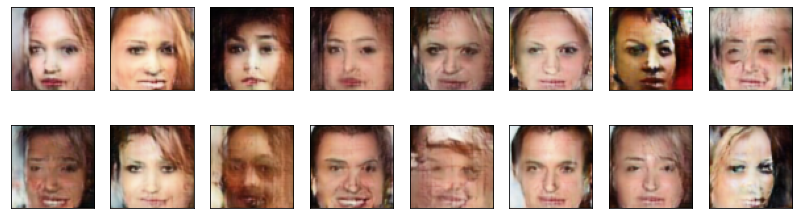

2024-10-31 12:07:28 | Epoch [90/100] | Batch 0/509 | d_loss: -16399897.0000 | g_loss: 8777941.0000
2024-10-31 12:08:12 | Epoch [90/100] | Batch 50/509 | d_loss: -16184646.0000 | g_loss: 8554912.0000
2024-10-31 12:08:56 | Epoch [90/100] | Batch 100/509 | d_loss: -15322752.0000 | g_loss: 8926416.0000
2024-10-31 12:09:40 | Epoch [90/100] | Batch 150/509 | d_loss: -15903638.0000 | g_loss: 8783120.0000
2024-10-31 12:10:24 | Epoch [90/100] | Batch 200/509 | d_loss: -16525255.0000 | g_loss: 8927283.0000
2024-10-31 12:11:07 | Epoch [90/100] | Batch 250/509 | d_loss: -16608510.0000 | g_loss: 8530165.0000
2024-10-31 12:11:51 | Epoch [90/100] | Batch 300/509 | d_loss: -16689356.0000 | g_loss: 8971802.0000
2024-10-31 12:12:35 | Epoch [90/100] | Batch 350/509 | d_loss: -16663720.0000 | g_loss: 8980054.0000
2024-10-31 12:13:19 | Epoch [90/100] | Batch 400/509 | d_loss: -16548777.0000 | g_loss: 8940160.0000
2024-10-31 12:14:02 | Epoch [90/100] | Batch 450/509 | d_loss: -16667946.0000 | g_loss: 891611

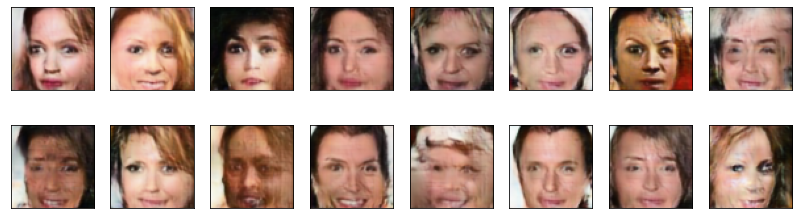

2024-10-31 12:14:58 | Epoch [91/100] | Batch 0/509 | d_loss: -16622256.0000 | g_loss: 9030832.0000
2024-10-31 12:15:42 | Epoch [91/100] | Batch 50/509 | d_loss: -16691389.0000 | g_loss: 8982848.0000
2024-10-31 12:16:26 | Epoch [91/100] | Batch 100/509 | d_loss: -16533575.0000 | g_loss: 8942005.0000
2024-10-31 12:17:10 | Epoch [91/100] | Batch 150/509 | d_loss: -16719108.0000 | g_loss: 8968222.0000
2024-10-31 12:17:54 | Epoch [91/100] | Batch 200/509 | d_loss: -16461762.0000 | g_loss: 8937360.0000
2024-10-31 12:18:38 | Epoch [91/100] | Batch 250/509 | d_loss: -16457771.0000 | g_loss: 8818703.0000
2024-10-31 12:19:22 | Epoch [91/100] | Batch 300/509 | d_loss: -16552003.0000 | g_loss: 8626482.0000
2024-10-31 12:20:05 | Epoch [91/100] | Batch 350/509 | d_loss: -16519368.0000 | g_loss: 8958164.0000
2024-10-31 12:20:49 | Epoch [91/100] | Batch 400/509 | d_loss: -13751246.0000 | g_loss: 8661764.0000
2024-10-31 12:21:33 | Epoch [91/100] | Batch 450/509 | d_loss: -16532140.0000 | g_loss: 886974

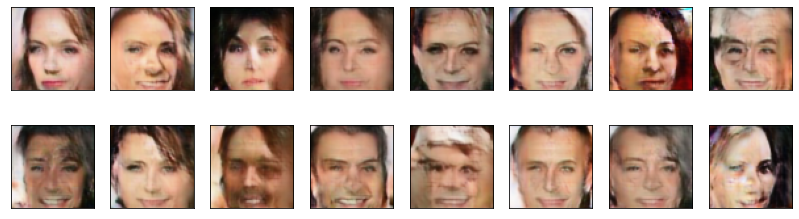

2024-10-31 12:22:29 | Epoch [92/100] | Batch 0/509 | d_loss: -16635800.0000 | g_loss: 8995080.0000
2024-10-31 12:23:13 | Epoch [92/100] | Batch 50/509 | d_loss: -16651395.0000 | g_loss: 8865264.0000
2024-10-31 12:23:57 | Epoch [92/100] | Batch 100/509 | d_loss: -16826488.0000 | g_loss: 9086086.0000
2024-10-31 12:24:41 | Epoch [92/100] | Batch 150/509 | d_loss: -16802550.0000 | g_loss: 9058612.0000
2024-10-31 12:25:24 | Epoch [92/100] | Batch 200/509 | d_loss: -76554.0000 | g_loss: 9129106.0000
2024-10-31 12:26:08 | Epoch [92/100] | Batch 250/509 | d_loss: -16712312.0000 | g_loss: 8512920.0000
2024-10-31 12:26:52 | Epoch [92/100] | Batch 300/509 | d_loss: -16294732.0000 | g_loss: 9012244.0000
2024-10-31 12:27:36 | Epoch [92/100] | Batch 350/509 | d_loss: -16853372.0000 | g_loss: 9012163.0000
2024-10-31 12:28:20 | Epoch [92/100] | Batch 400/509 | d_loss: -113258.0000 | g_loss: 9174462.0000
2024-10-31 12:29:04 | Epoch [92/100] | Batch 450/509 | d_loss: -16872060.0000 | g_loss: 9094471.000

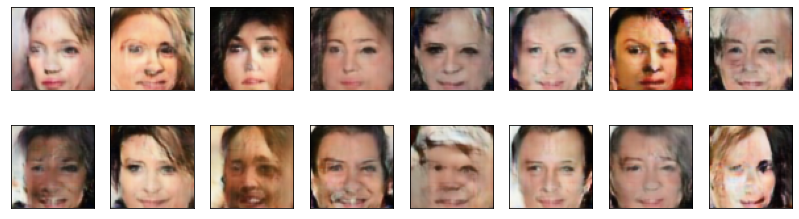

2024-10-31 12:30:00 | Epoch [93/100] | Batch 0/509 | d_loss: -16900378.0000 | g_loss: 9064377.0000
2024-10-31 12:30:44 | Epoch [93/100] | Batch 50/509 | d_loss: -16987836.0000 | g_loss: 9094972.0000
2024-10-31 12:31:28 | Epoch [93/100] | Batch 100/509 | d_loss: -16812032.0000 | g_loss: 9097197.0000
2024-10-31 12:32:12 | Epoch [93/100] | Batch 150/509 | d_loss: -16998038.0000 | g_loss: 9191959.0000
2024-10-31 12:32:56 | Epoch [93/100] | Batch 200/509 | d_loss: -17029146.0000 | g_loss: 9120074.0000
2024-10-31 12:33:40 | Epoch [93/100] | Batch 250/509 | d_loss: -16999236.0000 | g_loss: 9186706.0000
2024-10-31 12:34:23 | Epoch [93/100] | Batch 300/509 | d_loss: -17027636.0000 | g_loss: 9221664.0000
2024-10-31 12:35:07 | Epoch [93/100] | Batch 350/509 | d_loss: -17188464.0000 | g_loss: 9229658.0000
2024-10-31 12:35:51 | Epoch [93/100] | Batch 400/509 | d_loss: -17174960.0000 | g_loss: 9259371.0000
2024-10-31 12:36:35 | Epoch [93/100] | Batch 450/509 | d_loss: -17218336.0000 | g_loss: 924415

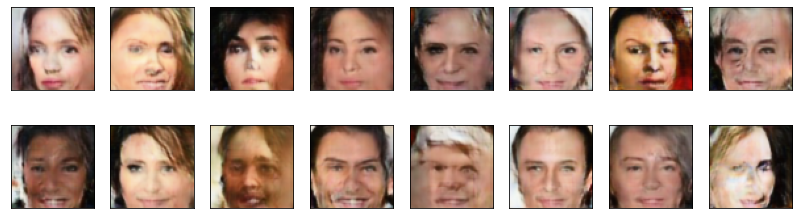

2024-10-31 12:37:31 | Epoch [94/100] | Batch 0/509 | d_loss: -17238980.0000 | g_loss: 9234589.0000
2024-10-31 12:38:15 | Epoch [94/100] | Batch 50/509 | d_loss: -17225512.0000 | g_loss: 9256542.0000
2024-10-31 12:38:59 | Epoch [94/100] | Batch 100/509 | d_loss: -17221414.0000 | g_loss: 9262538.0000
2024-10-31 12:39:43 | Epoch [94/100] | Batch 150/509 | d_loss: -17115936.0000 | g_loss: 9161762.0000
2024-10-31 12:40:26 | Epoch [94/100] | Batch 200/509 | d_loss: -17224962.0000 | g_loss: 9253656.0000
2024-10-31 12:41:10 | Epoch [94/100] | Batch 250/509 | d_loss: -17143796.0000 | g_loss: 9213510.0000
2024-10-31 12:41:54 | Epoch [94/100] | Batch 300/509 | d_loss: -17090152.0000 | g_loss: 9098922.0000
2024-10-31 12:42:38 | Epoch [94/100] | Batch 350/509 | d_loss: -16750054.0000 | g_loss: 9228056.0000
2024-10-31 12:43:22 | Epoch [94/100] | Batch 400/509 | d_loss: -16913160.0000 | g_loss: 9173829.0000
2024-10-31 12:44:06 | Epoch [94/100] | Batch 450/509 | d_loss: -16640782.0000 | g_loss: 926492

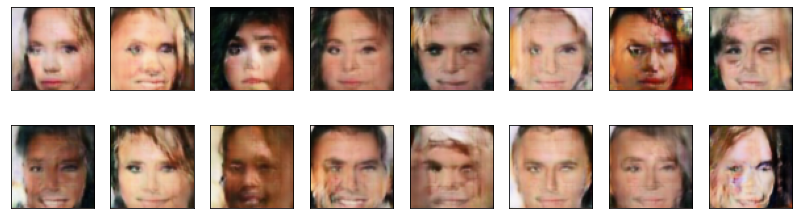

2024-10-31 12:45:01 | Epoch [95/100] | Batch 0/509 | d_loss: -17107358.0000 | g_loss: 9287672.0000
2024-10-31 12:45:45 | Epoch [95/100] | Batch 50/509 | d_loss: -17075300.0000 | g_loss: 9289873.0000
2024-10-31 12:46:29 | Epoch [95/100] | Batch 100/509 | d_loss: -17173930.0000 | g_loss: 9283735.0000
2024-10-31 12:47:13 | Epoch [95/100] | Batch 150/509 | d_loss: -17281408.0000 | g_loss: 9325984.0000
2024-10-31 12:47:57 | Epoch [95/100] | Batch 200/509 | d_loss: -17332654.0000 | g_loss: 9308142.0000
2024-10-31 12:48:41 | Epoch [95/100] | Batch 250/509 | d_loss: -17313048.0000 | g_loss: 9332179.0000
2024-10-31 12:49:24 | Epoch [95/100] | Batch 300/509 | d_loss: -17381176.0000 | g_loss: 9328634.0000
2024-10-31 12:50:08 | Epoch [95/100] | Batch 350/509 | d_loss: -17437250.0000 | g_loss: 9352890.0000
2024-10-31 12:50:52 | Epoch [95/100] | Batch 400/509 | d_loss: -17373710.0000 | g_loss: 9391456.0000
2024-10-31 12:51:36 | Epoch [95/100] | Batch 450/509 | d_loss: -17384860.0000 | g_loss: 936829

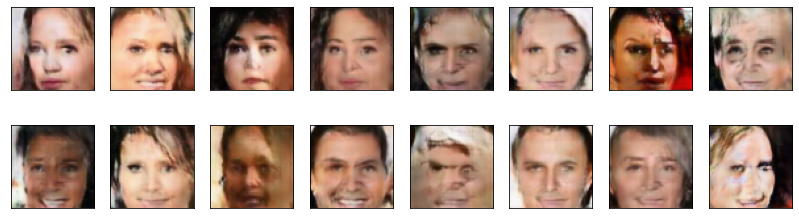

2024-10-31 12:52:31 | Epoch [96/100] | Batch 0/509 | d_loss: -17368000.0000 | g_loss: 9350882.0000
2024-10-31 12:53:15 | Epoch [96/100] | Batch 50/509 | d_loss: -17456288.0000 | g_loss: 9379776.0000
2024-10-31 12:53:59 | Epoch [96/100] | Batch 100/509 | d_loss: -17442632.0000 | g_loss: 9367373.0000
2024-10-31 12:54:43 | Epoch [96/100] | Batch 150/509 | d_loss: -17451350.0000 | g_loss: 9402115.0000
2024-10-31 12:55:27 | Epoch [96/100] | Batch 200/509 | d_loss: -17409080.0000 | g_loss: 9364822.0000
2024-10-31 12:56:10 | Epoch [96/100] | Batch 250/509 | d_loss: -17217720.0000 | g_loss: 9283233.0000
2024-10-31 12:56:54 | Epoch [96/100] | Batch 300/509 | d_loss: -17397504.0000 | g_loss: 9408710.0000
2024-10-31 12:57:38 | Epoch [96/100] | Batch 350/509 | d_loss: -17503424.0000 | g_loss: 9393352.0000
2024-10-31 12:58:22 | Epoch [96/100] | Batch 400/509 | d_loss: -17442520.0000 | g_loss: 9415855.0000
2024-10-31 12:59:06 | Epoch [96/100] | Batch 450/509 | d_loss: -17499418.0000 | g_loss: 942665

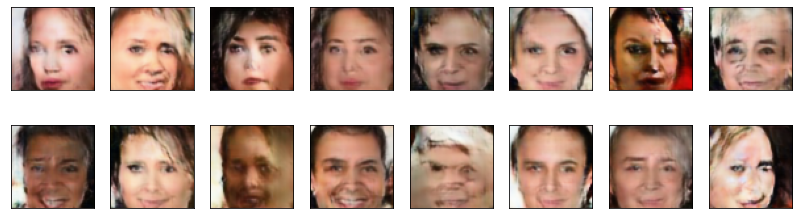

2024-10-31 13:00:02 | Epoch [97/100] | Batch 0/509 | d_loss: -17565248.0000 | g_loss: 9377740.0000
2024-10-31 13:00:45 | Epoch [97/100] | Batch 50/509 | d_loss: -17543596.0000 | g_loss: 9423634.0000
2024-10-31 13:01:29 | Epoch [97/100] | Batch 100/509 | d_loss: -17507520.0000 | g_loss: 9464939.0000
2024-10-31 13:02:13 | Epoch [97/100] | Batch 150/509 | d_loss: -17578776.0000 | g_loss: 9444993.0000
2024-10-31 13:02:57 | Epoch [97/100] | Batch 200/509 | d_loss: -17386904.0000 | g_loss: 9458926.0000
2024-10-31 13:03:40 | Epoch [97/100] | Batch 250/509 | d_loss: -17505184.0000 | g_loss: 9383952.0000
2024-10-31 13:04:24 | Epoch [97/100] | Batch 300/509 | d_loss: -17459224.0000 | g_loss: 9373182.0000
2024-10-31 13:05:08 | Epoch [97/100] | Batch 350/509 | d_loss: -17531760.0000 | g_loss: 9363755.0000
2024-10-31 13:05:52 | Epoch [97/100] | Batch 400/509 | d_loss: -17497848.0000 | g_loss: 9415368.0000
2024-10-31 13:06:36 | Epoch [97/100] | Batch 450/509 | d_loss: -17475860.0000 | g_loss: 941595

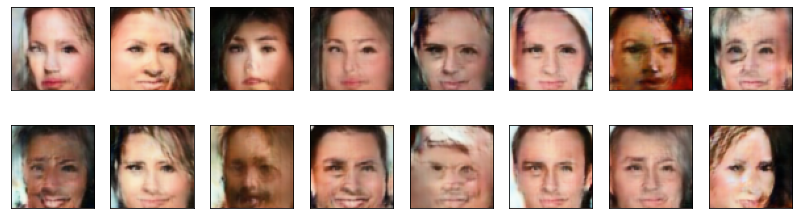

2024-10-31 13:07:32 | Epoch [98/100] | Batch 0/509 | d_loss: -17474660.0000 | g_loss: 9422674.0000
2024-10-31 13:08:16 | Epoch [98/100] | Batch 50/509 | d_loss: -17513512.0000 | g_loss: 9418416.0000
2024-10-31 13:08:59 | Epoch [98/100] | Batch 100/509 | d_loss: -17555104.0000 | g_loss: 9400592.0000
2024-10-31 13:09:43 | Epoch [98/100] | Batch 150/509 | d_loss: -17544744.0000 | g_loss: 9466836.0000
2024-10-31 13:10:27 | Epoch [98/100] | Batch 200/509 | d_loss: -17623558.0000 | g_loss: 9476728.0000
2024-10-31 13:11:11 | Epoch [98/100] | Batch 250/509 | d_loss: -17604148.0000 | g_loss: 9440036.0000
2024-10-31 13:11:55 | Epoch [98/100] | Batch 300/509 | d_loss: -17562132.0000 | g_loss: 9464034.0000
2024-10-31 13:12:39 | Epoch [98/100] | Batch 350/509 | d_loss: -17545278.0000 | g_loss: 9422759.0000
2024-10-31 13:13:23 | Epoch [98/100] | Batch 400/509 | d_loss: -17511902.0000 | g_loss: 9476079.0000
2024-10-31 13:14:07 | Epoch [98/100] | Batch 450/509 | d_loss: -17664076.0000 | g_loss: 949439

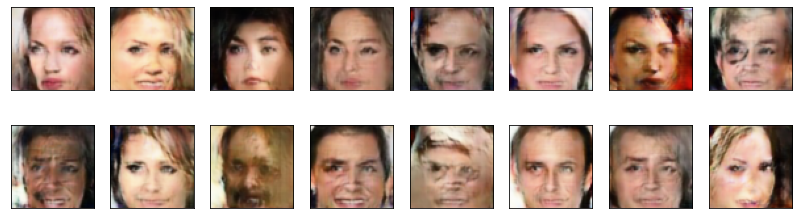

2024-10-31 13:15:02 | Epoch [99/100] | Batch 0/509 | d_loss: -17679516.0000 | g_loss: 9525146.0000
2024-10-31 13:15:46 | Epoch [99/100] | Batch 50/509 | d_loss: -17700238.0000 | g_loss: 9543787.0000
2024-10-31 13:16:30 | Epoch [99/100] | Batch 100/509 | d_loss: -17734950.0000 | g_loss: 9565262.0000
2024-10-31 13:17:14 | Epoch [99/100] | Batch 150/509 | d_loss: -17727196.0000 | g_loss: 9491360.0000
2024-10-31 13:17:58 | Epoch [99/100] | Batch 200/509 | d_loss: -17715330.0000 | g_loss: 9562049.0000
2024-10-31 13:18:41 | Epoch [99/100] | Batch 250/509 | d_loss: -17737238.0000 | g_loss: 9542472.0000
2024-10-31 13:19:25 | Epoch [99/100] | Batch 300/509 | d_loss: -17688554.0000 | g_loss: 9368044.0000
2024-10-31 13:20:09 | Epoch [99/100] | Batch 350/509 | d_loss: -17634556.0000 | g_loss: 9530220.0000
2024-10-31 13:20:53 | Epoch [99/100] | Batch 400/509 | d_loss: -17713992.0000 | g_loss: 9260982.0000
2024-10-31 13:21:37 | Epoch [99/100] | Batch 450/509 | d_loss: -17679424.0000 | g_loss: 954027

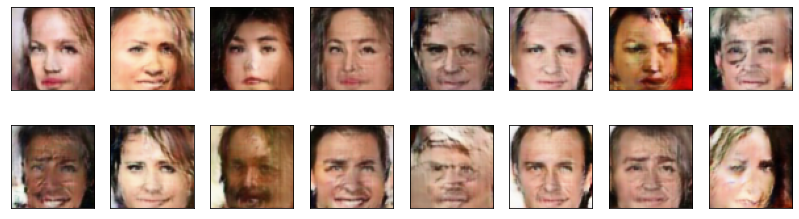

2024-10-31 13:22:32 | Epoch [100/100] | Batch 0/509 | d_loss: -17773386.0000 | g_loss: 9547326.0000
2024-10-31 13:23:15 | Epoch [100/100] | Batch 50/509 | d_loss: -17776152.0000 | g_loss: 9564813.0000
2024-10-31 13:23:59 | Epoch [100/100] | Batch 100/509 | d_loss: -17711926.0000 | g_loss: 9569149.0000
2024-10-31 13:24:43 | Epoch [100/100] | Batch 150/509 | d_loss: -17838684.0000 | g_loss: 9580488.0000
2024-10-31 13:25:27 | Epoch [100/100] | Batch 200/509 | d_loss: -17816522.0000 | g_loss: 9510523.0000
2024-10-31 13:26:10 | Epoch [100/100] | Batch 250/509 | d_loss: -17761858.0000 | g_loss: 9581374.0000
2024-10-31 13:26:54 | Epoch [100/100] | Batch 300/509 | d_loss: -17698534.0000 | g_loss: 9555092.0000
2024-10-31 13:27:38 | Epoch [100/100] | Batch 350/509 | d_loss: -17668924.0000 | g_loss: 9444120.0000
2024-10-31 13:28:22 | Epoch [100/100] | Batch 400/509 | d_loss: -17440686.0000 | g_loss: 9591003.0000
2024-10-31 13:29:06 | Epoch [100/100] | Batch 450/509 | d_loss: -17686360.0000 | g_lo

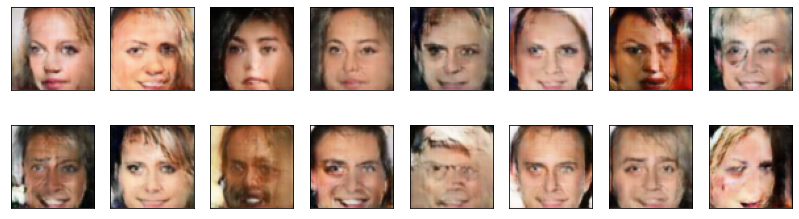

In [24]:
fixed_latent_vector = torch.randn(16, latent_dim, 1, 1).float().to(device)

resolutions = [4, 8, 16, 32, 64]
epochs_per_step = 11
critic_iterations = 2
alpha = 0
alpha_increment = 2 / n_epochs

losses = []

for epoch in range(n_epochs):
    generator.to(device)
    discriminator.to(device)
    # Calculate the current resolution step
    resolution_step = min(epoch // epochs_per_step, len(resolutions) - 1)
    # Adjust alpha for fade-in
    alpha = min(1.0, alpha + alpha_increment)
    for batch_i, real_images in enumerate(dataloader):
        real_images = real_images.to(device)
        ####################################

        # TODO: implement the training strategy
        for _ in range(critic_iterations): # training the discriminator 5 times for every 1 generator update
            d_loss = discriminator_step(batch_size, latent_dim, real_images, resolution_step, alpha)

        g_loss = generator_step(batch_size, latent_dim, resolution_step, alpha)

        ####################################
        
        if batch_i % print_every == 0:
            # append discriminator loss and generator loss
            d = d_loss['loss'].item()
            g = g_loss['loss'].item()
            losses.append((d, g))
            # print discriminator and generator loss
            time = str(datetime.now()).split('.')[0]
            print(f'{time} | Epoch [{epoch+1}/{n_epochs}] | Batch {batch_i}/{len(dataloader)} | d_loss: {d:.4f} | g_loss: {g:.4f}')
    
    # display images during training
    generator.eval()
    generated_images = generator(fixed_latent_vector, resolution_step, alpha)
    display(generated_images)
    generator.train()
    d_scheduler.step()
    g_scheduler.step()
    
    checkpoint(epoch, generator, discriminator)

### Training losses

Plot the training losses for the generator and discriminator.

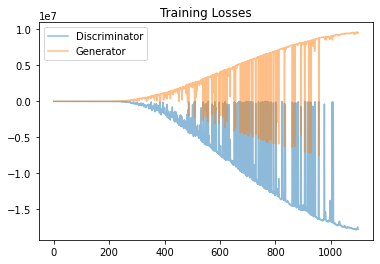

In [25]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

### Question: What do you notice about your generated samples and how might you improve this model?
When you answer this question, consider the following factors:
* The dataset is biased; it is made of "celebrity" faces that are mostly white
* Model size; larger models have the opportunity to learn more features in a data feature space
* Optimization strategy; optimizers and number of epochs affect your final result
* Loss functions

**Answer:** (Write your answer in this cell)

I used ProGAN to generate sample

- The dataset consists primarily of "celebrity" faces, which may not represent a wide variety of skin tones, facial structures, or demographics. A more diverse dataset would help the model generalize better across different demographics
- Increasing the model size by adding more layers or using larger channel sizes can improve the quality of generated samples
- Using Adam optimizers with hyperparameters suited for GAN training, like a low learning rate (0.0001–0.0002) and beta values of (0, 0.99), can improve stability.
- Number of epochs affect your final result is 34, more training epochs are usually beneficial, though I have to monitor for overfitting signs
- Standard loss functions like Wasserstein Loss with Gradient Penalty help ensure more stable training in GANs by promoting more realistic gradients in the discriminator

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb".  

Submit the notebook using the ***SUBMIT*** button in the bottom right corner of the Project Workspace.